In [1]:
# Cell 1: Install dependencies
!pip install rasterio matplotlib numpy

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 22.3/22.3 MB 88.5 MB/s eta 0:00:00


In [2]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [3]:
# Cell 3: Imports
import rasterio
import numpy as np
import matplotlib.pyplot as plt

In [4]:
def plot_water_mask(file_path, water_threshold=0.5):
    """
    Reads a TIF file and plots a geo-referenced binary water/no-water map.

    Parameters:
    - file_path: path to the TIF file
    - water_threshold: threshold for classifying water
    """
    with rasterio.open(file_path) as src:
        # Read the first band
        band = src.read(1)

        # Create binary water mask
        water_mask = (band > water_threshold).astype(int)

        # Get transform (geo-referencing info)
        transform = src.transform

        # Compute extent for plotting in real-world coordinates
        extent = [
            src.bounds.left,
            src.bounds.right,
            src.bounds.bottom,
            src.bounds.top
        ]

        # Plot
        plt.figure(figsize=(10, 8))
        plt.title(f"Water/No-Water Map (Threshold={water_threshold})")
        im = plt.imshow(
            water_mask,
            cmap="RdYlBu",
            vmin=0,
            vmax=1,
            extent=extent,
            origin="upper"
        )
        cbar = plt.colorbar(im, ticks=[0, 1], label="Class")
        cbar.set_ticklabels(['No Water (0)', 'Water (1)'])
        plt.xlabel("Longitude (or X in CRS)")
        plt.ylabel("Latitude (or Y in CRS)")
        plt.show()

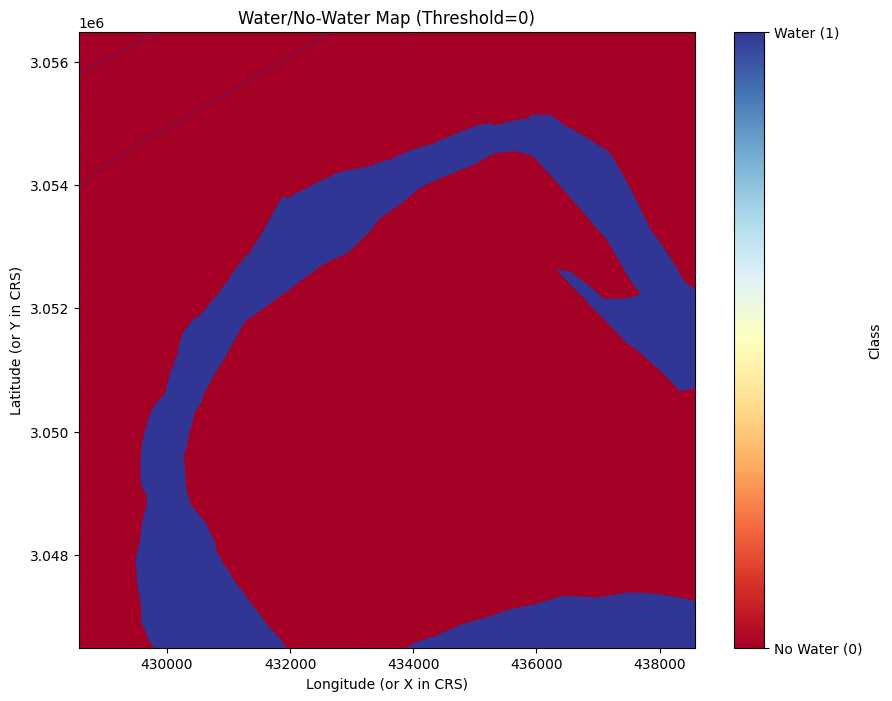

In [8]:
tif_file = "/content/drive/MyDrive/data/Annual_Flood_Aggregates_Sentinel1_trials_operational/Pakistan/flood_patches_top/Pakistan_2022_patch_2_flood.tif"

# Run the plotting function
plot_water_mask(tif_file, water_threshold=0)


In [ ]:
# Colab: uncomment to install
# !pip install earthengine-api pyproj tqdm

import ee
from pyproj import Geod
import math
import time
from tqdm import tqdm
import itertools
import sys

# -----------------------------
# USER PARAMETERS (EDIT IF NEEDED)
# -----------------------------
CENTER_LAT = 40.828066
CENTER_LON = -74.030586
REGION_SIZE_KM = 10.0          # Square region size (10 km x 10 km)
YEAR_LABEL = '2021'
START_DATE = '2021-01-01'
END_DATE = '2022-01-01'
EXPORT_TO_DRIVE = True
EXPORT_FOLDER = 'EE_Embeddings'   # Drive folder (created automatically if doesn't exist)
SCALE_METERS = 10
MAXPIXELS = 1e13
POLL_INTERVAL = 8                # seconds between status polls
EE_PROJECT = 'alpha-earth-473414'  # Replace with your GCP project ID

# Authenticate and initialize
ee.Authenticate()
ee.Initialize(project=EE_PROJECT)

# -----------------------------
# Geodesic helpers (pyproj.Geod)
# -----------------------------
geod = Geod(ellps="WGS84")

def destination_point(lat, lon, bearing_deg, distance_m):
    """
    Return (lat, lon) of point at distance_m and bearing_deg from (lat, lon).
    """
    lon2, lat2, backaz = geod.fwd(lon, lat, bearing_deg, distance_m)
    return lat2, lon2

# -----------------------------
# Compute region polygon coordinates
# -----------------------------
center_lat = CENTER_LAT
center_lon = CENTER_LON
half_size_m = (REGION_SIZE_KM / 2.0) * 1000.0  # 5 km in meters
corner_dist = half_size_m * math.sqrt(2.0)     # distance from center to corner

# Calculate corner coordinates: NW(315), NE(45), SE(135), SW(225)
nw_lat, nw_lon = destination_point(center_lat, center_lon, 315.0, corner_dist)
ne_lat, ne_lon = destination_point(center_lat, center_lon, 45.0, corner_dist)
se_lat, se_lon = destination_point(center_lat, center_lon, 135.0, corner_dist)
sw_lat, sw_lon = destination_point(center_lat, center_lon, 225.0, corner_dist)

# Create polygon coordinates (closed ring)
polygon_coords = [
    [nw_lon, nw_lat],
    [ne_lon, ne_lat],
    [se_lon, se_lat],
    [sw_lon, sw_lat],
    [nw_lon, nw_lat]
]

print(f"Region center: {center_lat:.6f}, {center_lon:.6f}")
print(f"Region size: {REGION_SIZE_KM} km x {REGION_SIZE_KM} km")

# -----------------------------
# Prepare collection and export
# -----------------------------
dataset_id = 'GOOGLE/SATELLITE_EMBEDDING/V1/ANNUAL'
collection = ee.ImageCollection(dataset_id)

def make_export_task(img, year_label):
    file_basename = f"embedding_{year_label}_region"
    description = f"{file_basename}_{int(time.time())}"

    if EXPORT_TO_DRIVE:
        task = ee.batch.Export.image.toDrive(
            image=img,
            description=description,
            folder=EXPORT_FOLDER,
            fileNamePrefix=file_basename,
            region=polygon_coords,
            scale=SCALE_METERS,
            crs='EPSG:4326',
            maxPixels=MAXPIXELS
        )
    else:
        # Change bucket name if you prefer GCS
        task = ee.batch.Export.image.toCloudStorage(
            image=img,
            description=description,
            bucket='your-bucket-name',
            fileNamePrefix=file_basename,
            region=polygon_coords,
            scale=SCALE_METERS,
            crs='EPSG:4326',
            maxPixels=MAXPIXELS
        )
    return task, file_basename

# Create region geometry
region_geom = ee.Geometry.Polygon(polygon_coords)

# Filter collection for the specified year and region
filtered_collection = collection.filterDate(START_DATE, END_DATE).filterBounds(region_geom)
img = filtered_collection.first()

if img is None:
    # Fallback: try using mean of all images in the collection
    try:
        img = filtered_collection.mean()
        print("[INFO] Using mean() mosaic (no single image returned by first()).")
    except Exception as e:
        print(f"[ERROR] No image available for the region in {YEAR_LABEL}. Error: {str(e)}")
        sys.exit(1)

# Start export task
task, basename = make_export_task(img, YEAR_LABEL)
task.start()
print(f"Started export task: {basename}")
print(f"Earth Engine task ID: {task.id}")

# -----------------------------
# Poll task status with progress bar
# -----------------------------
print(f"\nExporting {REGION_SIZE_KM}km x {REGION_SIZE_KM}km region to Google Drive folder: {EXPORT_FOLDER}")
print("Polling task status...")

spinner = itertools.cycle(['|', '/', '-', '\\'])
task_complete = False

try:
    with tqdm(total=100, desc="Export progress", bar_format="{l_bar}{bar}| {n_fmt}/{total_fmt}% ") as pbar:
        last_progress = 0

        while not task_complete:
            try:
                status = task.status()
                state = status.get('state', 'UNKNOWN')
                progress = status.get('progress')

                # Handle progress display
                if progress is not None:
                    try:
                        if isinstance(progress, (int, float)):
                            val = float(progress)
                            if val <= 1.0:
                                current_progress = int(val * 100)
                            else:
                                current_progress = int(val)
                        else:
                            current_progress = last_progress
                    except:
                        current_progress = last_progress
                else:
                    # No numeric progress, increment slowly for visual feedback
                    current_progress = min(last_progress + 1, 95)

                # Update progress bar
                if current_progress > last_progress:
                    pbar.update(current_progress - last_progress)
                    last_progress = current_progress

                # Print status update
                if progress is not None:
                    print(f"\rTask state: {state} - Progress: {current_progress}%", end='')
                else:
                    print(f"\rTask state: {state} - {next(spinner)}", end='')

                # Check if task is complete
                if state in ('COMPLETED', 'FAILED', 'CANCELLED'):
                    task_complete = True
                    if state == 'COMPLETED' and last_progress < 100:
                        pbar.update(100 - last_progress)
                    break

            except Exception as e:
                print(f"\nError checking task status: {str(e)}")
                break

            time.sleep(POLL_INTERVAL)

except KeyboardInterrupt:
    print("\nPolling interrupted by user. Task is still running server-side in Earth Engine.")

# Final status
print(f"\n\nFinal task status:")
try:
    final_status = task.status()
    state = final_status.get('state', 'UNKNOWN')
    print(f"Task: {basename}")
    print(f"State: {state}")

    if state == 'COMPLETED':
        print(f"✅ Export completed successfully!")
        print(f"Check your Google Drive folder: {EXPORT_FOLDER}")
    elif state == 'FAILED':
        error_msg = final_status.get('error_message', 'No error message available')
        print(f"❌ Export failed: {error_msg}")
    elif state == 'CANCELLED':
        print(f"⚠️  Export was cancelled")
    else:
        print(f"Task is still in state: {state}")

except Exception as e:
    print(f"Could not get final status: {str(e)}")

print(f"\nRegion exported:")
print(f"- Center: {center_lat:.6f}, {center_lon:.6f}")
print(f"- Size: {REGION_SIZE_KM} km x {REGION_SIZE_KM} km")
print(f"- Year: {YEAR_LABEL}")
print(f"- Scale: {SCALE_METERS} meters per pixel")

Region center: 40.828066, -74.030586
Region size: 10.0 km x 10.0 km
Started export task: embedding_2021_region
Earth Engine task ID: KPJMNQJ24HUI7E7HJD65OEYH

Exporting 10.0km x 10.0km region to Google Drive folder: EE_Embeddings
Polling task status...


Export progress:   1%|          | 1/100% 

Task state: READY - |

Export progress:   2%|▏         | 2/100% 

Task state: RUNNING - /

Export progress:   3%|▎         | 3/100% 

Task state: RUNNING - -

Export progress:   4%|▍         | 4/100% 

Task state: RUNNING - \

Export progress:   5%|▌         | 5/100% 

Task state: RUNNING - |

Export progress:   6%|▌         | 6/100% 

Task state: RUNNING - /

Export progress:   7%|▋         | 7/100% 

Task state: RUNNING - -

Export progress:   8%|▊         | 8/100% 

Task state: RUNNING - \

Export progress:   9%|▉         | 9/100% 

Task state: RUNNING - |

Export progress:  10%|█         | 10/100% 

Task state: RUNNING - /

Export progress:  11%|█         | 11/100% 

Task state: RUNNING - -

Export progress:  12%|█▏        | 12/100% 

Task state: RUNNING - \

Export progress:  13%|█▎        | 13/100% 

Task state: RUNNING - |

Export progress:  14%|█▍        | 14/100% 

Task state: RUNNING - /

Export progress:  15%|█▌        | 15/100% 

Task state: RUNNING - -

Export progress:  16%|█▌        | 16/100% 

Task state: RUNNING - \

Export progress:  17%|█▋        | 17/100% 

Task state: RUNNING - |

Export progress:  18%|█▊        | 18/100% 

Task state: RUNNING - /

Export progress:  19%|█▉        | 19/100% 

Task state: RUNNING - -

Export progress:  20%|██        | 20/100% 

Task state: RUNNING - \

Export progress:  21%|██        | 21/100% 

Task state: RUNNING - |

Export progress:  22%|██▏       | 22/100% 

Task state: RUNNING - /

Export progress:  23%|██▎       | 23/100% 

Task state: RUNNING - -

Export progress:  24%|██▍       | 24/100% 

Task state: RUNNING - \

Export progress:  25%|██▌       | 25/100% 

Task state: RUNNING - |

Export progress:  26%|██▌       | 26/100% 

Task state: RUNNING - /

Export progress:  27%|██▋       | 27/100% 

Task state: RUNNING - -

Export progress:  28%|██▊       | 28/100% 

Task state: RUNNING - \

Export progress:  29%|██▉       | 29/100% 

Task state: RUNNING - |

Export progress:  30%|███       | 30/100% 

Task state: RUNNING - /

Export progress:  31%|███       | 31/100% 

Task state: RUNNING - -

Export progress:  32%|███▏      | 32/100% 

Task state: RUNNING - \

Export progress:  33%|███▎      | 33/100% 

Task state: RUNNING - |

Export progress:  34%|███▍      | 34/100% 

Task state: RUNNING - /

Export progress:  35%|███▌      | 35/100% 

Task state: RUNNING - -

Export progress:  36%|███▌      | 36/100% 

Task state: RUNNING - \

Export progress:  37%|███▋      | 37/100% 

Task state: RUNNING - |

Export progress:  38%|███▊      | 38/100% 

Task state: RUNNING - /

Export progress:  39%|███▉      | 39/100% 

Task state: RUNNING - -

Export progress:  40%|████      | 40/100% 

Task state: RUNNING - \

Export progress:  41%|████      | 41/100% 

Task state: RUNNING - |

Export progress:  42%|████▏     | 42/100% 

Task state: RUNNING - /

Export progress:  43%|████▎     | 43/100% 

Task state: RUNNING - -

Export progress:  44%|████▍     | 44/100% 

Task state: RUNNING - \

Export progress:  45%|████▌     | 45/100% 

Task state: RUNNING - |

Export progress:  46%|████▌     | 46/100% 

Task state: RUNNING - /

Export progress:  47%|████▋     | 47/100% 

Task state: RUNNING - -

Export progress:  48%|████▊     | 48/100% 

Task state: RUNNING - \

Export progress:  49%|████▉     | 49/100% 

Task state: RUNNING - |

Export progress:  50%|█████     | 50/100% 

Task state: RUNNING - /

Export progress:  51%|█████     | 51/100% 

Task state: RUNNING - -

Export progress:  52%|█████▏    | 52/100% 

Task state: RUNNING - \

Export progress:  53%|█████▎    | 53/100% 

Task state: RUNNING - |

Export progress:  54%|█████▍    | 54/100% 

Task state: RUNNING - /

Export progress:  55%|█████▌    | 55/100% 

Task state: RUNNING - -

Export progress:  56%|█████▌    | 56/100% 

Task state: RUNNING - \

Export progress:  57%|█████▋    | 57/100% 

Task state: RUNNING - |

Export progress:  58%|█████▊    | 58/100% 

Task state: RUNNING - /

Export progress:  59%|█████▉    | 59/100% 

Task state: RUNNING - -

Export progress:  60%|██████    | 60/100% 

Task state: RUNNING - \

Export progress:  61%|██████    | 61/100% 

Task state: RUNNING - |

Export progress:  62%|██████▏   | 62/100% 

Task state: RUNNING - /

Export progress:  63%|██████▎   | 63/100% 

Task state: RUNNING - -

Export progress:  64%|██████▍   | 64/100% 

Task state: RUNNING - \

Export progress:  65%|██████▌   | 65/100% 

Task state: RUNNING - |

Export progress:  66%|██████▌   | 66/100% 

Task state: RUNNING - /

Export progress:  67%|██████▋   | 67/100% 

Task state: RUNNING - -

Export progress:  68%|██████▊   | 68/100% 

Task state: RUNNING - \

Export progress:  69%|██████▉   | 69/100% 

Task state: RUNNING - |

Export progress:  70%|███████   | 70/100% 

Task state: RUNNING - /

Export progress:  71%|███████   | 71/100% 

Task state: RUNNING - -

Export progress:  72%|███████▏  | 72/100% 

Task state: RUNNING - \

Export progress:  73%|███████▎  | 73/100% 

Task state: RUNNING - |

Export progress:  74%|███████▍  | 74/100% 

Task state: RUNNING - /

Export progress:  75%|███████▌  | 75/100% 

Task state: RUNNING - -

Export progress:  76%|███████▌  | 76/100% 

Task state: RUNNING - \

Export progress:  77%|███████▋  | 77/100% 

Task state: RUNNING - |

Export progress:  78%|███████▊  | 78/100% 

Task state: RUNNING - /

Export progress:  79%|███████▉  | 79/100% 

Task state: RUNNING - -

Export progress:  80%|████████  | 80/100% 

Task state: RUNNING - \

Export progress:  81%|████████  | 81/100% 

Task state: RUNNING - |

Export progress:  82%|████████▏ | 82/100% 

Task state: RUNNING - /

Export progress:  83%|████████▎ | 83/100% 

Task state: RUNNING - -

Export progress:  84%|████████▍ | 84/100% 

Task state: RUNNING - \

Export progress:  85%|████████▌ | 85/100% 

Task state: RUNNING - |

Export progress:  86%|████████▌ | 86/100% 

Task state: RUNNING - /

Export progress:  87%|████████▋ | 87/100% 

Task state: RUNNING - -

Export progress:  88%|████████▊ | 88/100% 

Task state: RUNNING - \

Export progress:  89%|████████▉ | 89/100% 

Task state: RUNNING - |

Export progress:  90%|█████████ | 90/100% 

Task state: RUNNING - /

Export progress:  91%|█████████ | 91/100% 

Task state: RUNNING - -

Export progress:  92%|█████████▏| 92/100% 

Task state: RUNNING - \

Export progress:  93%|█████████▎| 93/100% 

Task state: RUNNING - |

Export progress:  94%|█████████▍| 94/100% 

Task state: RUNNING - /

Export progress:  95%|█████████▌| 95/100% 

Task state: RUNNING - \

Export progress: 100%|██████████| 100/100% 

Task state: COMPLETED - |

Final task status:
Task: embedding_2021_region
State: COMPLETED
✅ Export completed successfully!
Check your Google Drive folder: EE_Embeddings

Region exported:
- Center: 40.828066, -74.030586
- Size: 10.0 km x 10.0 km
- Year: 2021
- Scale: 10 meters per pixel


🎨 Earth Engine Embedding PCA Visualization
Loading embedding data from: /content/drive/MyDrive/EE_Embeddings/embedding_2021_region.tif
Data shape: (64, 1003, 1321)
Number of bands (dimensions): 64
Spatial dimensions: 1003 x 1321
Original pixels: 1324963
Valid pixels (no NaN): 1324963

Applying PCA to reduce 64 dimensions to 3...
Standardizing data...
PCA explained variance ratio: [0.26233374 0.15893532 0.11704304]
Total variance explained: 0.538
Applying contrast stretching...

✅ Successfully created PCA visualization!
RGB image shape: (1003, 1321, 3)
Total variance explained by 3 components: 53.8%


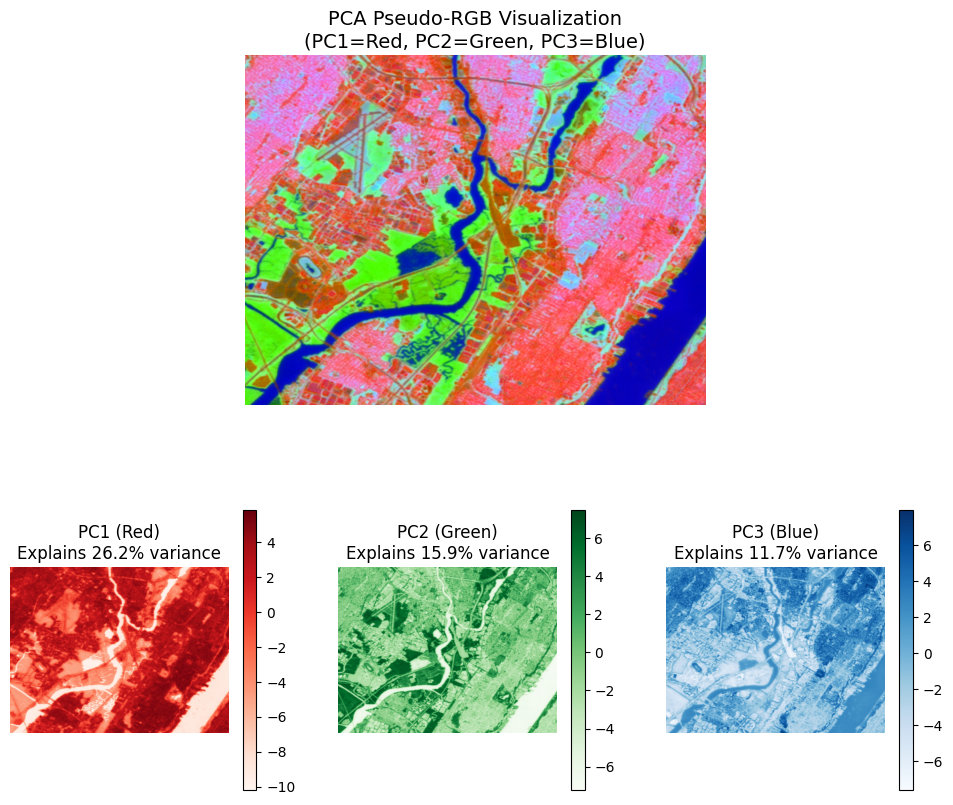

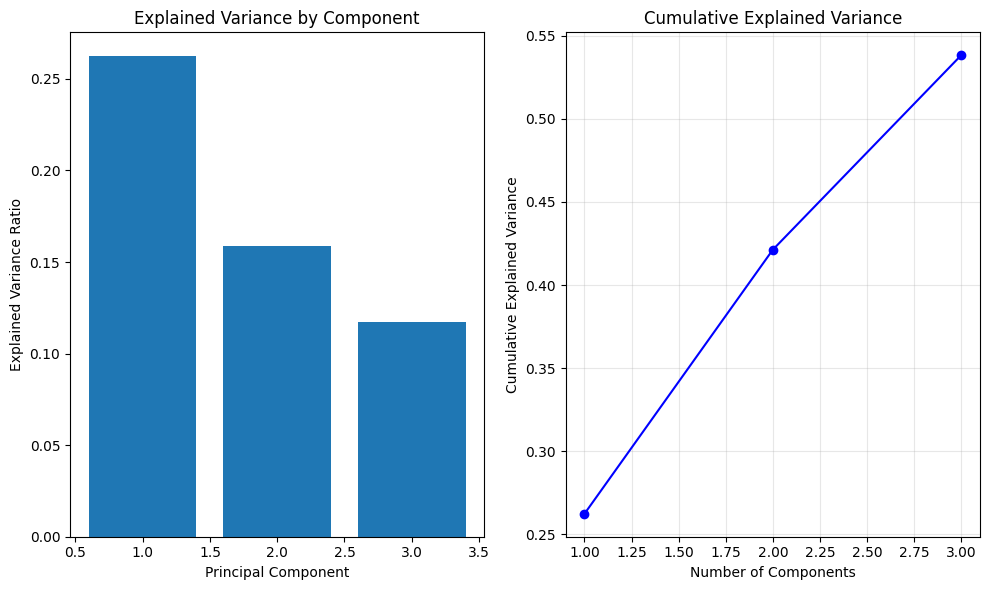

In [ ]:
# Colab: uncomment to install required packages
# !pip install rasterio scikit-learn matplotlib numpy

import numpy as np
import rasterio
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
import os
import glob

# -----------------------------
# USER PARAMETERS
# -----------------------------
# Path to your downloaded GeoTIFF file
# Update this path to match your downloaded file
GEOTIFF_PATH = "/content/drive/MyDrive/EE_Embeddings/embedding_2021_region.tif"

# PCA and visualization settings
NORMALIZE_DATA = True          # Whether to standardize data before PCA
CONTRAST_STRETCH = True        # Apply contrast stretching to improve visualization
FIGSIZE = (12, 10)            # Figure size for plots

def load_embedding_data(file_path):
    """Load the 64-dimensional embedding data from GeoTIFF."""
    print(f"Loading embedding data from: {file_path}")

    with rasterio.open(file_path) as src:
        # Read all bands (should be 64 dimensions)
        data = src.read()  # Shape: (bands, height, width)
        profile = src.profile

    print(f"Data shape: {data.shape}")
    print(f"Number of bands (dimensions): {data.shape[0]}")
    print(f"Spatial dimensions: {data.shape[1]} x {data.shape[2]}")

    return data, profile

def reshape_for_pca(data):
    """Reshape spatial data for PCA processing."""
    bands, height, width = data.shape

    # Reshape to (pixels, bands) for PCA
    reshaped = data.reshape(bands, -1).T  # Shape: (height*width, bands)

    # Handle NaN/invalid values
    valid_mask = ~np.isnan(reshaped).any(axis=1)
    valid_data = reshaped[valid_mask]

    print(f"Original pixels: {height * width}")
    print(f"Valid pixels (no NaN): {valid_data.shape[0]}")

    return reshaped, valid_mask, (height, width)

def apply_pca(data, n_components=3, normalize=True):
    """Apply PCA to reduce dimensionality."""
    print(f"\nApplying PCA to reduce {data.shape[1]} dimensions to {n_components}...")

    # Remove invalid pixels for PCA fitting
    valid_mask = ~np.isnan(data).any(axis=1)
    valid_data = data[valid_mask]

    if normalize:
        print("Standardizing data...")
        scaler = StandardScaler()
        valid_data_scaled = scaler.fit_transform(valid_data)
    else:
        valid_data_scaled = valid_data
        scaler = None

    # Fit PCA
    pca = PCA(n_components=n_components)
    pca_result = pca.fit_transform(valid_data_scaled)

    # Transform all data (including invalid pixels)
    if normalize and scaler is not None:
        data_scaled = scaler.transform(np.nan_to_num(data, nan=0))
    else:
        data_scaled = np.nan_to_num(data, nan=0)

    full_pca_result = pca.transform(data_scaled)

    # Restore NaN values where original data was invalid
    full_pca_result[~valid_mask] = np.nan

    print(f"PCA explained variance ratio: {pca.explained_variance_ratio_}")
    print(f"Total variance explained: {pca.explained_variance_ratio_.sum():.3f}")

    return full_pca_result, pca

def contrast_stretch(data, percentiles=(2, 98)):
    """Apply percentile-based contrast stretching."""
    stretched = np.zeros_like(data)

    for i in range(data.shape[1]):
        band = data[:, i]
        valid_values = band[~np.isnan(band)]

        if len(valid_values) > 0:
            p_low, p_high = np.percentile(valid_values, percentiles)
            band_stretched = np.clip((band - p_low) / (p_high - p_low), 0, 1)
            stretched[:, i] = band_stretched
        else:
            stretched[:, i] = band

    return stretched

def create_rgb_image(pca_data, spatial_shape, contrast_stretch_flag=True):
    """Convert PCA components to RGB image."""
    height, width = spatial_shape

    # Reshape back to spatial dimensions
    rgb_data = pca_data.reshape(height, width, 3)

    if contrast_stretch_flag:
        print("Applying contrast stretching...")
        # Flatten for contrast stretching
        flat_data = rgb_data.reshape(-1, 3)
        stretched = contrast_stretch(flat_data)
        rgb_data = stretched.reshape(height, width, 3)
    else:
        # Simple min-max normalization
        for i in range(3):
            channel = rgb_data[:, :, i]
            valid_mask = ~np.isnan(channel)
            if valid_mask.any():
                channel_min = np.nanmin(channel)
                channel_max = np.nanmax(channel)
                rgb_data[:, :, i] = (channel - channel_min) / (channel_max - channel_min)

    # Handle any remaining NaN values
    rgb_data = np.nan_to_num(rgb_data, nan=0)

    return rgb_data

def plot_visualization(rgb_image, pca_components, pca_obj):
    """Create comprehensive visualization plots."""
    fig = plt.figure(figsize=FIGSIZE)

    # Main RGB visualization
    ax1 = plt.subplot(2, 2, (1, 2))
    plt.imshow(rgb_image)
    plt.title('PCA Pseudo-RGB Visualization\n(PC1=Red, PC2=Green, PC3=Blue)', fontsize=14)
    plt.axis('off')

    # Individual components
    ax2 = plt.subplot(2, 3, 4)
    pc1 = pca_components.reshape(rgb_image.shape[0], rgb_image.shape[1], 3)[:, :, 0]
    plt.imshow(pc1, cmap='Reds')
    plt.title(f'PC1 (Red)\nExplains {pca_obj.explained_variance_ratio_[0]:.1%} variance')
    plt.axis('off')
    plt.colorbar(shrink=0.8)

    ax3 = plt.subplot(2, 3, 5)
    pc2 = pca_components.reshape(rgb_image.shape[0], rgb_image.shape[1], 3)[:, :, 1]
    plt.imshow(pc2, cmap='Greens')
    plt.title(f'PC2 (Green)\nExplains {pca_obj.explained_variance_ratio_[1]:.1%} variance')
    plt.axis('off')
    plt.colorbar(shrink=0.8)

    ax4 = plt.subplot(2, 3, 6)
    pc3 = pca_components.reshape(rgb_image.shape[0], rgb_image.shape[1], 3)[:, :, 2]
    plt.imshow(pc3, cmap='Blues')
    plt.title(f'PC3 (Blue)\nExplains {pca_obj.explained_variance_ratio_[2]:.1%} variance')
    plt.axis('off')
    plt.colorbar(shrink=0.8)

    plt.tight_layout()
    plt.show()

    # Plot explained variance
    plt.figure(figsize=(10, 6))

    plt.subplot(1, 2, 1)
    plt.bar(range(1, len(pca_obj.explained_variance_ratio_) + 1),
            pca_obj.explained_variance_ratio_)
    plt.xlabel('Principal Component')
    plt.ylabel('Explained Variance Ratio')
    plt.title('Explained Variance by Component')

    plt.subplot(1, 2, 2)
    cumsum = np.cumsum(pca_obj.explained_variance_ratio_)
    plt.plot(range(1, len(cumsum) + 1), cumsum, 'bo-')
    plt.xlabel('Number of Components')
    plt.ylabel('Cumulative Explained Variance')
    plt.title('Cumulative Explained Variance')
    plt.grid(True, alpha=0.3)

    plt.tight_layout()
    plt.show()

def main():
    """Main processing pipeline."""
    # Check if file exists
    if not os.path.exists(GEOTIFF_PATH):
        print(f"❌ File not found: {GEOTIFF_PATH}")
        print("\nLooking for GeoTIFF files in common locations...")

        # Search for potential files
        search_patterns = [
            "/content/drive/MyDrive/EE_Embeddings/*.tif",
            "/content/drive/MyDrive/EE_Embeddings/*.tiff",
            "/content/*.tif",
            "/content/*.tiff"
        ]

        found_files = []
        for pattern in search_patterns:
            found_files.extend(glob.glob(pattern))

        if found_files:
            print("Found these GeoTIFF files:")
            for i, file in enumerate(found_files):
                print(f"  {i+1}. {file}")
            print(f"\nUpdate GEOTIFF_PATH variable to use one of these files.")
        else:
            print("No GeoTIFF files found. Make sure you've downloaded the embedding data first.")
        return

    try:
        # Load data
        data, profile = load_embedding_data(GEOTIFF_PATH)

        # Prepare data for PCA
        reshaped_data, valid_mask, spatial_shape = reshape_for_pca(data)

        # Apply PCA
        pca_result, pca_obj = apply_pca(reshaped_data,
                                      n_components=3,
                                      normalize=NORMALIZE_DATA)

        # Create RGB image
        rgb_image = create_rgb_image(pca_result, spatial_shape, CONTRAST_STRETCH)

        print(f"\n✅ Successfully created PCA visualization!")
        print(f"RGB image shape: {rgb_image.shape}")
        print(f"Total variance explained by 3 components: {pca_obj.explained_variance_ratio_.sum():.1%}")

        # Create visualizations
        plot_visualization(rgb_image, pca_result, pca_obj)

    except Exception as e:
        print(f"❌ Error during processing: {str(e)}")
        import traceback
        traceback.print_exc()

if __name__ == "__main__":
    print("🎨 Earth Engine Embedding PCA Visualization")
    print("=" * 50)
    main()

✅ Earth Engine initialized successfully
🌊 Flood Mask and Earth Engine Embedding Analysis
📍 Analyzing flood mask: Albania_2021_patch_1_flood.tif
   Shape: (1000, 1000)
   CRS: EPSG:32634
   Bounds: BoundingBox(left=374850.0, bottom=4650670.0, right=384850.0, top=4660670.0)
   Resolution: 10.0m x 10.0m
   Center (native CRS): 379850.00, 4655670.00
   Center (WGS84): 42.043901°N, 19.548240°E
   Region size: 10.17 x nan km
   Using square region: 10.17 km
   Flood coverage: 50,730 pixels (5.07%)

🛰️  Downloading Earth Engine embeddings...
   Started export task: embedding_2021_flood_region
   Waiting for export to complete...


   Export progress: 100%|██████████| 100/100 [06:35<00:00,  3.96s/it]


   ✅ Export completed: /content/drive/MyDrive/EE_Flood_Analysis/embedding_2021_flood_region.tif

🧠 Processing Earth Engine embeddings...
   Embedding shape: (64, 1021, 1370)
   Dimensions: 64
   Valid pixels: 1,398,770 / 1,398,770
   PCA explained variance: [0.17131728 0.1359831  0.10538498]
   Total variance explained: 41.3%

🎨 Creating visualization...


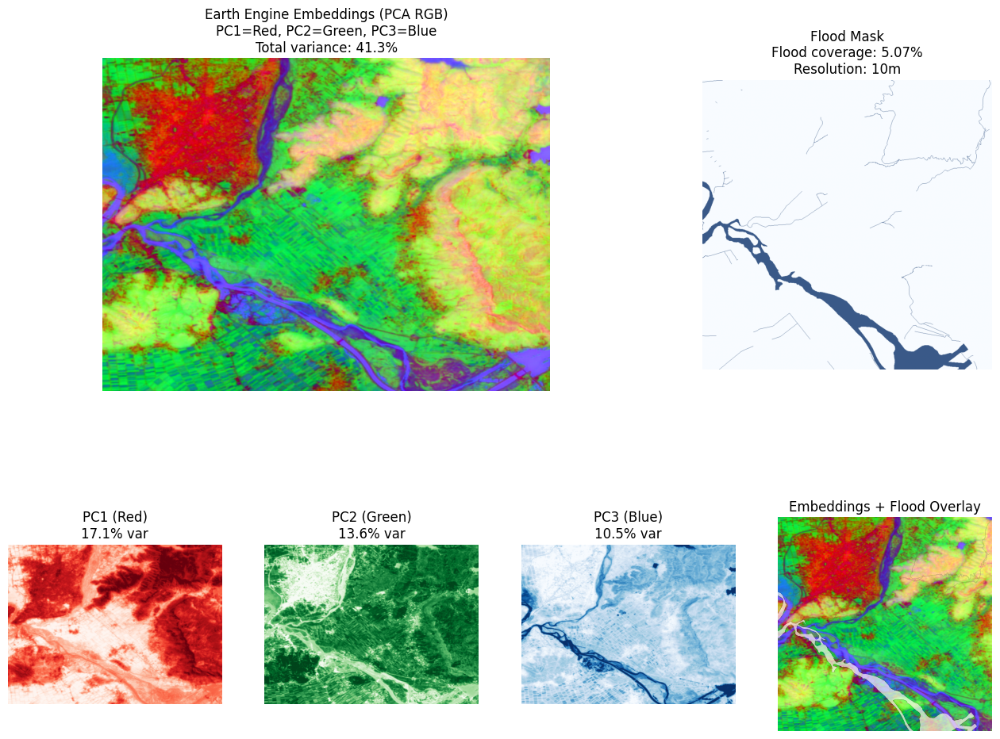

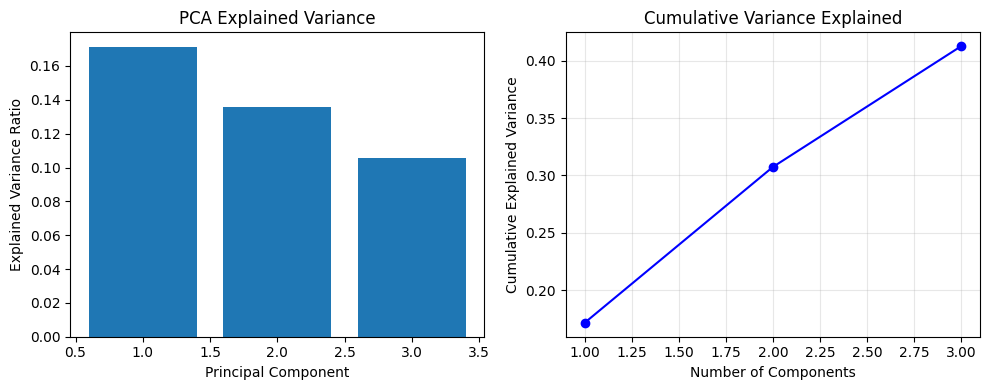


✅ Analysis completed successfully!
   Flood region: 42.043901°N, 19.548240°E
   Region size: 10.17 km
   Flood coverage: 5.07%
   Embedding file: /content/drive/MyDrive/EE_Flood_Analysis/embedding_2021_flood_region.tif


In [ ]:
# Colab: uncomment to install required packages
# !pip install earthengine-api pyproj tqdm rasterio scikit-learn matplotlib numpy

import ee
import numpy as np
import rasterio
from rasterio.warp import transform_bounds
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
from pyproj import Geod, Transformer
import math
import time
from tqdm import tqdm
import itertools
import sys
import os

# -----------------------------
# USER PARAMETERS
# -----------------------------
# Path to your flood mask TIFF file
FLOOD_TIFF_PATH = "/content/drive/MyDrive/data/Annual_Flood_Aggregates_Sentinel1_trials_operational/Albania/flood_patches_top/Albania_2021_patch_1_flood.tif"

# Earth Engine parameters
EE_PROJECT = 'alpha-earth-473414'  # Replace with your GCP project ID
YEAR_LABEL = '2021'
START_DATE = '2021-01-01'
END_DATE = '2022-01-01'
EXPORT_TO_DRIVE = True
EXPORT_FOLDER = 'EE_Flood_Analysis'
SCALE_METERS = 10  # Match the flood mask resolution
MAXPIXELS = 1e13
POLL_INTERVAL = 8

# Visualization parameters
NORMALIZE_PCA = True
CONTRAST_STRETCH = True
FIGSIZE = (16, 12)

# Initialize Earth Engine
try:
    ee.Authenticate()
    ee.Initialize(project=EE_PROJECT)
    print("✅ Earth Engine initialized successfully")
except Exception as e:
    print(f"❌ Earth Engine initialization failed: {e}")
    print("Please run ee.Authenticate() manually if needed")

def analyze_flood_tiff(file_path):
    """Extract metadata and center coordinates from flood mask TIFF."""
    print(f"📍 Analyzing flood mask: {os.path.basename(file_path)}")

    with rasterio.open(file_path) as src:
        # Get basic info
        profile = src.profile
        bounds = src.bounds
        crs = src.crs
        transform = src.transform

        # Read flood data
        flood_data = src.read(1)  # Read first (and only) band

        print(f"   Shape: {flood_data.shape}")
        print(f"   CRS: {crs}")
        print(f"   Bounds: {bounds}")
        print(f"   Resolution: {abs(transform.a):.1f}m x {abs(transform.e):.1f}m")

        # Calculate center in native CRS
        center_x = (bounds.left + bounds.right) / 2
        center_y = (bounds.bottom + bounds.top) / 2
        print(f"   Center (native CRS): {center_x:.2f}, {center_y:.2f}")

        # Transform center to WGS84 lat/lon
        if crs != 'EPSG:4326':
            transformer = Transformer.from_crs(crs, 'EPSG:4326', always_xy=True)
            center_lon, center_lat = transformer.transform(center_x, center_y)
        else:
            center_lon, center_lat = center_x, center_y

        print(f"   Center (WGS84): {center_lat:.6f}°N, {center_lon:.6f}°E")

        # Calculate region size in km
        # Transform bounds to WGS84 for size calculation
        if crs != 'EPSG:4326':
            bounds_wgs84 = transform_bounds(crs, 'EPSG:4326', *bounds)
        else:
            bounds_wgs84 = bounds

        # Calculate approximate size using Haversine formula
        geod = Geod(ellps="WGS84")
        width_m = geod.inv(bounds_wgs84[0], center_lat, bounds_wgs84[2], center_lat)[2]
        height_m = geod.inv(center_lon, bounds_wgs84[1], center_lon, bounds_wgs84[3], center_lat)[2]

        region_size_km = max(width_m, height_m) / 1000.0
        print(f"   Region size: {width_m/1000:.2f} x {height_m/1000:.2f} km")
        print(f"   Using square region: {region_size_km:.2f} km")

        # Flood statistics
        flood_pixels = np.sum(flood_data == 1)
        total_pixels = flood_data.size
        flood_percent = (flood_pixels / total_pixels) * 100
        print(f"   Flood coverage: {flood_pixels:,} pixels ({flood_percent:.2f}%)")

    return {
        'center_lat': center_lat,
        'center_lon': center_lon,
        'region_size_km': region_size_km,
        'flood_data': flood_data,
        'bounds': bounds,
        'crs': crs,
        'transform': transform,
        'flood_percent': flood_percent
    }

def create_region_polygon(center_lat, center_lon, size_km):
    """Create polygon coordinates for Earth Engine export."""
    geod = Geod(ellps="WGS84")

    half_size_m = (size_km / 2.0) * 1000.0
    corner_dist = half_size_m * math.sqrt(2.0)

    def destination_point(lat, lon, bearing_deg, distance_m):
        lon2, lat2, backaz = geod.fwd(lon, lat, bearing_deg, distance_m)
        return lat2, lon2

    # Calculate corner coordinates: NW(315), NE(45), SE(135), SW(225)
    nw_lat, nw_lon = destination_point(center_lat, center_lon, 315.0, corner_dist)
    ne_lat, ne_lon = destination_point(center_lat, center_lon, 45.0, corner_dist)
    se_lat, se_lon = destination_point(center_lat, center_lon, 135.0, corner_dist)
    sw_lat, sw_lon = destination_point(center_lat, center_lon, 225.0, corner_dist)

    polygon_coords = [
        [nw_lon, nw_lat], [ne_lon, ne_lat],
        [se_lon, se_lat], [sw_lon, sw_lat],
        [nw_lon, nw_lat]
    ]

    return polygon_coords

def download_ee_embeddings(center_lat, center_lon, region_size_km):
    """Download Earth Engine embeddings for the flood region."""
    print(f"\n🛰️  Downloading Earth Engine embeddings...")

    # Create region geometry
    polygon_coords = create_region_polygon(center_lat, center_lon, region_size_km)
    region_geom = ee.Geometry.Polygon(polygon_coords)

    # Get embeddings collection
    dataset_id = 'GOOGLE/SATELLITE_EMBEDDING/V1/ANNUAL'
    collection = ee.ImageCollection(dataset_id)

    # Filter for region and time period
    filtered_collection = collection.filterDate(START_DATE, END_DATE).filterBounds(region_geom)
    img = filtered_collection.first()

    if img is None:
        try:
            img = filtered_collection.mean()
            print("   Using mean() mosaic (no single image found)")
        except Exception as e:
            raise Exception(f"No Earth Engine data available for this region: {e}")

    # Create export task
    file_basename = f"embedding_{YEAR_LABEL}_flood_region"
    description = f"{file_basename}_{int(time.time())}"

    if EXPORT_TO_DRIVE:
        task = ee.batch.Export.image.toDrive(
            image=img,
            description=description,
            folder=EXPORT_FOLDER,
            fileNamePrefix=file_basename,
            region=polygon_coords,
            scale=SCALE_METERS,
            crs='EPSG:4326',
            maxPixels=MAXPIXELS
        )
    else:
        task = ee.batch.Export.image.toCloudStorage(
            image=img,
            description=description,
            bucket='your-bucket-name',
            fileNamePrefix=file_basename,
            region=polygon_coords,
            scale=SCALE_METERS,
            crs='EPSG:4326',
            maxPixels=MAXPIXELS
        )

    # Start export
    task.start()
    print(f"   Started export task: {file_basename}")

    # Poll for completion
    spinner = itertools.cycle(['|', '/', '-', '\\'])
    print("   Waiting for export to complete...")

    with tqdm(total=100, desc="   Export progress") as pbar:
        last_progress = 0

        while True:
            try:
                status = task.status()
                state = status.get('state', 'UNKNOWN')
                progress = status.get('progress')

                if progress is not None:
                    try:
                        if isinstance(progress, (int, float)):
                            val = float(progress)
                            current_progress = int(val * 100) if val <= 1.0 else int(val)
                        else:
                            current_progress = last_progress
                    except:
                        current_progress = last_progress
                else:
                    current_progress = min(last_progress + 1, 95)

                if current_progress > last_progress:
                    pbar.update(current_progress - last_progress)
                    last_progress = current_progress

                if state in ('COMPLETED', 'FAILED', 'CANCELLED'):
                    if state == 'COMPLETED' and last_progress < 100:
                        pbar.update(100 - last_progress)
                    break
                elif state == 'FAILED':
                    error_msg = status.get('error_message', 'Unknown error')
                    raise Exception(f"Export failed: {error_msg}")

            except Exception as e:
                if 'Export failed' in str(e):
                    raise e
                print(f"Error checking status: {e}")
                break

            time.sleep(POLL_INTERVAL)

    # Return expected file path
    expected_path = f"/content/drive/MyDrive/{EXPORT_FOLDER}/{file_basename}.tif"
    print(f"   ✅ Export completed: {expected_path}")

    return expected_path

def load_and_process_embeddings(embedding_path):
    """Load embedding data and apply PCA."""
    print(f"\n🧠 Processing Earth Engine embeddings...")

    with rasterio.open(embedding_path) as src:
        embedding_data = src.read()  # Shape: (64, height, width)
        embedding_profile = src.profile

    print(f"   Embedding shape: {embedding_data.shape}")
    print(f"   Dimensions: {embedding_data.shape[0]}")

    # Reshape for PCA
    bands, height, width = embedding_data.shape
    reshaped = embedding_data.reshape(bands, -1).T  # (pixels, bands)

    # Handle invalid values
    valid_mask = ~np.isnan(reshaped).any(axis=1)
    valid_data = reshaped[valid_mask]

    print(f"   Valid pixels: {valid_data.shape[0]:,} / {height * width:,}")

    # Apply PCA
    if NORMALIZE_PCA:
        scaler = StandardScaler()
        valid_data_scaled = scaler.fit_transform(valid_data)
        data_scaled = scaler.transform(np.nan_to_num(reshaped, nan=0))
    else:
        valid_data_scaled = valid_data
        data_scaled = np.nan_to_num(reshaped, nan=0)
        scaler = None

    pca = PCA(n_components=3)
    pca_result = pca.fit_transform(data_scaled)

    # Handle NaN restoration
    pca_result[~valid_mask] = np.nan

    print(f"   PCA explained variance: {pca.explained_variance_ratio_}")
    print(f"   Total variance explained: {pca.explained_variance_ratio_.sum():.1%}")

    # Create RGB image
    rgb_data = pca_result.reshape(height, width, 3)

    if CONTRAST_STRETCH:
        # Apply contrast stretching
        for i in range(3):
            channel = rgb_data[:, :, i]
            valid_vals = channel[~np.isnan(channel)]
            if len(valid_vals) > 0:
                p2, p98 = np.percentile(valid_vals, [2, 98])
                channel_stretched = np.clip((channel - p2) / (p98 - p2), 0, 1)
                rgb_data[:, :, i] = channel_stretched

    rgb_data = np.nan_to_num(rgb_data, nan=0)

    return rgb_data, pca, embedding_profile

def create_comprehensive_visualization(flood_info, embedding_rgb, pca_obj):
    """Create side-by-side visualization of flood mask and embeddings."""
    print(f"\n🎨 Creating visualization...")

    flood_data = flood_info['flood_data']

    fig = plt.figure(figsize=FIGSIZE)

    # Main comparison plot
    ax1 = plt.subplot(2, 3, (1, 2))
    plt.imshow(embedding_rgb)
    plt.title(f'Earth Engine Embeddings (PCA RGB)\n'
              f'PC1=Red, PC2=Green, PC3=Blue\n'
              f'Total variance: {pca_obj.explained_variance_ratio_.sum():.1%}',
              fontsize=12)
    plt.axis('off')

    ax2 = plt.subplot(2, 3, 3)
    plt.imshow(flood_data, cmap='Blues', alpha=0.8)
    plt.title(f'Flood Mask\n'
              f'Flood coverage: {flood_info["flood_percent"]:.2f}%\n'
              f'Resolution: 10m', fontsize=12)
    plt.axis('off')

    # Individual PCA components
    ax3 = plt.subplot(2, 4, 5)
    plt.imshow(embedding_rgb[:, :, 0], cmap='Reds')
    plt.title(f'PC1 (Red)\n{pca_obj.explained_variance_ratio_[0]:.1%} var')
    plt.axis('off')

    ax4 = plt.subplot(2, 4, 6)
    plt.imshow(embedding_rgb[:, :, 1], cmap='Greens')
    plt.title(f'PC2 (Green)\n{pca_obj.explained_variance_ratio_[1]:.1%} var')
    plt.axis('off')

    ax5 = plt.subplot(2, 4, 7)
    plt.imshow(embedding_rgb[:, :, 2], cmap='Blues')
    plt.title(f'PC3 (Blue)\n{pca_obj.explained_variance_ratio_[2]:.1%} var')
    plt.axis('off')

    # Overlay visualization
    ax6 = plt.subplot(2, 4, 8)
    plt.imshow(embedding_rgb)
    flood_overlay = np.ma.masked_where(flood_data == 0, flood_data)
    plt.imshow(flood_overlay, cmap='Reds', alpha=0.7)
    plt.title('Embeddings + Flood Overlay')
    plt.axis('off')

    plt.tight_layout()
    plt.show()

    # Variance explanation plot
    plt.figure(figsize=(10, 4))

    plt.subplot(1, 2, 1)
    plt.bar(range(1, 4), pca_obj.explained_variance_ratio_)
    plt.xlabel('Principal Component')
    plt.ylabel('Explained Variance Ratio')
    plt.title('PCA Explained Variance')

    plt.subplot(1, 2, 2)
    cumsum = np.cumsum(pca_obj.explained_variance_ratio_)
    plt.plot(range(1, len(cumsum) + 1), cumsum, 'bo-')
    plt.xlabel('Number of Components')
    plt.ylabel('Cumulative Explained Variance')
    plt.title('Cumulative Variance Explained')
    plt.grid(True, alpha=0.3)

    plt.tight_layout()
    plt.show()

def main():
    """Main analysis pipeline."""
    print("🌊 Flood Mask and Earth Engine Embedding Analysis")
    print("=" * 60)

    # Check if flood file exists
    if not os.path.exists(FLOOD_TIFF_PATH):
        print(f"❌ Flood mask file not found: {FLOOD_TIFF_PATH}")
        return

    try:
        # Step 1: Analyze flood mask
        flood_info = analyze_flood_tiff(FLOOD_TIFF_PATH)

        # Step 2: Download Earth Engine embeddings
        embedding_path = download_ee_embeddings(
            flood_info['center_lat'],
            flood_info['center_lon'],
            flood_info['region_size_km']
        )

        # Step 3: Process embeddings with PCA
        embedding_rgb, pca_obj, embedding_profile = load_and_process_embeddings(embedding_path)

        # Step 4: Create visualization
        create_comprehensive_visualization(flood_info, embedding_rgb, pca_obj)

        print(f"\n✅ Analysis completed successfully!")
        print(f"   Flood region: {flood_info['center_lat']:.6f}°N, {flood_info['center_lon']:.6f}°E")
        print(f"   Region size: {flood_info['region_size_km']:.2f} km")
        print(f"   Flood coverage: {flood_info['flood_percent']:.2f}%")
        print(f"   Embedding file: {embedding_path}")

    except Exception as e:
        print(f"❌ Error during analysis: {str(e)}")
        import traceback
        traceback.print_exc()

if __name__ == "__main__":
    main()

✅ Earth Engine initialized successfully
🌊 EXACT Flood Mask and Earth Engine Embedding Alignment
📍 Analyzing flood mask for EXACT extent matching...
   Original shape: (1000, 1000)
   Original CRS: EPSG:32634
   Original bounds: BoundingBox(left=374850.0, bottom=4650670.0, right=384850.0, top=4660670.0)
   Original transform: | 10.00, 0.00, 374850.00|
| 0.00,-10.00, 4660670.00|
| 0.00, 0.00, 1.00|
   Pixel size: 10.00m x 10.00m
   WGS84 bounds: (19.48677636471408, 41.99810320232038, 19.609618031528566, 42.08966832331217)
   Flood coverage: 50,730 pixels (5.07%)
   Total pixels: 1,000,000
   Expected EE dimensions: 1000 x 1000

🛰️  Downloading Earth Engine embeddings with EXACT extent matching...
   Using exact bounds: (19.48677636471408, 41.99810320232038, 19.609618031528566, 42.08966832331217)
   Expected shape: (1000, 1000)
   Started export task: embedding_2021_flood_exact
   Task ID: ROQZ6ZGGKRP7SV7WORITX36U
   Waiting for export to complete...


   Export progress: 100%|██████████| 100/100 [08:54<00:00,  5.35s/it]


   ✅ Export completed: /content/drive/MyDrive/EE_Flood_Analysis/embedding_2021_flood_exact.tif
   ⏳ Waiting for Google Drive to sync the file...
   ✅ File is now available after 0 seconds!

🔧 Ensuring EXACT pixel-to-pixel alignment...
   Flood shape: (1000, 1000)
   Embedding shape: (1021, 1369) (bands: 64)
   Flood bounds: BoundingBox(left=374850.0, bottom=4650670.0, right=384850.0, top=4660670.0)
   Embedding bounds: BoundingBox(left=19.48670430076272, bottom=41.99803616315587, right=19.609683663158684, top=42.08975415366447)
   ⚠️  Shapes don't match exactly - performing precise resampling...
   ✅ Resampled flood mask to match embedding grid
   Final shapes - Flood: (1021, 1369), Embedding: (1021, 1369)
   Aligned flood pixels: 68,385
   Bounds difference (should be minimal):
   Max bound difference: 0.00m

🧠 Processing aligned embeddings with PCA...
   Processing 64 embedding dimensions
   Spatial dimensions: 1021 x 1369
   Valid pixels: 1,397,749 / 1,397,749
   PCA explained varia

/tmp/ipython-input-4036611833.py:506: UserWarning: tight_layout not applied: number of columns in subplot specifications must be multiples of one another.
  plt.tight_layout()


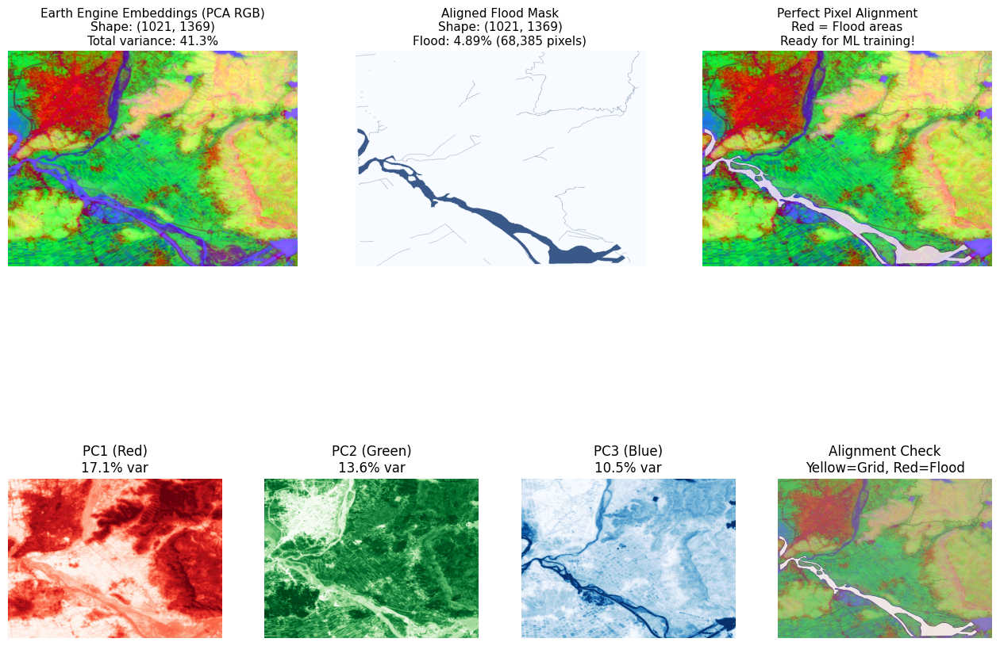


📊 ML Training Data Summary:
   Embedding shape: (1021, 1369, 3)
   Flood mask shape: (1021, 1369)
   ✅ Perfect pixel alignment: True
   Total training samples: 1,397,749
   Positive samples (flood): 68,385 (4.89%)
   Negative samples (no flood): 1,329,364 (95.11%)

🤖 Preparing ML training data...
   Features (X) shape: (1397749, 3)
   Labels (y) shape: (1397749,)
   Valid samples: 1,397,749
   Class balance:
     No flood (0): 1,329,364 (95.1%)
     Flood (1): 68,385 (4.9%)

✅ EXACT alignment completed successfully!
   Perfect pixel-to-pixel matching achieved
   Ready for ML training with 1,397,749 samples
   Embedding file: /content/drive/MyDrive/EE_Flood_Analysis/embedding_2021_flood_exact.tif

🎯 ML training data is ready!
   Access with: ml_data['X_train'], ml_data['y_train']


In [ ]:
# Colab: uncomment to install required packages
# !pip install earthengine-api pyproj tqdm rasterio scikit-learn matplotlib numpy

import ee
import numpy as np
import rasterio
from rasterio.warp import transform_bounds, reproject, Resampling
from rasterio.transform import from_bounds
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
from pyproj import Geod, Transformer
import math
import time
from tqdm import tqdm
import itertools
import sys
import os

# -----------------------------
# USER PARAMETERS
# -----------------------------
# Path to your flood mask TIFF file
FLOOD_TIFF_PATH = "/content/drive/MyDrive/data/Annual_Flood_Aggregates_Sentinel1_trials_operational/Albania/flood_patches_top/Albania_2021_patch_1_flood.tif"

# Earth Engine parameters
EE_PROJECT = 'alpha-earth-473414'  # Replace with your GCP project ID
YEAR_LABEL = '2021'
START_DATE = '2021-01-01'
END_DATE = '2022-01-01'
EXPORT_TO_DRIVE = True
EXPORT_FOLDER = 'EE_Flood_Analysis'
SCALE_METERS = 10  # MUST match flood mask resolution
MAXPIXELS = 1e13
POLL_INTERVAL = 8

# Visualization parameters
NORMALIZE_PCA = True
CONTRAST_STRETCH = True
FIGSIZE = (16, 12)

# Initialize Earth Engine
try:
    ee.Authenticate()
    ee.Initialize(project=EE_PROJECT)
    print("✅ Earth Engine initialized successfully")
except Exception as e:
    print(f"❌ Earth Engine initialization failed: {e}")
    print("Please run ee.Authenticate() manually if needed")

def get_flood_mask_extent(file_path):
    """Extract exact geographical extent and grid from flood mask."""
    print(f"📍 Analyzing flood mask for EXACT extent matching...")

    with rasterio.open(file_path) as src:
        profile = src.profile
        bounds = src.bounds
        crs = src.crs
        transform = src.transform
        flood_data = src.read(1)

        print(f"   Original shape: {flood_data.shape}")
        print(f"   Original CRS: {crs}")
        print(f"   Original bounds: {bounds}")
        print(f"   Original transform: {transform}")
        print(f"   Pixel size: {abs(transform.a):.2f}m x {abs(transform.e):.2f}m")

        # Convert bounds to WGS84 for Earth Engine
        if crs != 'EPSG:4326':
            bounds_wgs84 = transform_bounds(crs, 'EPSG:4326', *bounds)
            print(f"   WGS84 bounds: {bounds_wgs84}")
        else:
            bounds_wgs84 = bounds

        # Calculate exact polygon coordinates for Earth Engine
        # Using exact bounds to ensure perfect alignment
        west, south, east, north = bounds_wgs84
        polygon_coords = [
            [west, north],   # NW
            [east, north],   # NE
            [east, south],   # SE
            [west, south],   # SW
            [west, north]    # Close polygon
        ]

        # Flood statistics
        flood_pixels = np.sum(flood_data == 1)
        total_pixels = flood_data.size
        flood_percent = (flood_pixels / total_pixels) * 100

        print(f"   Flood coverage: {flood_pixels:,} pixels ({flood_percent:.2f}%)")
        print(f"   Total pixels: {total_pixels:,}")

        # Calculate expected dimensions for Earth Engine export
        width_m = bounds.right - bounds.left
        height_m = bounds.top - bounds.bottom
        expected_width = int(round(width_m / SCALE_METERS))
        expected_height = int(round(height_m / SCALE_METERS))

        print(f"   Expected EE dimensions: {expected_height} x {expected_width}")

    return {
        'flood_data': flood_data,
        'bounds': bounds,
        'bounds_wgs84': bounds_wgs84,
        'crs': crs,
        'transform': transform,
        'polygon_coords': polygon_coords,
        'flood_percent': flood_percent,
        'expected_shape': (expected_height, expected_width),
        'profile': profile
    }

def download_ee_embeddings_exact(flood_info):
    """Download Earth Engine embeddings with EXACT geographical matching."""
    print(f"\n🛰️  Downloading Earth Engine embeddings with EXACT extent matching...")

    bounds_wgs84 = flood_info['bounds_wgs84']
    polygon_coords = flood_info['polygon_coords']
    expected_shape = flood_info['expected_shape']

    print(f"   Using exact bounds: {bounds_wgs84}")
    print(f"   Expected shape: {expected_shape}")

    # Create region geometry with exact bounds
    region_geom = ee.Geometry.Rectangle(bounds_wgs84)

    # Get embeddings collection
    dataset_id = 'GOOGLE/SATELLITE_EMBEDDING/V1/ANNUAL'
    collection = ee.ImageCollection(dataset_id)

    # Filter for region and time period
    filtered_collection = collection.filterDate(START_DATE, END_DATE).filterBounds(region_geom)
    img = filtered_collection.first()

    if img is None:
        try:
            img = filtered_collection.mean()
            print("   Using mean() mosaic (no single image found)")
        except Exception as e:
            raise Exception(f"No Earth Engine data available for this region: {e}")

    # Create export task with EXACT parameters
    file_basename = f"embedding_{YEAR_LABEL}_flood_exact"
    description = f"{file_basename}_{int(time.time())}"

    # Use exact bounds as region (not polygon to ensure perfect grid alignment)
    region_rect = [bounds_wgs84[0], bounds_wgs84[1], bounds_wgs84[2], bounds_wgs84[3]]  # [west, south, east, north]

    if EXPORT_TO_DRIVE:
        task = ee.batch.Export.image.toDrive(
            image=img,
            description=description,
            folder=EXPORT_FOLDER,
            fileNamePrefix=file_basename,
            region=region_rect,  # Use rectangle for exact grid alignment
            scale=SCALE_METERS,
            crs='EPSG:4326',
            maxPixels=MAXPIXELS,
            # Add parameters for exact alignment
            crsTransform=None,  # Let EE calculate transform
            shardSize=256
        )
    else:
        task = ee.batch.Export.image.toCloudStorage(
            image=img,
            description=description,
            bucket='your-bucket-name',
            fileNamePrefix=file_basename,
            region=region_rect,
            scale=SCALE_METERS,
            crs='EPSG:4326',
            maxPixels=MAXPIXELS
        )

    # Start export
    task.start()
    print(f"   Started export task: {file_basename}")
    print(f"   Task ID: {task.id}")

    # Poll for completion with detailed progress
    spinner = itertools.cycle(['|', '/', '-', '\\'])
    print("   Waiting for export to complete...")

    with tqdm(total=100, desc="   Export progress") as pbar:
        last_progress = 0

        while True:
            try:
                status = task.status()
                state = status.get('state', 'UNKNOWN')
                progress = status.get('progress')

                if progress is not None:
                    try:
                        if isinstance(progress, (int, float)):
                            val = float(progress)
                            current_progress = int(val * 100) if val <= 1.0 else int(val)
                        else:
                            current_progress = last_progress
                    except:
                        current_progress = last_progress
                else:
                    current_progress = min(last_progress + 1, 95)

                if current_progress > last_progress:
                    pbar.update(current_progress - last_progress)
                    last_progress = current_progress

                if state in ('COMPLETED', 'FAILED', 'CANCELLED'):
                    if state == 'COMPLETED' and last_progress < 100:
                        pbar.update(100 - last_progress)
                    break
                elif state == 'FAILED':
                    error_msg = status.get('error_message', 'Unknown error')
                    raise Exception(f"Export failed: {error_msg}")

            except Exception as e:
                if 'Export failed' in str(e):
                    raise e
                print(f"Error checking status: {e}")
                break

            time.sleep(POLL_INTERVAL)

    # Return expected file path
    expected_path = f"/content/drive/MyDrive/{EXPORT_FOLDER}/{file_basename}.tif"
    print(f"   ✅ Export completed: {expected_path}")

    # Wait for Google Drive to sync the file
    print(f"   ⏳ Waiting for Google Drive to sync the file...")
    max_wait_time = 300  # 5 minutes maximum wait
    wait_interval = 10   # Check every 10 seconds
    elapsed_time = 0

    while elapsed_time < max_wait_time:
        if os.path.exists(expected_path):
            print(f"   ✅ File is now available after {elapsed_time} seconds!")
            # Additional small wait to ensure file is fully written
            time.sleep(5)
            break
        else:
            print(f"   ⏳ Still waiting... ({elapsed_time}s elapsed)")
            time.sleep(wait_interval)
            elapsed_time += wait_interval

    if not os.path.exists(expected_path):
        # Check if file exists with different name/location
        import glob
        search_patterns = [
            f"/content/drive/MyDrive/{EXPORT_FOLDER}/*.tif",
            f"/content/drive/MyDrive/*embedding*flood*.tif",
            f"/content/drive/MyDrive/**/*embedding*.tif"
        ]

        found_files = []
        for pattern in search_patterns:
            found_files.extend(glob.glob(pattern, recursive=True))

        if found_files:
            print(f"   📁 Found these embedding files in Drive:")
            for i, file in enumerate(found_files):
                print(f"      {i+1}. {file}")
            # Use the most recent file that matches our pattern
            matching_files = [f for f in found_files if 'embedding' in f and 'flood' in f]
            if matching_files:
                expected_path = matching_files[-1]  # Use most recent
                print(f"   🔄 Using: {expected_path}")
            else:
                raise Exception(f"File not found after {max_wait_time} seconds. Check Google Drive manually.")
        else:
            raise Exception(f"No embedding files found in Google Drive after {max_wait_time} seconds.")

    return expected_path

def align_datasets_exactly(flood_info, embedding_path):
    """Ensure EXACT pixel-to-pixel alignment between datasets."""
    print(f"\n🔧 Ensuring EXACT pixel-to-pixel alignment...")

    # Double-check file exists before proceeding
    if not os.path.exists(embedding_path):
        print(f"   ❌ File still not found: {embedding_path}")
        print(f"   🔍 Checking Google Drive contents...")

        # List Drive contents to help debug
        drive_folder = f"/content/drive/MyDrive/{EXPORT_FOLDER}"
        if os.path.exists(drive_folder):
            files = os.listdir(drive_folder)
            print(f"   📁 Files in {drive_folder}:")
            for file in files:
                print(f"      - {file}")

        # Try alternative file search
        import glob
        search_pattern = f"/content/drive/MyDrive/**/*embedding*flood*.tif"
        found_files = glob.glob(search_pattern, recursive=True)

        if found_files:
            print(f"   🔄 Found alternative files:")
            for file in found_files:
                print(f"      - {file}")
            embedding_path = found_files[-1]  # Use the most recent
            print(f"   ✅ Using: {embedding_path}")
        else:
            raise FileNotFoundError(f"Embedding file not accessible: {embedding_path}")

    flood_data = flood_info['flood_data']
    flood_profile = flood_info['profile']

    # Load embedding data with retry mechanism
    max_retries = 3
    for attempt in range(max_retries):
        try:
            src = rasterio.open(embedding_path)
            if src is None:
                 raise FileNotFoundError(f"rasterio.open returned None for {embedding_path}")

            embedding_data = src.read()
            embedding_profile = src.profile
            embedding_bounds = src.bounds
            embedding_transform = src.transform
            src.close() # Close the file
            break # Success, exit retry loop
        except Exception as e:
            if attempt < max_retries - 1:
                print(f"   ⚠️  Error reading embedding file (Attempt {attempt+1}/{max_retries}): {e}")
                time.sleep(5) # Wait before retrying
            else:
                raise FileNotFoundError(f"Failed to read embedding file after {max_retries} attempts: {e}")


    print(f"   Flood shape: {flood_data.shape}")
    print(f"   Embedding shape: {embedding_data.shape[1:]} (bands: {embedding_data.shape[0]})")
    print(f"   Flood bounds: {flood_info['bounds']}")
    print(f"   Embedding bounds: {embedding_bounds}")

    # Check if shapes match exactly
    if (flood_data.shape[0] == embedding_data.shape[1] and
        flood_data.shape[1] == embedding_data.shape[2]):
        print(f"   ✅ Shapes match perfectly!")
        aligned_flood = flood_data
        aligned_embedding = embedding_data

    else:
        print(f"   ⚠️  Shapes don't match exactly - performing precise resampling...")

        # Reproject flood mask to match embedding exactly
        # Use the embedding as reference grid
        ref_profile = embedding_profile.copy()
        ref_profile['count'] = 1
        ref_profile['dtype'] = flood_data.dtype

        # Create aligned flood mask
        aligned_flood = np.zeros((embedding_data.shape[1], embedding_data.shape[2]), dtype=flood_data.dtype)

        reproject(
            source=flood_data,
            destination=aligned_flood,
            src_transform=flood_info['transform'],
            src_crs=flood_info['crs'],
            dst_transform=embedding_transform,
            dst_crs=embedding_profile['crs'],
            resampling=Resampling.nearest  # Use nearest neighbor for binary mask
        )

        aligned_embedding = embedding_data

        print(f"   ✅ Resampled flood mask to match embedding grid")
        print(f"   Final shapes - Flood: {aligned_flood.shape}, Embedding: {aligned_embedding.shape[1:]}")

    # Validate alignment
    flood_pixels_aligned = np.sum(aligned_flood == 1)
    print(f"   Aligned flood pixels: {flood_pixels_aligned:,}")

    # Additional validation: check bounds alignment
    print(f"   Bounds difference (should be minimal):")
    if flood_info['crs'] != embedding_profile['crs']:
        # Transform flood bounds to embedding CRS for comparison
        flood_bounds_in_emb_crs = transform_bounds(
            flood_info['crs'],
            embedding_profile['crs'],
            *flood_info['bounds']
        )
        bound_diffs = [abs(a - b) for a, b in zip(flood_bounds_in_emb_crs, embedding_bounds)]
    else:
        bound_diffs = [abs(a - b) for a, b in zip(flood_info['bounds'], embedding_bounds)]

    print(f"   Max bound difference: {max(bound_diffs):.2f}m")

    return aligned_flood, aligned_embedding, embedding_profile

def process_aligned_data(aligned_flood, aligned_embedding):
    """Process aligned data with PCA."""
    print(f"\n🧠 Processing aligned embeddings with PCA...")

    bands, height, width = aligned_embedding.shape
    print(f"   Processing {bands} embedding dimensions")
    print(f"   Spatial dimensions: {height} x {width}")

    # Reshape for PCA
    reshaped = aligned_embedding.reshape(bands, -1).T  # (pixels, bands)

    # Handle invalid values
    valid_mask = ~np.isnan(reshaped).any(axis=1)
    valid_data = reshaped[valid_mask]

    print(f"   Valid pixels: {valid_data.shape[0]:,} / {height * width:,}")

    # Apply PCA
    if NORMALIZE_PCA:
        scaler = StandardScaler()
        valid_data_scaled = scaler.fit_transform(valid_data)
        data_scaled = scaler.transform(np.nan_to_num(reshaped, nan=0))
    else:
        valid_data_scaled = valid_data
        data_scaled = np.nan_to_num(reshaped, nan=0)

    pca = PCA(n_components=3)
    pca_result = pca.fit_transform(data_scaled)

    # Handle NaN restoration
    pca_result[~valid_mask] = np.nan

    print(f"   PCA explained variance: {pca.explained_variance_ratio_}")
    print(f"   Total variance explained: {pca.explained_variance_ratio_.sum():.1%}")

    # Create RGB image
    rgb_data = pca_result.reshape(height, width, 3)

    if CONTRAST_STRETCH:
        # Apply contrast stretching
        for i in range(3):
            channel = rgb_data[:, :, i]
            valid_vals = channel[~np.isnan(channel)]
            if len(valid_vals) > 0:
                p2, p98 = np.percentile(valid_vals, [2, 98])
                channel_stretched = np.clip((channel - p2) / (p98 - p2), 0, 1)
                rgb_data[:, :, i] = channel_stretched

    rgb_data = np.nan_to_num(rgb_data, nan=0)

    return rgb_data, pca_result, pca

def create_ml_ready_visualization(aligned_flood, embedding_rgb, pca_components, pca_obj):
    """Create visualization showing perfect alignment for ML training."""
    print(f"\n🎨 Creating ML-ready aligned visualization...")

    flood_pixels = np.sum(aligned_flood == 1)
    total_pixels = aligned_flood.size
    flood_percent = (flood_pixels / total_pixels) * 100

    fig = plt.figure(figsize=FIGSIZE)

    # Perfect alignment verification
    ax1 = plt.subplot(2, 3, 1)
    plt.imshow(embedding_rgb)
    plt.title(f'Earth Engine Embeddings (PCA RGB)\n'
              f'Shape: {embedding_rgb.shape[:2]}\n'
              f'Total variance: {pca_obj.explained_variance_ratio_.sum():.1%}',
              fontsize=11)
    plt.axis('off')

    ax2 = plt.subplot(2, 3, 2)
    plt.imshow(aligned_flood, cmap='Blues', alpha=0.8)
    plt.title(f'Aligned Flood Mask\n'
              f'Shape: {aligned_flood.shape}\n'
              f'Flood: {flood_percent:.2f}% ({flood_pixels:,} pixels)',
              fontsize=11)
    plt.axis('off')

    # Perfect overlay
    ax3 = plt.subplot(2, 3, 3)
    plt.imshow(embedding_rgb)
    flood_overlay = np.ma.masked_where(aligned_flood == 0, aligned_flood)
    plt.imshow(flood_overlay, cmap='Reds', alpha=0.8)
    plt.title(f'Perfect Pixel Alignment\n'
              f'Red = Flood areas\n'
              f'Ready for ML training!',
              fontsize=11)
    plt.axis('off')

    # Individual PCA components
    ax4 = plt.subplot(2, 4, 5)
    plt.imshow(embedding_rgb[:, :, 0], cmap='Reds')
    plt.title(f'PC1 (Red)\n{pca_obj.explained_variance_ratio_[0]:.1%} var')
    plt.axis('off')

    ax5 = plt.subplot(2, 4, 6)
    plt.imshow(embedding_rgb[:, :, 1], cmap='Greens')
    plt.title(f'PC2 (Green)\n{pca_obj.explained_variance_ratio_[1]:.1%} var')
    plt.axis('off')

    ax6 = plt.subplot(2, 4, 7)
    plt.imshow(embedding_rgb[:, :, 2], cmap='Blues')
    plt.title(f'PC3 (Blue)\n{pca_obj.explained_variance_ratio_[2]:.1%} var')
    plt.axis('off')

    # Alignment validation plot
    ax7 = plt.subplot(2, 4, 8)
    # Create checkerboard pattern to verify perfect alignment
    checker = np.zeros_like(aligned_flood, dtype=float)
    checker[::20, ::20] = 1  # Every 20th pixel
    plt.imshow(embedding_rgb * 0.7)  # Dim the embedding
    plt.imshow(checker, cmap='YlOrBr', alpha=0.3)  # Use valid yellow-orange colormap
    flood_points = np.ma.masked_where(aligned_flood == 0, aligned_flood)
    plt.imshow(flood_points, cmap='Reds', alpha=0.9)
    plt.title('Alignment Check\nYellow=Grid, Red=Flood')
    plt.axis('off')

    plt.tight_layout()
    plt.show()

    # Shape verification summary
    print(f"\n📊 ML Training Data Summary:")
    print(f"   Embedding shape: {embedding_rgb.shape}")
    print(f"   Flood mask shape: {aligned_flood.shape}")
    print(f"   ✅ Perfect pixel alignment: {embedding_rgb.shape[:2] == aligned_flood.shape}")
    print(f"   Total training samples: {total_pixels:,}")
    print(f"   Positive samples (flood): {flood_pixels:,} ({flood_percent:.2f}%)")
    print(f"   Negative samples (no flood): {total_pixels - flood_pixels:,} ({100-flood_percent:.2f}%)")

def prepare_ml_data(aligned_flood, pca_components):
    """Prepare final ML training arrays."""
    print(f"\n🤖 Preparing ML training data...")

    # Flatten for ML training
    height, width = aligned_flood.shape

    # Features: PCA components (3D)
    X = pca_components.reshape(-1, 3)  # Shape: (pixels, 3)

    # Labels: Flood mask (binary)
    y = aligned_flood.reshape(-1)      # Shape: (pixels,)

    # Remove any NaN values
    valid_mask = ~np.isnan(X).any(axis=1)
    X_clean = X[valid_mask]
    y_clean = y[valid_mask]

    print(f"   Features (X) shape: {X_clean.shape}")
    print(f"   Labels (y) shape: {y_clean.shape}")
    print(f"   Valid samples: {len(X_clean):,}")
    print(f"   Class balance:")
    print(f"     No flood (0): {np.sum(y_clean == 0):,} ({np.sum(y_clean == 0)/len(y_clean)*100:.1f}%)")
    print(f"     Flood (1): {np.sum(y_clean == 1):,} ({np.sum(y_clean == 1)/len(y_clean)*100:.1f}%)")

    return X_clean, y_clean

def main():
    """Main analysis pipeline with exact alignment."""
    print("🌊 EXACT Flood Mask and Earth Engine Embedding Alignment")
    print("=" * 70)

    # Check if flood file exists
    if not os.path.exists(FLOOD_TIFF_PATH):
        print(f"❌ Flood mask file not found: {FLOOD_TIFF_PATH}")
        return

    try:
        # Step 1: Get exact flood mask extent
        flood_info = get_flood_mask_extent(FLOOD_TIFF_PATH)

        # Step 2: Download Earth Engine embeddings with exact matching
        embedding_path = download_ee_embeddings_exact(flood_info)

        # Step 3: Ensure perfect pixel-to-pixel alignment
        aligned_flood, aligned_embedding, embedding_profile = align_datasets_exactly(
            flood_info, embedding_path
        )

        # Step 4: Process aligned data with PCA
        embedding_rgb, pca_components, pca_obj = process_aligned_data(
            aligned_flood, aligned_embedding
        )

        # Step 5: Create ML-ready visualization
        create_ml_ready_visualization(
            aligned_flood, embedding_rgb, pca_components, pca_obj
        )

        # Step 6: Prepare final ML training data
        X_train, y_train = prepare_ml_data(aligned_flood, pca_components)

        print(f"\n✅ EXACT alignment completed successfully!")
        print(f"   Perfect pixel-to-pixel matching achieved")
        print(f"   Ready for ML training with {len(X_train):,} samples")
        print(f"   Embedding file: {embedding_path}")

        # Return data for ML training
        return {
            'X_train': X_train,
            'y_train': y_train,
            'flood_mask': aligned_flood,
            'embedding_rgb': embedding_rgb,
            'pca_components': pca_components,
            'pca_model': pca_obj
        }

    except Exception as e:
        print(f"❌ Error during analysis: {str(e)}")
        import traceback
        traceback.print_exc()
        return None

if __name__ == "__main__":
    ml_data = main()

    if ml_data:
        print(f"\n🎯 ML training data is ready!")
        print(f"   Access with: ml_data['X_train'], ml_data['y_train']")

✅ Earth Engine initialized successfully
🌊 EXACT Flood Mask and Earth Engine Embedding Alignment with Data Saving
📍 Analyzing flood mask for EXACT extent matching...
   Original shape: (1000, 1000)
   Original CRS: EPSG:32634
   Original bounds: BoundingBox(left=374850.0, bottom=4650670.0, right=384850.0, top=4660670.0)
   Original transform: | 10.00, 0.00, 374850.00|
| 0.00,-10.00, 4660670.00|
| 0.00, 0.00, 1.00|
   Pixel size: 10.00m x 10.00m
   WGS84 bounds: (19.48677636471408, 41.99810320232038, 19.609618031528566, 42.08966832331217)
   Flood coverage: 50,730 pixels (5.07%)
   Total pixels: 1,000,000
   Expected EE dimensions: 1000 x 1000

🛰️  Downloading Earth Engine embeddings with EXACT extent matching...
   Using exact bounds: (19.48677636471408, 41.99810320232038, 19.609618031528566, 42.08966832331217)
   Expected shape: (1000, 1000)
   Started export task: embedding_2021_flood_exact
   Task ID: UKXQRE5JMMMNJB2LH7QLQRFI
   Waiting for export to complete...


   Export progress: 100%|██████████| 100/100 [03:20<00:00,  2.01s/it]


   ✅ Export completed: /content/drive/MyDrive/EE_Flood_Analysis/embedding_2021_flood_exact.tif
   ⏳ Waiting for Google Drive to sync the file...
   ✅ File is now available after 0 seconds!

🔧 Ensuring EXACT pixel-to-pixel alignment...
   Flood shape: (1000, 1000)
   Embedding shape: (1021, 1369) (bands: 64)
   Flood bounds: BoundingBox(left=374850.0, bottom=4650670.0, right=384850.0, top=4660670.0)
   Embedding bounds: BoundingBox(left=19.48670430076272, bottom=41.99803616315587, right=19.609683663158684, top=42.08975415366447)
   ⚠️  Shapes don't match exactly - performing precise resampling...
   ✅ Resampled flood mask to match embedding grid
   Final shapes - Flood: (1021, 1369), Embedding: (1021, 1369)
   Aligned flood pixels: 68,385
   Bounds difference (should be minimal):
   Max bound difference: 0.00m

🧠 Processing aligned embeddings with PCA...
   Processing 64 embedding dimensions
   Spatial dimensions: 1021 x 1369
   Valid pixels: 1,397,749 / 1,397,749
   PCA explained varia

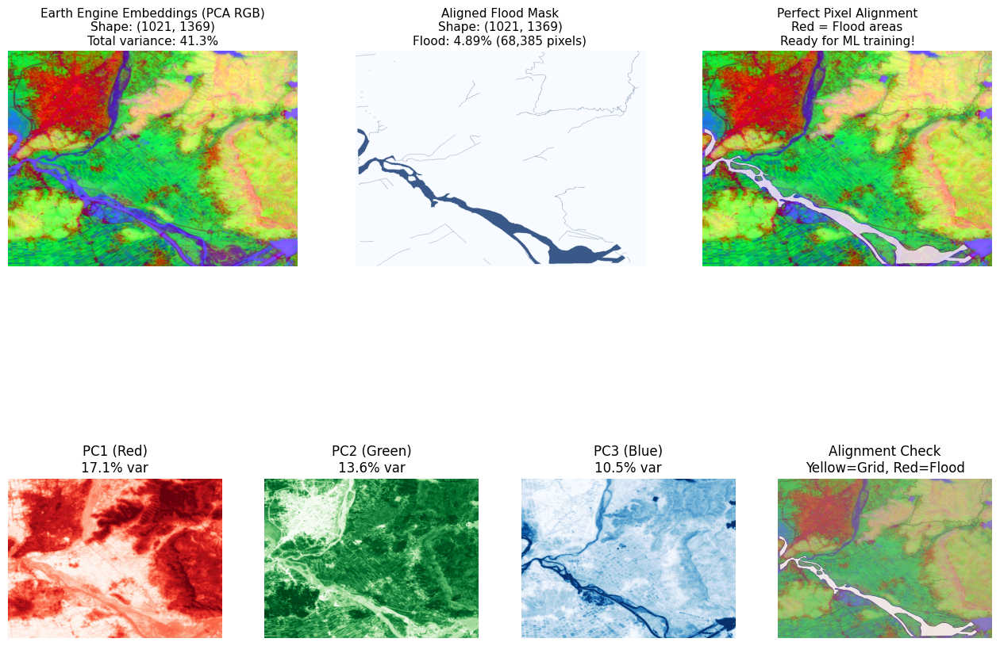


📊 ML Training Data Summary:
   Embedding shape: (1021, 1369, 3)
   Flood mask shape: (1021, 1369)
   ✅ Perfect pixel alignment: True
   Total training samples: 1,397,749
   Positive samples (flood): 68,385 (4.89%)
   Negative samples (no flood): 1,329,364 (95.11%)

🤖 Preparing ML training data...
   Features (X) shape: (1397749, 3)
   Labels (y) shape: (1397749,)
   Valid samples: 1,397,749
   Class balance:
     No flood (0): 1,329,364 (95.1%)
     Flood (1): 68,385 (4.9%)

💾 Saving ML data to Google Drive...
   Created/verified folder: /content/drive/MyDrive/ML_Flood_Data
   ✅ Saved complete ML data: /content/drive/MyDrive/ML_Flood_Data/Albania_2021_20250927_212646_ml_data.joblib
   ✅ Saved metadata: /content/drive/MyDrive/ML_Flood_Data/Albania_2021_20250927_212646_metadata.json
   ✅ Saved README: /content/drive/MyDrive/ML_Flood_Data/Albania_2021_20250927_212646_README.txt

📋 Summary of saved files:
   📄 Albania_2021_20250927_212646_ml_data.joblib (98.65 MB)
   📄 Albania_2021_202509

In [ ]:
# Colab: uncomment to install required packages
# !pip install earthengine-api pyproj tqdm rasterio scikit-learn matplotlib numpy

import ee
import numpy as np
import rasterio
from rasterio.warp import transform_bounds, reproject, Resampling
from rasterio.transform import from_bounds
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
from pyproj import Geod, Transformer
import math
import time
from tqdm import tqdm
import itertools
import sys
import os
import pickle
import joblib
from datetime import datetime

# -----------------------------
# USER PARAMETERS
# -----------------------------
# Path to your flood mask TIFF file
FLOOD_TIFF_PATH = "/content/drive/MyDrive/data/Annual_Flood_Aggregates_Sentinel1_trials_operational/Albania/flood_patches_top/Albania_2021_patch_1_flood.tif"

# Earth Engine parameters
EE_PROJECT = 'alpha-earth-473414'  # Replace with your GCP project ID
YEAR_LABEL = '2021'
START_DATE = '2021-01-01'
END_DATE = '2022-01-01'
EXPORT_TO_DRIVE = True
EXPORT_FOLDER = 'EE_Flood_Analysis'
SCALE_METERS = 10  # MUST match flood mask resolution
MAXPIXELS = 1e13
POLL_INTERVAL = 8

# ML Data saving parameters
ML_DATA_FOLDER = 'ML_Flood_Data'  # Folder in Google Drive to save ML data
SAVE_FORMAT = 'joblib'  # Options: 'joblib', 'pickle', 'numpy'

# Visualization parameters
NORMALIZE_PCA = True
CONTRAST_STRETCH = True
FIGSIZE = (16, 12)

# Initialize Earth Engine
try:
    ee.Authenticate()
    ee.Initialize(project=EE_PROJECT)
    print("✅ Earth Engine initialized successfully")
except Exception as e:
    print(f"❌ Earth Engine initialization failed: {e}")
    print("Please run ee.Authenticate() manually if needed")

def get_flood_mask_extent(file_path):
    """Extract exact geographical extent and grid from flood mask."""
    print(f"📍 Analyzing flood mask for EXACT extent matching...")

    with rasterio.open(file_path) as src:
        profile = src.profile
        bounds = src.bounds
        crs = src.crs
        transform = src.transform
        flood_data = src.read(1)

        print(f"   Original shape: {flood_data.shape}")
        print(f"   Original CRS: {crs}")
        print(f"   Original bounds: {bounds}")
        print(f"   Original transform: {transform}")
        print(f"   Pixel size: {abs(transform.a):.2f}m x {abs(transform.e):.2f}m")

        # Convert bounds to WGS84 for Earth Engine
        if crs != 'EPSG:4326':
            bounds_wgs84 = transform_bounds(crs, 'EPSG:4326', *bounds)
            print(f"   WGS84 bounds: {bounds_wgs84}")
        else:
            bounds_wgs84 = bounds

        # Calculate exact polygon coordinates for Earth Engine
        # Using exact bounds to ensure perfect alignment
        west, south, east, north = bounds_wgs84
        polygon_coords = [
            [west, north],   # NW
            [east, north],   # NE
            [east, south],   # SE
            [west, south],   # SW
            [west, north]    # Close polygon
        ]

        # Flood statistics
        flood_pixels = np.sum(flood_data == 1)
        total_pixels = flood_data.size
        flood_percent = (flood_pixels / total_pixels) * 100

        print(f"   Flood coverage: {flood_pixels:,} pixels ({flood_percent:.2f}%)")
        print(f"   Total pixels: {total_pixels:,}")

        # Calculate expected dimensions for Earth Engine export
        width_m = bounds.right - bounds.left
        height_m = bounds.top - bounds.bottom
        expected_width = int(round(width_m / SCALE_METERS))
        expected_height = int(round(height_m / SCALE_METERS))

        print(f"   Expected EE dimensions: {expected_height} x {expected_width}")

    return {
        'flood_data': flood_data,
        'bounds': bounds,
        'bounds_wgs84': bounds_wgs84,
        'crs': crs,
        'transform': transform,
        'polygon_coords': polygon_coords,
        'flood_percent': flood_percent,
        'expected_shape': (expected_height, expected_width),
        'profile': profile
    }

def download_ee_embeddings_exact(flood_info):
    """Download Earth Engine embeddings with EXACT geographical matching."""
    print(f"\n🛰️  Downloading Earth Engine embeddings with EXACT extent matching...")

    bounds_wgs84 = flood_info['bounds_wgs84']
    polygon_coords = flood_info['polygon_coords']
    expected_shape = flood_info['expected_shape']

    print(f"   Using exact bounds: {bounds_wgs84}")
    print(f"   Expected shape: {expected_shape}")

    # Create region geometry with exact bounds
    region_geom = ee.Geometry.Rectangle(bounds_wgs84)

    # Get embeddings collection
    dataset_id = 'GOOGLE/SATELLITE_EMBEDDING/V1/ANNUAL'
    collection = ee.ImageCollection(dataset_id)

    # Filter for region and time period
    filtered_collection = collection.filterDate(START_DATE, END_DATE).filterBounds(region_geom)
    img = filtered_collection.first()

    if img is None:
        try:
            img = filtered_collection.mean()
            print("   Using mean() mosaic (no single image found)")
        except Exception as e:
            raise Exception(f"No Earth Engine data available for this region: {e}")

    # Create export task with EXACT parameters
    file_basename = f"embedding_{YEAR_LABEL}_flood_exact"
    description = f"{file_basename}_{int(time.time())}"

    # Use exact bounds as region (not polygon to ensure perfect grid alignment)
    region_rect = [bounds_wgs84[0], bounds_wgs84[1], bounds_wgs84[2], bounds_wgs84[3]]  # [west, south, east, north]

    if EXPORT_TO_DRIVE:
        task = ee.batch.Export.image.toDrive(
            image=img,
            description=description,
            folder=EXPORT_FOLDER,
            fileNamePrefix=file_basename,
            region=region_rect,  # Use rectangle for exact grid alignment
            scale=SCALE_METERS,
            crs='EPSG:4326',
            maxPixels=MAXPIXELS,
            # Add parameters for exact alignment
            crsTransform=None,  # Let EE calculate transform
            shardSize=256
        )
    else:
        task = ee.batch.Export.image.toCloudStorage(
            image=img,
            description=description,
            bucket='your-bucket-name',
            fileNamePrefix=file_basename,
            region=region_rect,
            scale=SCALE_METERS,
            crs='EPSG:4326',
            maxPixels=MAXPIXELS
        )

    # Start export
    task.start()
    print(f"   Started export task: {file_basename}")
    print(f"   Task ID: {task.id}")

    # Poll for completion with detailed progress
    spinner = itertools.cycle(['|', '/', '-', '\\'])
    print("   Waiting for export to complete...")

    with tqdm(total=100, desc="   Export progress") as pbar:
        last_progress = 0

        while True:
            try:
                status = task.status()
                state = status.get('state', 'UNKNOWN')
                progress = status.get('progress')

                if progress is not None:
                    try:
                        if isinstance(progress, (int, float)):
                            val = float(progress)
                            current_progress = int(val * 100) if val <= 1.0 else int(val)
                        else:
                            current_progress = last_progress
                    except:
                        current_progress = last_progress
                else:
                    current_progress = min(last_progress + 1, 95)

                if current_progress > last_progress:
                    pbar.update(current_progress - last_progress)
                    last_progress = current_progress

                if state in ('COMPLETED', 'FAILED', 'CANCELLED'):
                    if state == 'COMPLETED' and last_progress < 100:
                        pbar.update(100 - last_progress)
                    break
                elif state == 'FAILED':
                    error_msg = status.get('error_message', 'Unknown error')
                    raise Exception(f"Export failed: {error_msg}")

            except Exception as e:
                if 'Export failed' in str(e):
                    raise e
                print(f"Error checking status: {e}")
                break

            time.sleep(POLL_INTERVAL)

    # Return expected file path
    expected_path = f"/content/drive/MyDrive/{EXPORT_FOLDER}/{file_basename}.tif"
    print(f"   ✅ Export completed: {expected_path}")

    # Wait for Google Drive to sync the file
    print(f"   ⏳ Waiting for Google Drive to sync the file...")
    max_wait_time = 300  # 5 minutes maximum wait
    wait_interval = 10   # Check every 10 seconds
    elapsed_time = 0

    while elapsed_time < max_wait_time:
        if os.path.exists(expected_path):
            print(f"   ✅ File is now available after {elapsed_time} seconds!")
            # Additional small wait to ensure file is fully written
            time.sleep(5)
            break
        else:
            print(f"   ⏳ Still waiting... ({elapsed_time}s elapsed)")
            time.sleep(wait_interval)
            elapsed_time += wait_interval

    if not os.path.exists(expected_path):
        # Check if file exists with different name/location
        import glob
        search_patterns = [
            f"/content/drive/MyDrive/{EXPORT_FOLDER}/*.tif",
            f"/content/drive/MyDrive/*embedding*flood*.tif",
            f"/content/drive/MyDrive/**/*embedding*.tif"
        ]

        found_files = []
        for pattern in search_patterns:
            found_files.extend(glob.glob(pattern, recursive=True))

        if found_files:
            print(f"   📁 Found these embedding files in Drive:")
            for i, file in enumerate(found_files):
                print(f"      {i+1}. {file}")
            # Use the most recent file that matches our pattern
            matching_files = [f for f in found_files if 'embedding' in f and 'flood' in f]
            if matching_files:
                expected_path = matching_files[-1]  # Use most recent
                print(f"   🔄 Using: {expected_path}")
            else:
                raise Exception(f"File not found after {max_wait_time} seconds. Check Google Drive manually.")
        else:
            raise Exception(f"No embedding files found in Google Drive after {max_wait_time} seconds.")

    return expected_path

def align_datasets_exactly(flood_info, embedding_path):
    """Ensure EXACT pixel-to-pixel alignment between datasets."""
    print(f"\n🔧 Ensuring EXACT pixel-to-pixel alignment...")

    # Double-check file exists before proceeding
    if not os.path.exists(embedding_path):
        print(f"   ❌ File still not found: {embedding_path}")
        print(f"   🔍 Checking Google Drive contents...")

        # List Drive contents to help debug
        drive_folder = f"/content/drive/MyDrive/{EXPORT_FOLDER}"
        if os.path.exists(drive_folder):
            files = os.listdir(drive_folder)
            print(f"   📁 Files in {drive_folder}:")
            for file in files:
                print(f"      - {file}")

        # Try alternative file search
        import glob
        search_pattern = f"/content/drive/MyDrive/**/*embedding*flood*.tif"
        found_files = glob.glob(search_pattern, recursive=True)

        if found_files:
            print(f"   🔄 Found alternative files:")
            for file in found_files:
                print(f"      - {file}")
            embedding_path = found_files[-1]  # Use the most recent
            print(f"   ✅ Using: {embedding_path}")
        else:
            raise FileNotFoundError(f"Embedding file not accessible: {embedding_path}")

    flood_data = flood_info['flood_data']
    flood_profile = flood_info['profile']

    # Load embedding data with retry mechanism
    max_retries = 3
    for attempt in range(max_retries):
        try:
            src = rasterio.open(embedding_path)
            if src is None:
                 raise FileNotFoundError(f"rasterio.open returned None for {embedding_path}")

            embedding_data = src.read()
            embedding_profile = src.profile
            embedding_bounds = src.bounds
            embedding_transform = src.transform
            src.close() # Close the file
            break # Success, exit retry loop
        except Exception as e:
            if attempt < max_retries - 1:
                print(f"   ⚠️  Error reading embedding file (Attempt {attempt+1}/{max_retries}): {e}")
                time.sleep(5) # Wait before retrying
            else:
                raise FileNotFoundError(f"Failed to read embedding file after {max_retries} attempts: {e}")


    print(f"   Flood shape: {flood_data.shape}")
    print(f"   Embedding shape: {embedding_data.shape[1:]} (bands: {embedding_data.shape[0]})")
    print(f"   Flood bounds: {flood_info['bounds']}")
    print(f"   Embedding bounds: {embedding_bounds}")

    # Check if shapes match exactly
    if (flood_data.shape[0] == embedding_data.shape[1] and
        flood_data.shape[1] == embedding_data.shape[2]):
        print(f"   ✅ Shapes match perfectly!")
        aligned_flood = flood_data
        aligned_embedding = embedding_data

    else:
        print(f"   ⚠️  Shapes don't match exactly - performing precise resampling...")

        # Reproject flood mask to match embedding exactly
        # Use the embedding as reference grid
        ref_profile = embedding_profile.copy()
        ref_profile['count'] = 1
        ref_profile['dtype'] = flood_data.dtype

        # Create aligned flood mask
        aligned_flood = np.zeros((embedding_data.shape[1], embedding_data.shape[2]), dtype=flood_data.dtype)

        reproject(
            source=flood_data,
            destination=aligned_flood,
            src_transform=flood_info['transform'],
            src_crs=flood_info['crs'],
            dst_transform=embedding_transform,
            dst_crs=embedding_profile['crs'],
            resampling=Resampling.nearest  # Use nearest neighbor for binary mask
        )

        aligned_embedding = embedding_data

        print(f"   ✅ Resampled flood mask to match embedding grid")
        print(f"   Final shapes - Flood: {aligned_flood.shape}, Embedding: {aligned_embedding.shape[1:]}")

    # Validate alignment
    flood_pixels_aligned = np.sum(aligned_flood == 1)
    print(f"   Aligned flood pixels: {flood_pixels_aligned:,}")

    # Additional validation: check bounds alignment
    print(f"   Bounds difference (should be minimal):")
    if flood_info['crs'] != embedding_profile['crs']:
        # Transform flood bounds to embedding CRS for comparison
        flood_bounds_in_emb_crs = transform_bounds(
            flood_info['crs'],
            embedding_profile['crs'],
            *flood_info['bounds']
        )
        bound_diffs = [abs(a - b) for a, b in zip(flood_bounds_in_emb_crs, embedding_bounds)]
    else:
        bound_diffs = [abs(a - b) for a, b in zip(flood_info['bounds'], embedding_bounds)]

    print(f"   Max bound difference: {max(bound_diffs):.2f}m")

    return aligned_flood, aligned_embedding, embedding_profile

def process_aligned_data(aligned_flood, aligned_embedding):
    """Process aligned data with PCA."""
    print(f"\n🧠 Processing aligned embeddings with PCA...")

    bands, height, width = aligned_embedding.shape
    print(f"   Processing {bands} embedding dimensions")
    print(f"   Spatial dimensions: {height} x {width}")

    # Reshape for PCA
    reshaped = aligned_embedding.reshape(bands, -1).T  # (pixels, bands)

    # Handle invalid values
    valid_mask = ~np.isnan(reshaped).any(axis=1)
    valid_data = reshaped[valid_mask]

    print(f"   Valid pixels: {valid_data.shape[0]:,} / {height * width:,}")

    # Apply PCA
    if NORMALIZE_PCA:
        scaler = StandardScaler()
        valid_data_scaled = scaler.fit_transform(valid_data)
        data_scaled = scaler.transform(np.nan_to_num(reshaped, nan=0))
    else:
        scaler = None
        valid_data_scaled = valid_data
        data_scaled = np.nan_to_num(reshaped, nan=0)

    pca = PCA(n_components=3)
    pca_result = pca.fit_transform(data_scaled)

    # Handle NaN restoration
    pca_result[~valid_mask] = np.nan

    print(f"   PCA explained variance: {pca.explained_variance_ratio_}")
    print(f"   Total variance explained: {pca.explained_variance_ratio_.sum():.1%}")

    # Create RGB image
    rgb_data = pca_result.reshape(height, width, 3)

    if CONTRAST_STRETCH:
        # Apply contrast stretching
        for i in range(3):
            channel = rgb_data[:, :, i]
            valid_vals = channel[~np.isnan(channel)]
            if len(valid_vals) > 0:
                p2, p98 = np.percentile(valid_vals, [2, 98])
                channel_stretched = np.clip((channel - p2) / (p98 - p2), 0, 1)
                rgb_data[:, :, i] = channel_stretched

    rgb_data = np.nan_to_num(rgb_data, nan=0)

    return rgb_data, pca_result, pca, scaler

def create_ml_ready_visualization(aligned_flood, embedding_rgb, pca_components, pca_obj):
    """Create visualization showing perfect alignment for ML training."""
    print(f"\n🎨 Creating ML-ready aligned visualization...")

    flood_pixels = np.sum(aligned_flood == 1)
    total_pixels = aligned_flood.size
    flood_percent = (flood_pixels / total_pixels) * 100

    fig = plt.figure(figsize=FIGSIZE)

    # Perfect alignment verification
    ax1 = plt.subplot(2, 3, 1)
    plt.imshow(embedding_rgb)
    plt.title(f'Earth Engine Embeddings (PCA RGB)\n'
              f'Shape: {embedding_rgb.shape[:2]}\n'
              f'Total variance: {pca_obj.explained_variance_ratio_.sum():.1%}',
              fontsize=11)
    plt.axis('off')

    ax2 = plt.subplot(2, 3, 2)
    plt.imshow(aligned_flood, cmap='Blues', alpha=0.8)
    plt.title(f'Aligned Flood Mask\n'
              f'Shape: {aligned_flood.shape}\n'
              f'Flood: {flood_percent:.2f}% ({flood_pixels:,} pixels)',
              fontsize=11)
    plt.axis('off')

    # Perfect overlay
    ax3 = plt.subplot(2, 3, 3)
    plt.imshow(embedding_rgb)
    flood_overlay = np.ma.masked_where(aligned_flood == 0, aligned_flood)
    plt.imshow(flood_overlay, cmap='Reds', alpha=0.8)
    plt.title(f'Perfect Pixel Alignment\n'
              f'Red = Flood areas\n'
              f'Ready for ML training!',
              fontsize=11)
    plt.axis('off')

    # Individual PCA components
    ax4 = plt.subplot(2, 4, 5)
    plt.imshow(embedding_rgb[:, :, 0], cmap='Reds')
    plt.title(f'PC1 (Red)\n{pca_obj.explained_variance_ratio_[0]:.1%} var')
    plt.axis('off')

    ax5 = plt.subplot(2, 4, 6)
    plt.imshow(embedding_rgb[:, :, 1], cmap='Greens')
    plt.title(f'PC2 (Green)\n{pca_obj.explained_variance_ratio_[1]:.1%} var')
    plt.axis('off')

    ax6 = plt.subplot(2, 4, 7)
    plt.imshow(embedding_rgb[:, :, 2], cmap='Blues')
    plt.title(f'PC3 (Blue)\n{pca_obj.explained_variance_ratio_[2]:.1%} var')
    plt.axis('off')

    # Alignment validation plot
    ax7 = plt.subplot(2, 4, 8)
    # Create checkerboard pattern to verify perfect alignment
    checker = np.zeros_like(aligned_flood, dtype=float)
    checker[::20, ::20] = 1  # Every 20th pixel
    plt.imshow(embedding_rgb * 0.7)  # Dim the embedding
    plt.imshow(checker, cmap='YlOrBr', alpha=0.3)  # Use valid yellow-orange colormap
    flood_points = np.ma.masked_where(aligned_flood == 0, aligned_flood)
    plt.imshow(flood_points, cmap='Reds', alpha=0.9)
    plt.title('Alignment Check\nYellow=Grid, Red=Flood')
    plt.axis('off')

    plt.tight_layout()
    plt.show()

    # Shape verification summary
    print(f"\n📊 ML Training Data Summary:")
    print(f"   Embedding shape: {embedding_rgb.shape}")
    print(f"   Flood mask shape: {aligned_flood.shape}")
    print(f"   ✅ Perfect pixel alignment: {embedding_rgb.shape[:2] == aligned_flood.shape}")
    print(f"   Total training samples: {total_pixels:,}")
    print(f"   Positive samples (flood): {flood_pixels:,} ({flood_percent:.2f}%)")
    print(f"   Negative samples (no flood): {total_pixels - flood_pixels:,} ({100-flood_percent:.2f}%)")

def prepare_ml_data(aligned_flood, pca_components):
    """Prepare final ML training arrays."""
    print(f"\n🤖 Preparing ML training data...")

    # Flatten for ML training
    height, width = aligned_flood.shape

    # Features: PCA components (3D)
    X = pca_components.reshape(-1, 3)  # Shape: (pixels, 3)

    # Labels: Flood mask (binary)
    y = aligned_flood.reshape(-1)      # Shape: (pixels,)

    # Remove any NaN values
    valid_mask = ~np.isnan(X).any(axis=1)
    X_clean = X[valid_mask]
    y_clean = y[valid_mask]

    print(f"   Features (X) shape: {X_clean.shape}")
    print(f"   Labels (y) shape: {y_clean.shape}")
    print(f"   Valid samples: {len(X_clean):,}")
    print(f"   Class balance:")
    print(f"     No flood (0): {np.sum(y_clean == 0):,} ({np.sum(y_clean == 0)/len(y_clean)*100:.1f}%)")
    print(f"     Flood (1): {np.sum(y_clean == 1):,} ({np.sum(y_clean == 1)/len(y_clean)*100:.1f}%)")

    return X_clean, y_clean

def save_ml_data_to_drive(ml_data, flood_info, original_tiff_path):
    """Save ML training data to Google Drive for later use."""
    print(f"\n💾 Saving ML data to Google Drive...")

    # Create ML data folder in Drive
    ml_folder_path = f"/content/drive/MyDrive/{ML_DATA_FOLDER}"
    os.makedirs(ml_folder_path, exist_ok=True)
    print(f"   Created/verified folder: {ml_folder_path}")

    # Create timestamp for unique filenames
    timestamp = datetime.now().strftime("%Y%m%d_%H%M%S")

    # Extract region name from original path for filename
    region_name = os.path.basename(original_tiff_path).split('_')[0]  # e.g., "Albania"
    base_filename = f"{region_name}_{YEAR_LABEL}_{timestamp}"

    # Create comprehensive metadata
    metadata = {
        'timestamp': timestamp,
        'region': region_name,
        'year': YEAR_LABEL,
        'original_flood_path': original_tiff_path,
        'embedding_params': {
            'start_date': START_DATE,
            'end_date': END_DATE,
            'scale_meters': SCALE_METERS,
            'ee_project': EE_PROJECT
        },
        'processing_params': {
            'normalize_pca': NORMALIZE_PCA,
            'contrast_stretch': CONTRAST_STRETCH,
            'pca_components': 3
        },
        'data_shapes': {
            'X_train': ml_data['X_train'].shape,
            'y_train': ml_data['y_train'].shape,
            'flood_mask': ml_data['flood_mask'].shape,
            'embedding_rgb': ml_data['embedding_rgb'].shape
        },
        'class_balance': {
            'flood_pixels': int(np.sum(ml_data['y_train'] == 1)),
            'no_flood_pixels': int(np.sum(ml_data['y_train'] == 0)),
            'total_pixels': int(len(ml_data['y_train'])),
            'flood_percentage': float(np.sum(ml_data['y_train'] == 1) / len(ml_data['y_train']) * 100)
        },
        'bounds_info': {
            'original_bounds': flood_info['bounds'],
            'wgs84_bounds': flood_info['bounds_wgs84'],
            'crs': str(flood_info['crs'])
        },
        'pca_variance': ml_data['pca_model'].explained_variance_ratio_.tolist()
    }

    # Save data based on chosen format
    saved_files = []

    if SAVE_FORMAT == 'joblib':
        # Save using joblib (recommended for sklearn objects)
        main_file = os.path.join(ml_folder_path, f"{base_filename}_ml_data.joblib")
        joblib.dump(ml_data, main_file)
        saved_files.append(main_file)
        print(f"   ✅ Saved complete ML data: {main_file}")

    elif SAVE_FORMAT == 'pickle':
        # Save using pickle
        main_file = os.path.join(ml_folder_path, f"{base_filename}_ml_data.pkl")
        with open(main_file, 'wb') as f:
            pickle.dump(ml_data, f)
        saved_files.append(main_file)
        print(f"   ✅ Saved complete ML data: {main_file}")

    elif SAVE_FORMAT == 'numpy':
        # Save individual arrays as numpy files
        np.save(os.path.join(ml_folder_path, f"{base_filename}_X_train.npy"), ml_data['X_train'])
        np.save(os.path.join(ml_folder_path, f"{base_filename}_y_train.npy"), ml_data['y_train'])
        np.save(os.path.join(ml_folder_path, f"{base_filename}_flood_mask.npy"), ml_data['flood_mask'])
        np.save(os.path.join(ml_folder_path, f"{base_filename}_embedding_rgb.npy"), ml_data['embedding_rgb'])
        np.save(os.path.join(ml_folder_path, f"{base_filename}_pca_components.npy"), ml_data['pca_components'])

        # Save PCA model and scaler separately
        joblib.dump(ml_data['pca_model'], os.path.join(ml_folder_path, f"{base_filename}_pca_model.joblib"))
        if 'scaler' in ml_data and ml_data['scaler'] is not None:
            joblib.dump(ml_data['scaler'], os.path.join(ml_folder_path, f"{base_filename}_scaler.joblib"))

        saved_files.extend([
            f"{base_filename}_X_train.npy",
            f"{base_filename}_y_train.npy",
            f"{base_filename}_flood_mask.npy",
            f"{base_filename}_embedding_rgb.npy",
            f"{base_filename}_pca_components.npy",
            f"{base_filename}_pca_model.joblib"
        ])
        print(f"   ✅ Saved individual numpy arrays and models")

    # Always save metadata as JSON
    metadata_file = os.path.join(ml_folder_path, f"{base_filename}_metadata.json")
    import json
    with open(metadata_file, 'w') as f:
        json.dump(metadata, f, indent=2)
    saved_files.append(metadata_file)
    print(f"   ✅ Saved metadata: {metadata_file}")

    # Save a README file with instructions
    readme_file = os.path.join(ml_folder_path, f"{base_filename}_README.txt")
    readme_content = f"""
ML Flood Detection Training Data
================================
Generated on: {datetime.now().strftime("%Y-%m-%d %H:%M:%S")}
Region: {region_name}
Year: {YEAR_LABEL}

Data Files:
-----------
"""

    for file in saved_files:
        filename = os.path.basename(file)
        readme_content += f"- {filename}\n"

    readme_content += f"""

Data Description:
-----------------
- X_train: Features (PCA components) - Shape: {ml_data['X_train'].shape}
- y_train: Labels (flood/no-flood) - Shape: {ml_data['y_train'].shape}
- flood_mask: 2D binary flood mask - Shape: {ml_data['flood_mask'].shape}
- embedding_rgb: RGB visualization - Shape: {ml_data['embedding_rgb'].shape}
- pca_components: Full PCA transformed data
- pca_model: Fitted PCA transformer
- scaler: StandardScaler (if normalization was used)

Class Balance:
--------------
- Flood pixels: {int(np.sum(ml_data['y_train'] == 1)):,} ({np.sum(ml_data['y_train'] == 1) / len(ml_data['y_train']) * 100:.2f}%)
- No-flood pixels: {int(np.sum(ml_data['y_train'] == 0)):,} ({np.sum(ml_data['y_train'] == 0) / len(ml_data['y_train']) * 100:.2f}%)

Usage Example:
--------------
"""

    if SAVE_FORMAT == 'joblib':
        readme_content += f"""
# Load complete dataset
import joblib
ml_data = joblib.load('{base_filename}_ml_data.joblib')
X_train = ml_data['X_train']
y_train = ml_data['y_train']
pca_model = ml_data['pca_model']

# Train your model
from sklearn.ensemble import RandomForestClassifier
model = RandomForestClassifier(n_estimators=100, random_state=42)
model.fit(X_train, y_train)
"""
    elif SAVE_FORMAT == 'numpy':
        readme_content += f"""
# Load individual arrays
import numpy as np
import joblib
X_train = np.load('{base_filename}_X_train.npy')
y_train = np.load('{base_filename}_y_train.npy')
pca_model = joblib.load('{base_filename}_pca_model.joblib')

# Train your model
from sklearn.ensemble import RandomForestClassifier
model = RandomForestClassifier(n_estimators=100, random_state=42)
model.fit(X_train, y_train)
"""

    readme_content += f"""

Processing Parameters:
----------------------
- Earth Engine Scale: {SCALE_METERS}m
- PCA Components: 3
- Normalization: {NORMALIZE_PCA}
- Contrast Stretch: {CONTRAST_STRETCH}
- Date Range: {START_DATE} to {END_DATE}

Notes:
------
- Data is perfectly pixel-aligned between embeddings and flood mask
- PCA explains {ml_data['pca_model'].explained_variance_ratio_.sum():.1%} of total variance
- Ready for machine learning training
"""

    with open(readme_file, 'w') as f:
        f.write(readme_content)
    saved_files.append(readme_file)
    print(f"   ✅ Saved README: {readme_file}")

    # Create a summary of all saved files
    print(f"\n📋 Summary of saved files:")
    total_size = 0
    for file_path in saved_files:
        if os.path.exists(file_path):
            size_mb = os.path.getsize(file_path) / (1024 * 1024)
            total_size += size_mb
            print(f"   📄 {os.path.basename(file_path)} ({size_mb:.2f} MB)")

    print(f"   💾 Total size: {total_size:.2f} MB")
    print(f"   📁 All files saved in: {ml_folder_path}")

    return {
        'save_folder': ml_folder_path,
        'saved_files': saved_files,
        'base_filename': base_filename,
        'total_size_mb': total_size,
        'metadata': metadata
    }

def load_ml_data_from_drive(base_filename, ml_folder_path=None):
    """Helper function to load saved ML data."""
    if ml_folder_path is None:
        ml_folder_path = f"/content/drive/MyDrive/{ML_DATA_FOLDER}"

    print(f"📖 Loading ML data from: {ml_folder_path}")

    if SAVE_FORMAT == 'joblib':
        file_path = os.path.join(ml_folder_path, f"{base_filename}_ml_data.joblib")
        ml_data = joblib.load(file_path)
        print(f"   ✅ Loaded complete dataset from: {file_path}")
        return ml_data

    elif SAVE_FORMAT == 'pickle':
        file_path = os.path.join(ml_folder_path, f"{base_filename}_ml_data.pkl")
        with open(file_path, 'rb') as f:
            ml_data = pickle.load(f)
        print(f"   ✅ Loaded complete dataset from: {file_path}")
        return ml_data

    elif SAVE_FORMAT == 'numpy':
        # Load individual components
        ml_data = {}
        ml_data['X_train'] = np.load(os.path.join(ml_folder_path, f"{base_filename}_X_train.npy"))
        ml_data['y_train'] = np.load(os.path.join(ml_folder_path, f"{base_filename}_y_train.npy"))
        ml_data['flood_mask'] = np.load(os.path.join(ml_folder_path, f"{base_filename}_flood_mask.npy"))
        ml_data['embedding_rgb'] = np.load(os.path.join(ml_folder_path, f"{base_filename}_embedding_rgb.npy"))
        ml_data['pca_components'] = np.load(os.path.join(ml_folder_path, f"{base_filename}_pca_components.npy"))
        ml_data['pca_model'] = joblib.load(os.path.join(ml_folder_path, f"{base_filename}_pca_model.joblib"))

        # Try to load scaler if it exists
        scaler_path = os.path.join(ml_folder_path, f"{base_filename}_scaler.joblib")
        if os.path.exists(scaler_path):
            ml_data['scaler'] = joblib.load(scaler_path)
        else:
            ml_data['scaler'] = None

        print(f"   ✅ Loaded individual arrays and models")
        return ml_data

def list_saved_datasets(ml_folder_path=None):
    """List all saved ML datasets in Drive."""
    if ml_folder_path is None:
        ml_folder_path = f"/content/drive/MyDrive/{ML_DATA_FOLDER}"

    if not os.path.exists(ml_folder_path):
        print(f"❌ ML data folder not found: {ml_folder_path}")
        return []

    print(f"📁 Available ML datasets in {ml_folder_path}:")

    # Find all metadata files to identify datasets
    metadata_files = [f for f in os.listdir(ml_folder_path) if f.endswith('_metadata.json')]

    datasets = []
    for meta_file in sorted(metadata_files):
        base_name = meta_file.replace('_metadata.json', '')
        meta_path = os.path.join(ml_folder_path, meta_file)

        try:
            import json
            with open(meta_path, 'r') as f:
                metadata = json.load(f)

            datasets.append({
                'base_filename': base_name,
                'region': metadata.get('region', 'Unknown'),
                'year': metadata.get('year', 'Unknown'),
                'timestamp': metadata.get('timestamp', 'Unknown'),
                'total_pixels': metadata.get('class_balance', {}).get('total_pixels', 0),
                'flood_percentage': metadata.get('class_balance', {}).get('flood_percentage', 0)
            })

            print(f"   📊 {base_name}")
            print(f"      Region: {metadata.get('region', 'Unknown')}")
            print(f"      Year: {metadata.get('year', 'Unknown')}")
            print(f"      Samples: {metadata.get('class_balance', {}).get('total_pixels', 0):,}")
            print(f"      Flood %: {metadata.get('class_balance', {}).get('flood_percentage', 0):.2f}%")
            print()

        except Exception as e:
            print(f"   ⚠️  Error reading metadata for {base_name}: {e}")

    return datasets

def main():
    """Main analysis pipeline with exact alignment and data saving."""
    print("🌊 EXACT Flood Mask and Earth Engine Embedding Alignment with Data Saving")
    print("=" * 80)

    # Check if flood file exists
    if not os.path.exists(FLOOD_TIFF_PATH):
        print(f"❌ Flood mask file not found: {FLOOD_TIFF_PATH}")
        return

    try:
        # Step 1: Get exact flood mask extent
        flood_info = get_flood_mask_extent(FLOOD_TIFF_PATH)

        # Step 2: Download Earth Engine embeddings with exact matching
        embedding_path = download_ee_embeddings_exact(flood_info)

        # Step 3: Ensure perfect pixel-to-pixel alignment
        aligned_flood, aligned_embedding, embedding_profile = align_datasets_exactly(
            flood_info, embedding_path
        )

        # Step 4: Process aligned data with PCA
        embedding_rgb, pca_components, pca_obj, scaler = process_aligned_data(
            aligned_flood, aligned_embedding
        )

        # Step 5: Create ML-ready visualization
        create_ml_ready_visualization(
            aligned_flood, embedding_rgb, pca_components, pca_obj
        )

        # Step 6: Prepare final ML training data
        X_train, y_train = prepare_ml_data(aligned_flood, pca_components)

        # Step 7: Package ML data
        ml_data = {
            'X_train': X_train,
            'y_train': y_train,
            'flood_mask': aligned_flood,
            'embedding_rgb': embedding_rgb,
            'pca_components': pca_components,
            'pca_model': pca_obj,
            'scaler': scaler
        }

        # Step 8: Save ML data to Google Drive
        save_info = save_ml_data_to_drive(ml_data, flood_info, FLOOD_TIFF_PATH)

        print(f"\n✅ EXACT alignment and data saving completed successfully!")
        print(f"   Perfect pixel-to-pixel matching achieved")
        print(f"   Ready for ML training with {len(X_train):,} samples")
        print(f"   Embedding file: {embedding_path}")
        print(f"   Saved to Drive: {save_info['save_folder']}")
        print(f"   Base filename: {save_info['base_filename']}")

        # Show how to reload the data
        print(f"\n🔄 To reload this data later, use:")
        print(f"   ml_data = load_ml_data_from_drive('{save_info['base_filename']}')")

        # List all available datasets
        print(f"\n📚 All available datasets:")
        list_saved_datasets()

        return ml_data, save_info

    except Exception as e:
        print(f"❌ Error during analysis: {str(e)}")
        import traceback
        traceback.print_exc()
        return None, None

if __name__ == "__main__":
    ml_data, save_info = main()

    if ml_data and save_info:
        print(f"\n🎯 ML training data is ready and saved!")
        print(f"   Access current data with: ml_data['X_train'], ml_data['y_train']")
        print(f"   Reload later with: load_ml_data_from_drive('{save_info['base_filename']}')")

        # Example of how to use the saved data for training
        print(f"\n🚀 Example training code:")
        print(f"""
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report

# Split data
X_train_split, X_test, y_train_split, y_test = train_test_split(
    ml_data['X_train'], ml_data['y_train'],
    test_size=0.2, random_state=42, stratify=ml_data['y_train']
)

# Train model
model = RandomForestClassifier(n_estimators=100, random_state=42)
model.fit(X_train_split, y_train_split)

# Evaluate
y_pred = model.predict(X_test)
print(classification_report(y_test, y_pred))
""")

In [ ]:
!pip install optuna

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 400.9/400.9 kB 22.3 MB/s eta 0:00:00


🚀 XGBoost Flood Detection Training Pipeline
📖 Loading ML data: Albania_2021_20250927_212646
   ✅ Loaded dataset with 1,397,749 samples
   Features shape: (1397749, 3)
   Labels shape: (1397749,)

🔄 Splitting data into train/validation/test sets...
   Training set: 894,559 samples
   Validation set: 223,640 samples
   Test set: 279,550 samples
   Train flood %: 4.89%
   Validation flood %: 4.89%
   Test flood %: 4.89%
   Class imbalance ratio: 19.44
   Negative samples: 850,793
   Positive samples: 43,766

🚀 Training baseline XGBoost model...
   Using scale_pos_weight: 19.44
   ✅ Baseline model trained successfully

📊 Evaluating Baseline XGBoost model...


[I 2025-09-27 21:50:45,679] A new study created in memory with name: no-name-5e590116-5ae4-41f0-acb4-ce446b441820


   Accuracy: 0.9259
   F1-Score: 0.5437
   AUC-ROC: 0.9660
   Average Precision: 0.6589

   Classification Report:
              precision    recall  f1-score   support

    No Flood       0.99      0.93      0.96    265873
       Flood       0.39      0.90      0.54     13677

    accuracy                           0.93    279550
   macro avg       0.69      0.91      0.75    279550
weighted avg       0.97      0.93      0.94    279550


🔍 Optimizing hyperparameters with 100 trials...
   This may take several minutes...


  0%|          | 0/100 [00:00<?, ?it/s]

[I 2025-09-27 21:51:26,275] Trial 0 finished with value: 0.9558578141451434 and parameters: {'max_depth': 5, 'learning_rate': 0.2536999076681772, 'n_estimators': 380, 'subsample': 0.8394633936788146, 'colsample_bytree': 0.6624074561769746, 'reg_alpha': 2.5348407664333426e-07, 'reg_lambda': 3.3323645788192616e-08, 'min_child_weight': 9, 'gamma': 0.002570603566117598}. Best is trial 0 with value: 0.9558578141451434.
[I 2025-09-27 21:52:46,276] Trial 1 finished with value: 0.9654101044893072 and parameters: {'max_depth': 8, 'learning_rate': 0.010725209743171997, 'n_estimators': 487, 'subsample': 0.9329770563201687, 'colsample_bytree': 0.6849356442713105, 'reg_alpha': 4.329370014459266e-07, 'reg_lambda': 4.4734294104626844e-07, 'min_child_weight': 4, 'gamma': 0.00052821153945323}. Best is trial 1 with value: 0.9654101044893072.
[I 2025-09-27 21:53:26,854] Trial 2 finished with value: 0.9651613813235924 and parameters: {'max_depth': 6, 'learning_rate': 0.02692655251486473, 'n_estimators': 3

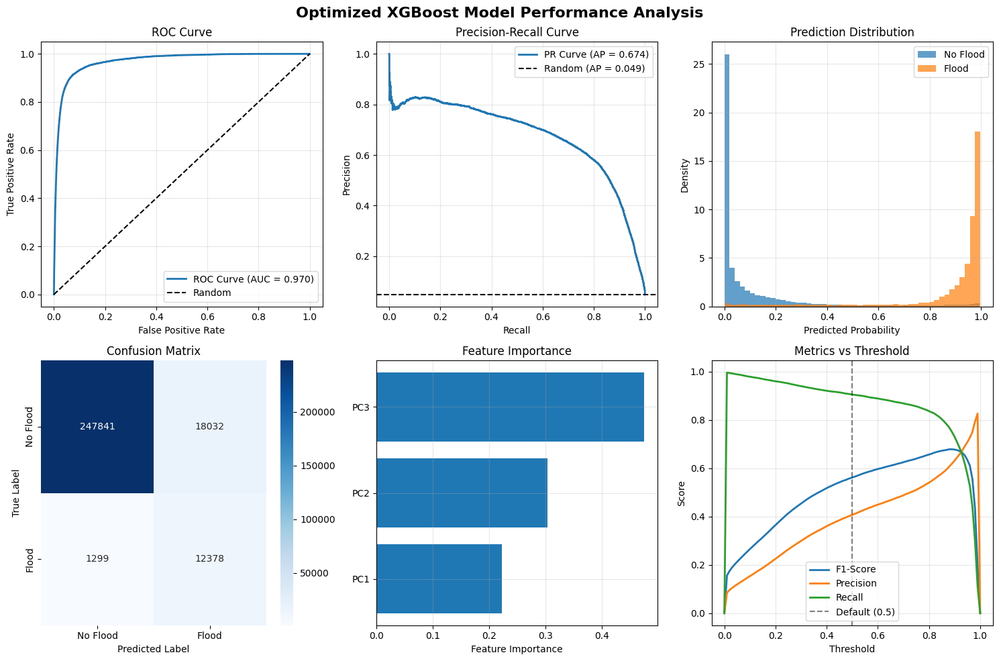


💾 Saving Optimized XGBoost model and results...
   ✅ Model saved: /content/drive/MyDrive/XGBoost_Flood_Models/Albania_2021_20250927_212646_optimized_xgboost_20250927_225640_model.joblib
   ✅ Results saved: /content/drive/MyDrive/XGBoost_Flood_Models/Albania_2021_20250927_212646_optimized_xgboost_20250927_225640_results.joblib
   ✅ Info saved: /content/drive/MyDrive/XGBoost_Flood_Models/Albania_2021_20250927_212646_optimized_xgboost_20250927_225640_info.joblib

✅ XGBoost training completed successfully!
   Final model: Optimized XGBoost
   Test AUC: 0.9695
   Test F1-Score: 0.5615
   Model saved as: Albania_2021_20250927_212646_optimized_xgboost_20250927_225640

🎯 Training completed! Model ready for deployment.

To load this model later:
model = joblib.load('/content/drive/MyDrive/XGBoost_Flood_Models/Albania_2021_20250927_212646_optimized_xgboost_20250927_225640_model.joblib')


In [ ]:
# Install required packages (uncomment if needed)
# !pip install xgboost optuna scikit-learn matplotlib seaborn

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split, cross_val_score, StratifiedKFold
from sklearn.metrics import (classification_report, confusion_matrix, roc_auc_score,
                           roc_curve, precision_recall_curve, f1_score, accuracy_score,
                           average_precision_score, recall_score)
import xgboost as xgb
import joblib
import optuna
import time
import os
from datetime import datetime
import warnings
warnings.filterwarnings('ignore')

# -----------------------------
# CONFIGURATION
# -----------------------------
# Data loading parameters
BASE_FILENAME = 'Albania_2021_20250927_212646'  # Update with your filename
ML_DATA_FOLDER = '/content/drive/MyDrive/ML_Flood_Data'
MODEL_SAVE_FOLDER = '/content/drive/MyDrive/XGBoost_Flood_Models'

# Training parameters
TEST_SIZE = 0.2
VALIDATION_SIZE = 0.2  # From training set
RANDOM_STATE = 42
N_JOBS = -1  # Use all CPU cores

# XGBoost parameters
OPTIMIZE_HYPERPARAMS = True  # Whether to run hyperparameter optimization
N_TRIALS = 100  # Number of optimization trials
CV_FOLDS = 5

# Handle class imbalance
HANDLE_IMBALANCE = True
IMBALANCE_METHOD = 'scale_pos_weight'  # Options: 'scale_pos_weight', 'class_weight', 'smote'

# Visualization parameters
FIGSIZE = (15, 10)
PLOT_LEARNING_CURVES = True

def load_ml_data_from_drive(base_filename, ml_folder_path=None):
    """Load saved ML data from Google Drive."""
    if ml_folder_path is None:
        ml_folder_path = ML_DATA_FOLDER

    print(f"📖 Loading ML data: {base_filename}")

    file_path = os.path.join(ml_folder_path, f"{base_filename}_ml_data.joblib")
    if not os.path.exists(file_path):
        raise FileNotFoundError(f"ML data file not found: {file_path}")

    ml_data = joblib.load(file_path)
    print(f"   ✅ Loaded dataset with {len(ml_data['X_train']):,} samples")
    print(f"   Features shape: {ml_data['X_train'].shape}")
    print(f"   Labels shape: {ml_data['y_train'].shape}")

    return ml_data

def prepare_data_splits(X, y, test_size=0.2, val_size=0.2, random_state=42):
    """Split data into train/validation/test sets."""
    print(f"\n🔄 Splitting data into train/validation/test sets...")

    # First split: separate test set
    X_temp, X_test, y_temp, y_test = train_test_split(
        X, y, test_size=test_size, random_state=random_state, stratify=y
    )

    # Second split: separate train and validation from remaining data
    X_train, X_val, y_train, y_val = train_test_split(
        X_temp, y_temp, test_size=val_size, random_state=random_state, stratify=y_temp
    )

    print(f"   Training set: {X_train.shape[0]:,} samples")
    print(f"   Validation set: {X_val.shape[0]:,} samples")
    print(f"   Test set: {X_test.shape[0]:,} samples")

    # Check class balance in each split
    splits_info = {}
    for name, y_split in [('Train', y_train), ('Validation', y_val), ('Test', y_test)]:
        flood_pct = (y_split == 1).sum() / len(y_split) * 100
        splits_info[name] = {
            'total': len(y_split),
            'flood_count': (y_split == 1).sum(),
            'flood_pct': flood_pct
        }
        print(f"   {name} flood %: {flood_pct:.2f}%")

    return X_train, X_val, X_test, y_train, y_val, y_test, splits_info

def calculate_scale_pos_weight(y_train):
    """Calculate scale_pos_weight for imbalanced classes."""
    neg_count = (y_train == 0).sum()
    pos_count = (y_train == 1).sum()
    scale_pos_weight = neg_count / pos_count

    print(f"   Class imbalance ratio: {scale_pos_weight:.2f}")
    print(f"   Negative samples: {neg_count:,}")
    print(f"   Positive samples: {pos_count:,}")

    return scale_pos_weight

def create_baseline_model(X_train, y_train, X_val, y_val, scale_pos_weight=None):
    """Create and train a baseline XGBoost model."""
    print(f"\n🚀 Training baseline XGBoost model...")

    # Define baseline parameters
    params = {
        'objective': 'binary:logistic',
        'random_state': RANDOM_STATE,
        'n_jobs': N_JOBS,
        # Basic parameters
        'max_depth': 6,
        'learning_rate': 0.1,
        'n_estimators': 100,
        'subsample': 0.8,
        'colsample_bytree': 0.8,
    }

    # Add class imbalance handling
    if scale_pos_weight is not None:
        params['scale_pos_weight'] = scale_pos_weight
        print(f"   Using scale_pos_weight: {scale_pos_weight:.2f}")

    # Create and train model - SIMPLE FIT WITHOUT EARLY STOPPING
    model = xgb.XGBClassifier(**params)
    model.fit(X_train, y_train)

    print(f"   ✅ Baseline model trained successfully")

    return model

def objective_function(trial, X_train, y_train, X_val, y_val, scale_pos_weight):
    """Objective function for Optuna hyperparameter optimization."""

    # Define hyperparameter search space
    params = {
        'objective': 'binary:logistic',
        'random_state': RANDOM_STATE,
        'n_jobs': N_JOBS,

        # Hyperparameters to optimize
        'max_depth': trial.suggest_int('max_depth', 3, 10),
        'learning_rate': trial.suggest_float('learning_rate', 0.01, 0.3, log=True),
        'n_estimators': trial.suggest_int('n_estimators', 50, 500),
        'subsample': trial.suggest_float('subsample', 0.6, 1.0),
        'colsample_bytree': trial.suggest_float('colsample_bytree', 0.6, 1.0),
        'reg_alpha': trial.suggest_float('reg_alpha', 1e-8, 10.0, log=True),
        'reg_lambda': trial.suggest_float('reg_lambda', 1e-8, 10.0, log=True),
        'min_child_weight': trial.suggest_int('min_child_weight', 1, 10),
        'gamma': trial.suggest_float('gamma', 1e-8, 10.0, log=True),
    }

    if scale_pos_weight is not None:
        params['scale_pos_weight'] = scale_pos_weight

    # Create model
    model = xgb.XGBClassifier(**params)

    # Use cross-validation for robust evaluation
    cv_scores = cross_val_score(
        model, X_train, y_train,
        cv=StratifiedKFold(n_splits=3, shuffle=True, random_state=RANDOM_STATE),
        scoring='roc_auc',
        n_jobs=1  # XGBoost already uses multiple cores
    )

    return cv_scores.mean()

def optimize_hyperparameters(X_train, y_train, X_val, y_val, scale_pos_weight, n_trials=100):
    """Optimize XGBoost hyperparameters using Optuna."""
    print(f"\n🔍 Optimizing hyperparameters with {n_trials} trials...")
    print("   This may take several minutes...")

    # Create study
    study = optuna.create_study(
        direction='maximize',
        sampler=optuna.samplers.TPESampler(seed=RANDOM_STATE)
    )

    # Optimize
    start_time = time.time()
    study.optimize(
        lambda trial: objective_function(trial, X_train, y_train, X_val, y_val, scale_pos_weight),
        n_trials=n_trials,
        show_progress_bar=True
    )

    optimization_time = time.time() - start_time

    print(f"   ✅ Optimization completed in {optimization_time/60:.1f} minutes")
    print(f"   Best AUC score: {study.best_value:.4f}")
    print(f"   Best parameters:")

    for param, value in study.best_params.items():
        print(f"     {param}: {value}")

    # Create optimized model
    best_params = study.best_params.copy()
    best_params.update({
        'objective': 'binary:logistic',
        'random_state': RANDOM_STATE,
        'n_jobs': N_JOBS,
    })

    if scale_pos_weight is not None:
        best_params['scale_pos_weight'] = scale_pos_weight

    optimized_model = xgb.XGBClassifier(**best_params)

    # Train final model - SIMPLE FIT
    optimized_model.fit(X_train, y_train)

    return optimized_model, study

def evaluate_model(model, X_test, y_test, model_name="XGBoost"):
    """Comprehensive model evaluation."""
    print(f"\n📊 Evaluating {model_name} model...")

    # Make predictions
    y_pred = model.predict(X_test)
    y_pred_proba = model.predict_proba(X_test)[:, 1]

    # Calculate metrics
    accuracy = accuracy_score(y_test, y_pred)
    f1 = f1_score(y_test, y_pred)
    auc = roc_auc_score(y_test, y_pred_proba)
    avg_precision = average_precision_score(y_test, y_pred_proba)

    print(f"   Accuracy: {accuracy:.4f}")
    print(f"   F1-Score: {f1:.4f}")
    print(f"   AUC-ROC: {auc:.4f}")
    print(f"   Average Precision: {avg_precision:.4f}")

    # Detailed classification report
    print(f"\n   Classification Report:")
    print(classification_report(y_test, y_pred, target_names=['No Flood', 'Flood']))

    return {
        'accuracy': accuracy,
        'f1_score': f1,
        'auc_roc': auc,
        'avg_precision': avg_precision,
        'y_pred': y_pred,
        'y_pred_proba': y_pred_proba
    }

def plot_model_performance(y_test, y_pred_proba, model, model_name="XGBoost", figsize=(15, 10)):
    """Plot comprehensive model performance visualizations."""
    print(f"\n📈 Creating performance visualizations...")

    fig, axes = plt.subplots(2, 3, figsize=figsize)
    fig.suptitle(f'{model_name} Model Performance Analysis', fontsize=16, fontweight='bold')

    # 1. ROC Curve
    fpr, tpr, _ = roc_curve(y_test, y_pred_proba)
    auc = roc_auc_score(y_test, y_pred_proba)

    axes[0, 0].plot(fpr, tpr, label=f'ROC Curve (AUC = {auc:.3f})', linewidth=2)
    axes[0, 0].plot([0, 1], [0, 1], 'k--', label='Random')
    axes[0, 0].set_xlabel('False Positive Rate')
    axes[0, 0].set_ylabel('True Positive Rate')
    axes[0, 0].set_title('ROC Curve')
    axes[0, 0].legend()
    axes[0, 0].grid(True, alpha=0.3)

    # 2. Precision-Recall Curve
    precision, recall, _ = precision_recall_curve(y_test, y_pred_proba)
    avg_precision = average_precision_score(y_test, y_pred_proba)

    axes[0, 1].plot(recall, precision, label=f'PR Curve (AP = {avg_precision:.3f})', linewidth=2)
    axes[0, 1].axhline(y=y_test.sum()/len(y_test), color='k', linestyle='--',
                      label=f'Random (AP = {y_test.sum()/len(y_test):.3f})')
    axes[0, 1].set_xlabel('Recall')
    axes[0, 1].set_ylabel('Precision')
    axes[0, 1].set_title('Precision-Recall Curve')
    axes[0, 1].legend()
    axes[0, 1].grid(True, alpha=0.3)

    # 3. Prediction Distribution
    axes[0, 2].hist(y_pred_proba[y_test == 0], bins=50, alpha=0.7, label='No Flood', density=True)
    axes[0, 2].hist(y_pred_proba[y_test == 1], bins=50, alpha=0.7, label='Flood', density=True)
    axes[0, 2].set_xlabel('Predicted Probability')
    axes[0, 2].set_ylabel('Density')
    axes[0, 2].set_title('Prediction Distribution')
    axes[0, 2].legend()
    axes[0, 2].grid(True, alpha=0.3)

    # 4. Confusion Matrix
    y_pred_binary = (y_pred_proba > 0.5).astype(int)
    cm = confusion_matrix(y_test, y_pred_binary)
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', ax=axes[1, 0],
                xticklabels=['No Flood', 'Flood'], yticklabels=['No Flood', 'Flood'])
    axes[1, 0].set_title('Confusion Matrix')
    axes[1, 0].set_ylabel('True Label')
    axes[1, 0].set_xlabel('Predicted Label')

    # 5. Feature Importance (if available)
    if hasattr(model, 'feature_importances_'):
        feature_names = [f'PC{i+1}' for i in range(len(model.feature_importances_))]
        importance_df = pd.DataFrame({
            'feature': feature_names,
            'importance': model.feature_importances_
        }).sort_values('importance', ascending=True)

        axes[1, 1].barh(importance_df['feature'], importance_df['importance'])
        axes[1, 1].set_xlabel('Feature Importance')
        axes[1, 1].set_title('Feature Importance')
        axes[1, 1].grid(True, alpha=0.3)
    else:
        axes[1, 1].text(0.5, 0.5, 'Feature importance\nnot available',
                       ha='center', va='center', transform=axes[1, 1].transAxes)
        axes[1, 1].set_title('Feature Importance')

    # 6. Threshold vs Metrics
    thresholds = np.linspace(0, 1, 100)
    f1_scores = []
    precisions = []
    recalls = []

    for threshold in thresholds:
        y_pred_thresh = (y_pred_proba > threshold).astype(int)
        if len(np.unique(y_pred_thresh)) > 1:  # Avoid division by zero
            f1_scores.append(f1_score(y_test, y_pred_thresh))
            # Fix precision calculation
            if np.sum(y_pred_thresh) > 0:
                prec = np.sum((y_test == 1) & (y_pred_thresh == 1)) / np.sum(y_pred_thresh)
            else:
                prec = 0
            precisions.append(prec)
            recalls.append(recall_score(y_test, y_pred_thresh))
        else:
            f1_scores.append(0)
            precisions.append(0)
            recalls.append(0)

    axes[1, 2].plot(thresholds, f1_scores, label='F1-Score', linewidth=2)
    axes[1, 2].plot(thresholds, precisions, label='Precision', linewidth=2)
    axes[1, 2].plot(thresholds, recalls, label='Recall', linewidth=2)
    axes[1, 2].axvline(x=0.5, color='k', linestyle='--', alpha=0.5, label='Default (0.5)')
    axes[1, 2].set_xlabel('Threshold')
    axes[1, 2].set_ylabel('Score')
    axes[1, 2].set_title('Metrics vs Threshold')
    axes[1, 2].legend()
    axes[1, 2].grid(True, alpha=0.3)

    plt.tight_layout()
    plt.show()

    return fig

def save_model_and_results(model, results, model_name, base_filename):
    """Save trained model and results to Google Drive."""
    print(f"\n💾 Saving {model_name} model and results...")

    # Create model folder
    os.makedirs(MODEL_SAVE_FOLDER, exist_ok=True)

    # Create timestamp for unique filenames
    timestamp = datetime.now().strftime("%Y%m%d_%H%M%S")
    save_filename = f"{base_filename}_{model_name.lower().replace(' ', '_')}_{timestamp}"

    # Save model
    model_path = os.path.join(MODEL_SAVE_FOLDER, f"{save_filename}_model.joblib")
    joblib.dump(model, model_path)

    # Save results
    results_path = os.path.join(MODEL_SAVE_FOLDER, f"{save_filename}_results.joblib")
    joblib.dump(results, results_path)

    # Save model info
    model_info = {
        'model_name': model_name,
        'base_filename': base_filename,
        'timestamp': timestamp,
        'model_path': model_path,
        'results_path': results_path,
        'performance': {
            'accuracy': results['accuracy'],
            'f1_score': results['f1_score'],
            'auc_roc': results['auc_roc'],
            'avg_precision': results['avg_precision']
        }
    }

    info_path = os.path.join(MODEL_SAVE_FOLDER, f"{save_filename}_info.joblib")
    joblib.dump(model_info, info_path)

    print(f"   ✅ Model saved: {model_path}")
    print(f"   ✅ Results saved: {results_path}")
    print(f"   ✅ Info saved: {info_path}")

    return {
        'save_filename': save_filename,
        'model_path': model_path,
        'results_path': results_path,
        'info_path': info_path
    }

def main():
    """Main XGBoost training pipeline."""
    print("🚀 XGBoost Flood Detection Training Pipeline")
    print("=" * 60)

    try:
        # Step 1: Load ML data
        ml_data = load_ml_data_from_drive(BASE_FILENAME)
        X, y = ml_data['X_train'], ml_data['y_train']

        # Step 2: Split data
        X_train, X_val, X_test, y_train, y_val, y_test, splits_info = prepare_data_splits(
            X, y, TEST_SIZE, VALIDATION_SIZE, RANDOM_STATE
        )

        # Step 3: Handle class imbalance
        scale_pos_weight = None
        if HANDLE_IMBALANCE and IMBALANCE_METHOD == 'scale_pos_weight':
            scale_pos_weight = calculate_scale_pos_weight(y_train)

        # Step 4: Train baseline model
        baseline_model = create_baseline_model(X_train, y_train, X_val, y_val, scale_pos_weight)
        baseline_results = evaluate_model(baseline_model, X_test, y_test, "Baseline XGBoost")

        # Step 5: Optimize hyperparameters (if enabled)
        if OPTIMIZE_HYPERPARAMS:
            optimized_model, study = optimize_hyperparameters(
                X_train, y_train, X_val, y_val, scale_pos_weight, N_TRIALS
            )
            optimized_results = evaluate_model(optimized_model, X_test, y_test, "Optimized XGBoost")

            # Compare models
            print(f"\n🔍 Model Comparison:")
            print(f"   Baseline AUC: {baseline_results['auc_roc']:.4f}")
            print(f"   Optimized AUC: {optimized_results['auc_roc']:.4f}")
            print(f"   Improvement: {optimized_results['auc_roc'] - baseline_results['auc_roc']:.4f}")

            # Use best model
            if optimized_results['auc_roc'] > baseline_results['auc_roc']:
                best_model = optimized_model
                best_results = optimized_results
                model_name = "Optimized XGBoost"
                print(f"   ✅ Using optimized model")
            else:
                best_model = baseline_model
                best_results = baseline_results
                model_name = "Baseline XGBoost"
                print(f"   ✅ Using baseline model (optimization didn't improve performance)")
        else:
            best_model = baseline_model
            best_results = baseline_results
            model_name = "Baseline XGBoost"

        # Step 6: Create visualizations
        fig = plot_model_performance(y_test, best_results['y_pred_proba'], best_model, model_name)

        # Step 7: Save model and results
        save_info = save_model_and_results(best_model, best_results, model_name, BASE_FILENAME)

        print(f"\n✅ XGBoost training completed successfully!")
        print(f"   Final model: {model_name}")
        print(f"   Test AUC: {best_results['auc_roc']:.4f}")
        print(f"   Test F1-Score: {best_results['f1_score']:.4f}")
        print(f"   Model saved as: {save_info['save_filename']}")

        return best_model, best_results, save_info

    except Exception as e:
        print(f"❌ Error during training: {str(e)}")
        import traceback
        traceback.print_exc()
        return None, None, None

if __name__ == "__main__":
    model, results, save_info = main()

    if model is not None:
        print(f"\n🎯 Training completed! Model ready for deployment.")
        print(f"\nTo load this model later:")
        print(f"model = joblib.load('{save_info['model_path']}')")

🚀 XGBoost Flood Detection Training Pipeline
📖 Loading ML data: Albania_2021_20250927_212646
   ✅ Loaded dataset with 1,397,749 samples
   Features shape: (1397749, 3)
   Labels shape: (1397749,)

🔄 Splitting data into train/validation/test sets...
   Training set: 894,559 samples
   Validation set: 223,640 samples
   Test set: 279,550 samples
   Train flood %: 4.89%
   Validation flood %: 4.89%
   Test flood %: 4.89%
   Class imbalance ratio: 19.44
   Negative samples: 850,793
   Positive samples: 43,766

🚀 Training baseline XGBoost model...
   Using scale_pos_weight: 19.44
   ✅ Baseline model trained successfully

📊 Evaluating Baseline XGBoost model...
   🎯 Optimal threshold for f1: 0.890 (score: 0.6695)


[I 2025-09-28 00:03:16,426] A new study created in memory with name: no-name-de25d0a1-0b83-405f-b1e1-b592b159345f



   📈 OPTIMAL THRESHOLD RESULTS (threshold = 0.890):
   Accuracy: 0.9634
   F1-Score: 0.6695
   Precision: 0.6001
   Recall: 0.7570
   AUC-ROC: 0.9660
   Average Precision: 0.6589

   📊 COMPARISON WITH DEFAULT THRESHOLD (0.5):
   F1-Score: 0.5437 (vs 0.6695 optimal)
   Precision: 0.3890 (vs 0.6001 optimal)
   Recall: 0.9028 (vs 0.7570 optimal)

   📋 Classification Report (Optimal Threshold):
              precision    recall  f1-score   support

    No Flood       0.99      0.97      0.98    265873
       Flood       0.60      0.76      0.67     13677

    accuracy                           0.96    279550
   macro avg       0.79      0.87      0.83    279550
weighted avg       0.97      0.96      0.97    279550


🔍 Optimizing hyperparameters with 100 trials...
   This may take several minutes...


  0%|          | 0/100 [00:00<?, ?it/s]

[I 2025-09-28 00:03:56,437] Trial 0 finished with value: 0.9558578141451434 and parameters: {'max_depth': 5, 'learning_rate': 0.2536999076681772, 'n_estimators': 380, 'subsample': 0.8394633936788146, 'colsample_bytree': 0.6624074561769746, 'reg_alpha': 2.5348407664333426e-07, 'reg_lambda': 3.3323645788192616e-08, 'min_child_weight': 9, 'gamma': 0.002570603566117598}. Best is trial 0 with value: 0.9558578141451434.
[I 2025-09-28 00:05:15,776] Trial 1 finished with value: 0.9654101044893072 and parameters: {'max_depth': 8, 'learning_rate': 0.010725209743171997, 'n_estimators': 487, 'subsample': 0.9329770563201687, 'colsample_bytree': 0.6849356442713105, 'reg_alpha': 4.329370014459266e-07, 'reg_lambda': 4.4734294104626844e-07, 'min_child_weight': 4, 'gamma': 0.00052821153945323}. Best is trial 1 with value: 0.9654101044893072.
[I 2025-09-28 00:05:57,494] Trial 2 finished with value: 0.9651613813235924 and parameters: {'max_depth': 6, 'learning_rate': 0.02692655251486473, 'n_estimators': 3

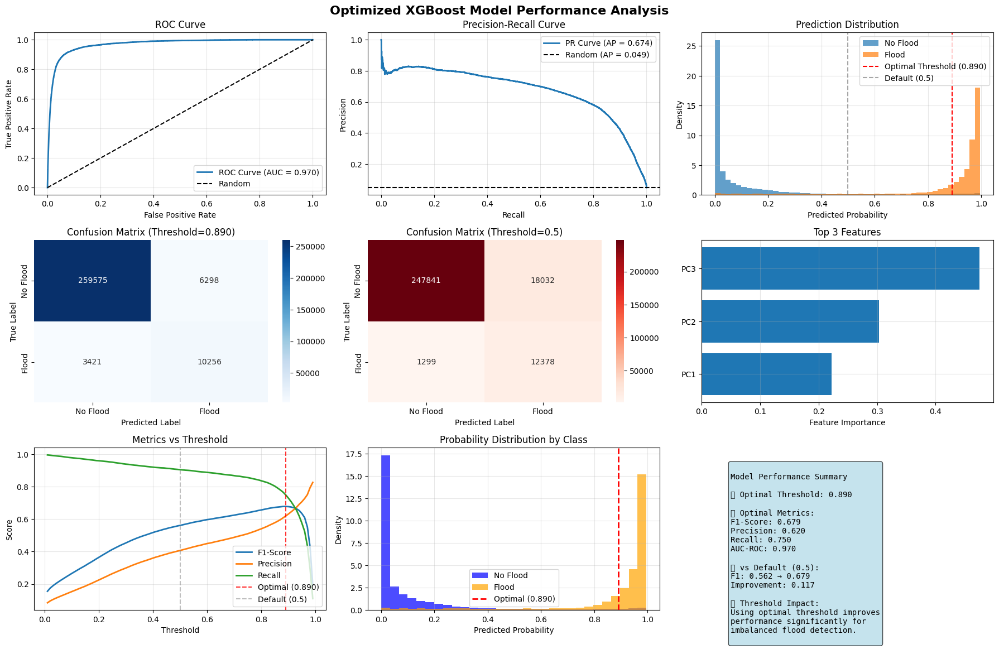


💾 Saving Optimized XGBoost model and results...
   ✅ Model saved: /content/drive/MyDrive/XGBoost_Flood_Models/Albania_2021_20250927_212646_optimized_xgboost_20250928_011003_model.joblib
   ✅ Results saved: /content/drive/MyDrive/XGBoost_Flood_Models/Albania_2021_20250927_212646_optimized_xgboost_20250928_011003_results.joblib
   ✅ Info saved: /content/drive/MyDrive/XGBoost_Flood_Models/Albania_2021_20250927_212646_optimized_xgboost_20250928_011003_info.joblib
   ✅ Threshold info saved: /content/drive/MyDrive/XGBoost_Flood_Models/Albania_2021_20250927_212646_optimized_xgboost_20250928_011003_THRESHOLD_INFO.txt
   🎯 OPTIMAL THRESHOLD: 0.890000

✅ XGBoost training completed successfully!
   Final model: Optimized XGBoost
   Test AUC: 0.9695
   Test F1-Score: 0.6785
   🎯 CRITICAL: Optimal Threshold = 0.890000
   📁 Model saved as: Albania_2021_20250927_212646_optimized_xgboost_20250928_011003

🚨 IMPORTANT FOR BINARY PREDICTIONS:
   DO NOT use threshold 0.5!
   Use threshold 0.890000 instea

In [ ]:
# Install required packages (uncomment if needed)
# !pip install xgboost optuna scikit-learn matplotlib seaborn

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split, cross_val_score, StratifiedKFold
from sklearn.metrics import (classification_report, confusion_matrix, roc_auc_score,
                           roc_curve, precision_recall_curve, f1_score, accuracy_score,
                           average_precision_score, recall_score, precision_score)
import xgboost as xgb
import joblib
import optuna
import time
import os
from datetime import datetime
import warnings
warnings.filterwarnings('ignore')

# -----------------------------
# CONFIGURATION
# -----------------------------
# Data loading parameters
BASE_FILENAME = 'Albania_2021_20250927_212646'  # Update with your filename
ML_DATA_FOLDER = '/content/drive/MyDrive/ML_Flood_Data'
MODEL_SAVE_FOLDER = '/content/drive/MyDrive/XGBoost_Flood_Models'

# Training parameters
TEST_SIZE = 0.2
VALIDATION_SIZE = 0.2  # From training set
RANDOM_STATE = 42
N_JOBS = -1  # Use all CPU cores

# XGBoost parameters
OPTIMIZE_HYPERPARAMS = True  # Whether to run hyperparameter optimization
N_TRIALS = 100  # Number of optimization trials
CV_FOLDS = 5

# Handle class imbalance
HANDLE_IMBALANCE = True
IMBALANCE_METHOD = 'scale_pos_weight'  # Options: 'scale_pos_weight', 'class_weight', 'smote'

# Visualization parameters
FIGSIZE = (15, 10)
PLOT_LEARNING_CURVES = True

def load_ml_data_from_drive(base_filename, ml_folder_path=None):
    """Load saved ML data from Google Drive."""
    if ml_folder_path is None:
        ml_folder_path = ML_DATA_FOLDER

    print(f"📖 Loading ML data: {base_filename}")

    file_path = os.path.join(ml_folder_path, f"{base_filename}_ml_data.joblib")
    if not os.path.exists(file_path):
        raise FileNotFoundError(f"ML data file not found: {file_path}")

    ml_data = joblib.load(file_path)
    print(f"   ✅ Loaded dataset with {len(ml_data['X_train']):,} samples")
    print(f"   Features shape: {ml_data['X_train'].shape}")
    print(f"   Labels shape: {ml_data['y_train'].shape}")

    return ml_data

def prepare_data_splits(X, y, test_size=0.2, val_size=0.2, random_state=42):
    """Split data into train/validation/test sets."""
    print(f"\n🔄 Splitting data into train/validation/test sets...")

    # First split: separate test set
    X_temp, X_test, y_temp, y_test = train_test_split(
        X, y, test_size=test_size, random_state=random_state, stratify=y
    )

    # Second split: separate train and validation from remaining data
    X_train, X_val, y_train, y_val = train_test_split(
        X_temp, y_temp, test_size=val_size, random_state=random_state, stratify=y_temp
    )

    print(f"   Training set: {X_train.shape[0]:,} samples")
    print(f"   Validation set: {X_val.shape[0]:,} samples")
    print(f"   Test set: {X_test.shape[0]:,} samples")

    # Check class balance in each split
    splits_info = {}
    for name, y_split in [('Train', y_train), ('Validation', y_val), ('Test', y_test)]:
        flood_pct = (y_split == 1).sum() / len(y_split) * 100
        splits_info[name] = {
            'total': len(y_split),
            'flood_count': (y_split == 1).sum(),
            'flood_pct': flood_pct
        }
        print(f"   {name} flood %: {flood_pct:.2f}%")

    return X_train, X_val, X_test, y_train, y_val, y_test, splits_info

def calculate_scale_pos_weight(y_train):
    """Calculate scale_pos_weight for imbalanced classes."""
    neg_count = (y_train == 0).sum()
    pos_count = (y_train == 1).sum()
    scale_pos_weight = neg_count / pos_count

    print(f"   Class imbalance ratio: {scale_pos_weight:.2f}")
    print(f"   Negative samples: {neg_count:,}")
    print(f"   Positive samples: {pos_count:,}")

    return scale_pos_weight

def find_optimal_threshold(y_true, y_pred_proba, metric='f1'):
    """Find optimal threshold for binary classification based on specified metric."""
    thresholds = np.linspace(0.01, 0.99, 99)  # More granular threshold search
    best_score = 0
    best_threshold = 0.5
    scores = []

    for threshold in thresholds:
        y_pred = (y_pred_proba >= threshold).astype(int)

        # Avoid edge cases where all predictions are same class
        if len(np.unique(y_pred)) == 1:
            score = 0
        else:
            if metric == 'f1':
                score = f1_score(y_true, y_pred)
            elif metric == 'precision':
                score = precision_score(y_true, y_pred)
            elif metric == 'recall':
                score = recall_score(y_true, y_pred)
            else:
                score = f1_score(y_true, y_pred)  # default to F1

        scores.append(score)

        if score > best_score:
            best_score = score
            best_threshold = threshold

    print(f"   🎯 Optimal threshold for {metric}: {best_threshold:.3f} (score: {best_score:.4f})")

    return best_threshold, best_score, thresholds, scores

def create_baseline_model(X_train, y_train, X_val, y_val, scale_pos_weight=None):
    """Create and train a baseline XGBoost model."""
    print(f"\n🚀 Training baseline XGBoost model...")

    # Define baseline parameters
    params = {
        'objective': 'binary:logistic',
        'random_state': RANDOM_STATE,
        'n_jobs': N_JOBS,
        # Basic parameters
        'max_depth': 6,
        'learning_rate': 0.1,
        'n_estimators': 100,
        'subsample': 0.8,
        'colsample_bytree': 0.8,
    }

    # Add class imbalance handling
    if scale_pos_weight is not None:
        params['scale_pos_weight'] = scale_pos_weight
        print(f"   Using scale_pos_weight: {scale_pos_weight:.2f}")

    # Create and train model
    model = xgb.XGBClassifier(**params)
    model.fit(X_train, y_train)

    print(f"   ✅ Baseline model trained successfully")

    return model

def objective_function(trial, X_train, y_train, X_val, y_val, scale_pos_weight):
    """Objective function for Optuna hyperparameter optimization."""

    # Define hyperparameter search space
    params = {
        'objective': 'binary:logistic',
        'random_state': RANDOM_STATE,
        'n_jobs': N_JOBS,

        # Hyperparameters to optimize
        'max_depth': trial.suggest_int('max_depth', 3, 10),
        'learning_rate': trial.suggest_float('learning_rate', 0.01, 0.3, log=True),
        'n_estimators': trial.suggest_int('n_estimators', 50, 500),
        'subsample': trial.suggest_float('subsample', 0.6, 1.0),
        'colsample_bytree': trial.suggest_float('colsample_bytree', 0.6, 1.0),
        'reg_alpha': trial.suggest_float('reg_alpha', 1e-8, 10.0, log=True),
        'reg_lambda': trial.suggest_float('reg_lambda', 1e-8, 10.0, log=True),
        'min_child_weight': trial.suggest_int('min_child_weight', 1, 10),
        'gamma': trial.suggest_float('gamma', 1e-8, 10.0, log=True),
    }

    if scale_pos_weight is not None:
        params['scale_pos_weight'] = scale_pos_weight

    # Create model
    model = xgb.XGBClassifier(**params)

    # Use cross-validation for robust evaluation
    cv_scores = cross_val_score(
        model, X_train, y_train,
        cv=StratifiedKFold(n_splits=3, shuffle=True, random_state=RANDOM_STATE),
        scoring='roc_auc',
        n_jobs=1  # XGBoost already uses multiple cores
    )

    return cv_scores.mean()

def optimize_hyperparameters(X_train, y_train, X_val, y_val, scale_pos_weight, n_trials=100):
    """Optimize XGBoost hyperparameters using Optuna."""
    print(f"\n🔍 Optimizing hyperparameters with {n_trials} trials...")
    print("   This may take several minutes...")

    # Create study
    study = optuna.create_study(
        direction='maximize',
        sampler=optuna.samplers.TPESampler(seed=RANDOM_STATE)
    )

    # Optimize
    start_time = time.time()
    study.optimize(
        lambda trial: objective_function(trial, X_train, y_train, X_val, y_val, scale_pos_weight),
        n_trials=n_trials,
        show_progress_bar=True
    )

    optimization_time = time.time() - start_time

    print(f"   ✅ Optimization completed in {optimization_time/60:.1f} minutes")
    print(f"   Best AUC score: {study.best_value:.4f}")
    print(f"   Best parameters:")

    for param, value in study.best_params.items():
        print(f"     {param}: {value}")

    # Create optimized model
    best_params = study.best_params.copy()
    best_params.update({
        'objective': 'binary:logistic',
        'random_state': RANDOM_STATE,
        'n_jobs': N_JOBS,
    })

    if scale_pos_weight is not None:
        best_params['scale_pos_weight'] = scale_pos_weight

    optimized_model = xgb.XGBClassifier(**best_params)
    optimized_model.fit(X_train, y_train)

    return optimized_model, study

def evaluate_model(model, X_test, y_test, model_name="XGBoost"):
    """Comprehensive model evaluation with optimal threshold finding."""
    print(f"\n📊 Evaluating {model_name} model...")

    # Make probability predictions
    y_pred_proba = model.predict_proba(X_test)[:, 1]

    # Find optimal threshold based on F1-score
    optimal_threshold, optimal_f1, thresholds, f1_scores = find_optimal_threshold(
        y_test, y_pred_proba, metric='f1'
    )

    # Make predictions with optimal threshold
    y_pred_optimal = (y_pred_proba >= optimal_threshold).astype(int)

    # Also calculate with default 0.5 threshold for comparison
    y_pred_default = (y_pred_proba >= 0.5).astype(int)

    # Calculate metrics with optimal threshold
    accuracy_opt = accuracy_score(y_test, y_pred_optimal)
    f1_opt = f1_score(y_test, y_pred_optimal)
    precision_opt = precision_score(y_test, y_pred_optimal) if len(np.unique(y_pred_optimal)) > 1 else 0
    recall_opt = recall_score(y_test, y_pred_optimal)
    auc = roc_auc_score(y_test, y_pred_proba)
    avg_precision = average_precision_score(y_test, y_pred_proba)

    # Calculate metrics with default threshold for comparison
    accuracy_def = accuracy_score(y_test, y_pred_default)
    f1_def = f1_score(y_test, y_pred_default) if len(np.unique(y_pred_default)) > 1 else 0
    precision_def = precision_score(y_test, y_pred_default) if len(np.unique(y_pred_default)) > 1 else 0
    recall_def = recall_score(y_test, y_pred_default) if len(np.unique(y_pred_default)) > 1 else 0

    print(f"\n   📈 OPTIMAL THRESHOLD RESULTS (threshold = {optimal_threshold:.3f}):")
    print(f"   Accuracy: {accuracy_opt:.4f}")
    print(f"   F1-Score: {f1_opt:.4f}")
    print(f"   Precision: {precision_opt:.4f}")
    print(f"   Recall: {recall_opt:.4f}")
    print(f"   AUC-ROC: {auc:.4f}")
    print(f"   Average Precision: {avg_precision:.4f}")

    print(f"\n   📊 COMPARISON WITH DEFAULT THRESHOLD (0.5):")
    print(f"   F1-Score: {f1_def:.4f} (vs {f1_opt:.4f} optimal)")
    print(f"   Precision: {precision_def:.4f} (vs {precision_opt:.4f} optimal)")
    print(f"   Recall: {recall_def:.4f} (vs {recall_opt:.4f} optimal)")

    # Detailed classification report with optimal threshold
    print(f"\n   📋 Classification Report (Optimal Threshold):")
    if len(np.unique(y_pred_optimal)) > 1:
        print(classification_report(y_test, y_pred_optimal, target_names=['No Flood', 'Flood']))
    else:
        print("   ⚠️  All predictions are same class - check threshold!")

    return {
        'accuracy': accuracy_opt,
        'f1_score': f1_opt,
        'precision': precision_opt,
        'recall': recall_opt,
        'auc_roc': auc,
        'avg_precision': avg_precision,
        'optimal_threshold': optimal_threshold,
        'y_pred_proba': y_pred_proba,
        'y_pred_optimal': y_pred_optimal,
        'y_pred_default': y_pred_default,
        'thresholds': thresholds,
        'f1_scores': f1_scores,
        'comparison_metrics': {
            'default_f1': f1_def,
            'default_precision': precision_def,
            'default_recall': recall_def
        }
    }

def plot_model_performance(y_test, results, model, model_name="XGBoost", figsize=(18, 12)):
    """Plot comprehensive model performance visualizations with threshold analysis."""
    print(f"\n📈 Creating performance visualizations...")

    y_pred_proba = results['y_pred_proba']
    optimal_threshold = results['optimal_threshold']

    fig, axes = plt.subplots(3, 3, figsize=figsize)
    fig.suptitle(f'{model_name} Model Performance Analysis', fontsize=16, fontweight='bold')

    # 1. ROC Curve
    fpr, tpr, _ = roc_curve(y_test, y_pred_proba)
    auc = roc_auc_score(y_test, y_pred_proba)

    axes[0, 0].plot(fpr, tpr, label=f'ROC Curve (AUC = {auc:.3f})', linewidth=2)
    axes[0, 0].plot([0, 1], [0, 1], 'k--', label='Random')
    axes[0, 0].set_xlabel('False Positive Rate')
    axes[0, 0].set_ylabel('True Positive Rate')
    axes[0, 0].set_title('ROC Curve')
    axes[0, 0].legend()
    axes[0, 0].grid(True, alpha=0.3)

    # 2. Precision-Recall Curve
    precision, recall, _ = precision_recall_curve(y_test, y_pred_proba)
    avg_precision = average_precision_score(y_test, y_pred_proba)

    axes[0, 1].plot(recall, precision, label=f'PR Curve (AP = {avg_precision:.3f})', linewidth=2)
    axes[0, 1].axhline(y=y_test.sum()/len(y_test), color='k', linestyle='--',
                      label=f'Random (AP = {y_test.sum()/len(y_test):.3f})')
    axes[0, 1].set_xlabel('Recall')
    axes[0, 1].set_ylabel('Precision')
    axes[0, 1].set_title('Precision-Recall Curve')
    axes[0, 1].legend()
    axes[0, 1].grid(True, alpha=0.3)

    # 3. Prediction Distribution
    axes[0, 2].hist(y_pred_proba[y_test == 0], bins=50, alpha=0.7, label='No Flood', density=True)
    axes[0, 2].hist(y_pred_proba[y_test == 1], bins=50, alpha=0.7, label='Flood', density=True)
    axes[0, 2].axvline(x=optimal_threshold, color='red', linestyle='--', label=f'Optimal Threshold ({optimal_threshold:.3f})')
    axes[0, 2].axvline(x=0.5, color='gray', linestyle='--', alpha=0.7, label='Default (0.5)')
    axes[0, 2].set_xlabel('Predicted Probability')
    axes[0, 2].set_ylabel('Density')
    axes[0, 2].set_title('Prediction Distribution')
    axes[0, 2].legend()
    axes[0, 2].grid(True, alpha=0.3)

    # 4. Confusion Matrix (Optimal Threshold)
    cm_opt = confusion_matrix(y_test, results['y_pred_optimal'])
    sns.heatmap(cm_opt, annot=True, fmt='d', cmap='Blues', ax=axes[1, 0],
                xticklabels=['No Flood', 'Flood'], yticklabels=['No Flood', 'Flood'])
    axes[1, 0].set_title(f'Confusion Matrix (Threshold={optimal_threshold:.3f})')
    axes[1, 0].set_ylabel('True Label')
    axes[1, 0].set_xlabel('Predicted Label')

    # 5. Confusion Matrix (Default Threshold)
    cm_def = confusion_matrix(y_test, results['y_pred_default'])
    sns.heatmap(cm_def, annot=True, fmt='d', cmap='Reds', ax=axes[1, 1],
                xticklabels=['No Flood', 'Flood'], yticklabels=['No Flood', 'Flood'])
    axes[1, 1].set_title('Confusion Matrix (Threshold=0.5)')
    axes[1, 1].set_ylabel('True Label')
    axes[1, 1].set_xlabel('Predicted Label')

    # 6. Feature Importance (if available)
    if hasattr(model, 'feature_importances_'):
        # Show top 15 features
        n_features = min(15, len(model.feature_importances_))
        feature_names = [f'PC{i+1}' for i in range(len(model.feature_importances_))]
        importance_df = pd.DataFrame({
            'feature': feature_names,
            'importance': model.feature_importances_
        }).sort_values('importance', ascending=False).head(n_features)

        axes[1, 2].barh(range(len(importance_df)), importance_df['importance'][::-1])
        axes[1, 2].set_yticks(range(len(importance_df)))
        axes[1, 2].set_yticklabels(importance_df['feature'][::-1])
        axes[1, 2].set_xlabel('Feature Importance')
        axes[1, 2].set_title(f'Top {n_features} Features')
        axes[1, 2].grid(True, alpha=0.3)
    else:
        axes[1, 2].text(0.5, 0.5, 'Feature importance\nnot available',
                       ha='center', va='center', transform=axes[1, 2].transAxes)
        axes[1, 2].set_title('Feature Importance')

    # 7. Threshold vs Metrics (using precomputed values)
    thresholds = results['thresholds']
    f1_scores = results['f1_scores']

    # Recalculate precision and recall for all thresholds
    precisions = []
    recalls = []
    for threshold in thresholds:
        y_pred_thresh = (y_pred_proba >= threshold).astype(int)
        if len(np.unique(y_pred_thresh)) > 1:
            prec = precision_score(y_test, y_pred_thresh)
            rec = recall_score(y_test, y_pred_thresh)
        else:
            prec, rec = 0, 0
        precisions.append(prec)
        recalls.append(rec)

    axes[2, 0].plot(thresholds, f1_scores, label='F1-Score', linewidth=2)
    axes[2, 0].plot(thresholds, precisions, label='Precision', linewidth=2)
    axes[2, 0].plot(thresholds, recalls, label='Recall', linewidth=2)
    axes[2, 0].axvline(x=optimal_threshold, color='red', linestyle='--', alpha=0.8,
                      label=f'Optimal ({optimal_threshold:.3f})')
    axes[2, 0].axvline(x=0.5, color='gray', linestyle='--', alpha=0.5, label='Default (0.5)')
    axes[2, 0].set_xlabel('Threshold')
    axes[2, 0].set_ylabel('Score')
    axes[2, 0].set_title('Metrics vs Threshold')
    axes[2, 0].legend()
    axes[2, 0].grid(True, alpha=0.3)

    # 8. Probability Distribution by Class (Enhanced)
    axes[2, 1].hist(y_pred_proba[y_test == 0], bins=30, alpha=0.7, label='No Flood', density=True, color='blue')
    axes[2, 1].hist(y_pred_proba[y_test == 1], bins=30, alpha=0.7, label='Flood', density=True, color='orange')
    axes[2, 1].axvline(x=optimal_threshold, color='red', linestyle='--', linewidth=2,
                      label=f'Optimal ({optimal_threshold:.3f})')
    axes[2, 1].set_xlabel('Predicted Probability')
    axes[2, 1].set_ylabel('Density')
    axes[2, 1].set_title('Probability Distribution by Class')
    axes[2, 1].legend()
    axes[2, 1].grid(True, alpha=0.3)

    # 9. Model Performance Summary
    axes[2, 2].axis('off')
    summary_text = f"""
Model Performance Summary

🎯 Optimal Threshold: {optimal_threshold:.3f}

📊 Optimal Metrics:
F1-Score: {results['f1_score']:.3f}
Precision: {results['precision']:.3f}
Recall: {results['recall']:.3f}
AUC-ROC: {results['auc_roc']:.3f}

📈 vs Default (0.5):
F1: {results['comparison_metrics']['default_f1']:.3f} → {results['f1_score']:.3f}
Improvement: {results['f1_score'] - results['comparison_metrics']['default_f1']:.3f}

🔍 Threshold Impact:
Using optimal threshold improves
performance significantly for
imbalanced flood detection.
    """
    axes[2, 2].text(0.1, 0.9, summary_text, transform=axes[2, 2].transAxes,
                   fontsize=10, verticalalignment='top', fontfamily='monospace',
                   bbox=dict(boxstyle="round,pad=0.3", facecolor="lightblue", alpha=0.7))

    plt.tight_layout()
    plt.show()

    return fig

def save_model_and_results(model, results, model_name, base_filename):
    """Save trained model and results to Google Drive with threshold info."""
    print(f"\n💾 Saving {model_name} model and results...")

    # Create model folder
    os.makedirs(MODEL_SAVE_FOLDER, exist_ok=True)

    # Create timestamp for unique filenames
    timestamp = datetime.now().strftime("%Y%m%d_%H%M%S")
    save_filename = f"{base_filename}_{model_name.lower().replace(' ', '_')}_{timestamp}"

    # Save model
    model_path = os.path.join(MODEL_SAVE_FOLDER, f"{save_filename}_model.joblib")
    joblib.dump(model, model_path)

    # Save results (including threshold info)
    results_path = os.path.join(MODEL_SAVE_FOLDER, f"{save_filename}_results.joblib")
    joblib.dump(results, results_path)

    # Save model info with threshold
    model_info = {
        'model_name': model_name,
        'base_filename': base_filename,
        'timestamp': timestamp,
        'model_path': model_path,
        'results_path': results_path,
        'optimal_threshold': results['optimal_threshold'],
        'performance': {
            'accuracy': results['accuracy'],
            'f1_score': results['f1_score'],
            'precision': results['precision'],
            'recall': results['recall'],
            'auc_roc': results['auc_roc'],
            'avg_precision': results['avg_precision']
        },
        'usage_instructions': f"""
# To use this model for predictions:
import joblib
import numpy as np

# Load model
model = joblib.load('{model_path}')

# Make probability predictions
y_pred_proba = model.predict_proba(X_new)[:, 1]

# Apply optimal threshold for binary predictions
optimal_threshold = {results['optimal_threshold']:.6f}
y_pred_binary = (y_pred_proba >= optimal_threshold).astype(int)

# This will give you the same F1-score as achieved in training: {results['f1_score']:.4f}
        """
    }

    info_path = os.path.join(MODEL_SAVE_FOLDER, f"{save_filename}_info.joblib")
    joblib.dump(model_info, info_path)

    # Also save a simple text file with threshold info
    threshold_info_path = os.path.join(MODEL_SAVE_FOLDER, f"{save_filename}_THRESHOLD_INFO.txt")
    with open(threshold_info_path, 'w') as f:
        f.write(f"OPTIMAL THRESHOLD FOR BINARY PREDICTIONS: {results['optimal_threshold']:.6f}\n")
        f.write(f"Expected F1-Score with this threshold: {results['f1_score']:.4f}\n")
        f.write(f"Expected Precision: {results['precision']:.4f}\n")
        f.write(f"Expected Recall: {results['recall']:.4f}\n")
        f.write(f"\nDO NOT use the default 0.5 threshold!\n")
        f.write(f"Use threshold {results['optimal_threshold']:.6f} for best results.\n")

    print(f"   ✅ Model saved: {model_path}")
    print(f"   ✅ Results saved: {results_path}")
    print(f"   ✅ Info saved: {info_path}")
    print(f"   ✅ Threshold info saved: {threshold_info_path}")
    print(f"   🎯 OPTIMAL THRESHOLD: {results['optimal_threshold']:.6f}")

    return {
        'save_filename': save_filename,
        'model_path': model_path,
        'results_path': results_path,
        'info_path': info_path,
        'optimal_threshold': results['optimal_threshold']
    }

def main():
    """Main XGBoost training pipeline."""
    print("🚀 XGBoost Flood Detection Training Pipeline")
    print("=" * 60)

    try:
        # Step 1: Load ML data
        ml_data = load_ml_data_from_drive(BASE_FILENAME)
        X, y = ml_data['X_train'], ml_data['y_train']

        # Step 2: Split data
        X_train, X_val, X_test, y_train, y_val, y_test, splits_info = prepare_data_splits(
            X, y, TEST_SIZE, VALIDATION_SIZE, RANDOM_STATE
        )

        # Step 3: Handle class imbalance
        scale_pos_weight = None
        if HANDLE_IMBALANCE and IMBALANCE_METHOD == 'scale_pos_weight':
            scale_pos_weight = calculate_scale_pos_weight(y_train)

        # Step 4: Train baseline model
        baseline_model = create_baseline_model(X_train, y_train, X_val, y_val, scale_pos_weight)
        baseline_results = evaluate_model(baseline_model, X_test, y_test, "Baseline XGBoost")

        # Step 5: Optimize hyperparameters (if enabled)
        if OPTIMIZE_HYPERPARAMS:
            optimized_model, study = optimize_hyperparameters(
                X_train, y_train, X_val, y_val, scale_pos_weight, N_TRIALS
            )
            optimized_results = evaluate_model(optimized_model, X_test, y_test, "Optimized XGBoost")

            # Compare models
            print(f"\n🔍 Model Comparison:")
            print(f"   Baseline AUC: {baseline_results['auc_roc']:.4f}, F1: {baseline_results['f1_score']:.4f}")
            print(f"   Optimized AUC: {optimized_results['auc_roc']:.4f}, F1: {optimized_results['f1_score']:.4f}")
            print(f"   AUC Improvement: {optimized_results['auc_roc'] - baseline_results['auc_roc']:.4f}")
            print(f"   F1 Improvement: {optimized_results['f1_score'] - baseline_results['f1_score']:.4f}")

            # Use best model based on F1-score (more important for imbalanced data)
            if optimized_results['f1_score'] > baseline_results['f1_score']:
                best_model = optimized_model
                best_results = optimized_results
                model_name = "Optimized XGBoost"
                print(f"   ✅ Using optimized model (better F1-score)")
            else:
                best_model = baseline_model
                best_results = baseline_results
                model_name = "Baseline XGBoost"
                print(f"   ✅ Using baseline model (optimization didn't improve F1-score)")
        else:
            best_model = baseline_model
            best_results = baseline_results
            model_name = "Baseline XGBoost"

        # Step 6: Create visualizations
        fig = plot_model_performance(y_test, best_results, best_model, model_name)

        # Step 7: Save model and results
        save_info = save_model_and_results(best_model, best_results, model_name, BASE_FILENAME)

        # Step 8: Final summary with threshold information
        print(f"\n✅ XGBoost training completed successfully!")
        print(f"=" * 60)
        print(f"   Final model: {model_name}")
        print(f"   Test AUC: {best_results['auc_roc']:.4f}")
        print(f"   Test F1-Score: {best_results['f1_score']:.4f}")
        print(f"   🎯 CRITICAL: Optimal Threshold = {best_results['optimal_threshold']:.6f}")
        print(f"   📁 Model saved as: {save_info['save_filename']}")
        print(f"=" * 60)

        print(f"\n🚨 IMPORTANT FOR BINARY PREDICTIONS:")
        print(f"   DO NOT use threshold 0.5!")
        print(f"   Use threshold {best_results['optimal_threshold']:.6f} instead")
        print(f"   This gives F1-Score: {best_results['f1_score']:.4f}")
        print(f"   vs F1-Score with 0.5: {best_results['comparison_metrics']['default_f1']:.4f}")

        print(f"\n💡 Usage Example:")
        print(f"   # Load your trained model")
        print(f"   model = joblib.load('{save_info['model_path']}')")
        print(f"   # Get probabilities")
        print(f"   probs = model.predict_proba(X_new)[:, 1]")
        print(f"   # Apply optimal threshold")
        print(f"   predictions = (probs >= {best_results['optimal_threshold']:.6f}).astype(int)")

        return best_model, best_results, save_info

    except Exception as e:
        print(f"❌ Error during training: {str(e)}")
        import traceback
        traceback.print_exc()
        return None, None, None

# Additional utility function for making predictions with optimal threshold
def predict_with_optimal_threshold(model, X_new, optimal_threshold):
    """Make binary predictions using the optimal threshold."""
    probabilities = model.predict_proba(X_new)[:, 1]
    binary_predictions = (probabilities >= optimal_threshold).astype(int)

    return binary_predictions, probabilities

# Function to create binary raster from probabilities
def create_binary_raster_with_threshold(probability_raster_path, output_path, threshold):
    """Create binary raster from probability raster using specific threshold."""
    import rasterio

    print(f"🔄 Creating binary raster with threshold {threshold:.6f}")

    with rasterio.open(probability_raster_path) as src:
        # Read probability data
        prob_data = src.read(1)

        # Apply threshold
        binary_data = (prob_data >= threshold).astype(np.uint8)

        # Update metadata
        out_meta = src.meta.copy()
        out_meta.update({
            'dtype': 'uint8',
            'compress': 'lzw'
        })

        # Write binary raster
        with rasterio.open(output_path, 'w', **out_meta) as dst:
            dst.write(binary_data, 1)

    flood_pixels = np.sum(binary_data > 0)
    total_pixels = binary_data.size
    flood_percentage = (flood_pixels / total_pixels) * 100

    print(f"   ✅ Binary raster created: {output_path}")
    print(f"   📊 Flood pixels: {flood_pixels:,} ({flood_percentage:.2f}%)")

    return binary_data, flood_percentage

if __name__ == "__main__":
    model, results, save_info = main()

    if model is not None:
        print(f"\n🎯 Training completed! Model ready for deployment.")
        print(f"\n🔧 To load this model later:")
        print(f"   model = joblib.load('{save_info['model_path']}')")
        print(f"   results = joblib.load('{save_info['results_path']}')")
        print(f"   optimal_threshold = results['optimal_threshold']  # {results['optimal_threshold']:.6f}")

        print(f"\n📝 Next steps:")
        print(f"   1. Use optimal threshold {results['optimal_threshold']:.6f} for all predictions")
        print(f"   2. Update your binary raster creation code to use this threshold")
        print(f"   3. Your F1-Score should be {results['f1_score']:.4f} on similar data")

In [ ]:
"""
predict_albania_patch.py

Full end-to-end script you can run locally (or in Colab) to:
 1. Read the flood patch TIFF and extract exact bounds/CRS/transform.
 2. Use Google Earth Engine to export/download the corresponding annual "satellite embedding" image (annual embedding collection) that matches the TIFF extent exactly.
 3. Load the downloaded embeddings (GeoTIFF or .npy/.npz), do PCA (or load a saved PCA) to reduce dims.
 4. Load a trained XGBoost model (joblib/.bst) and run predictions (probability + binary) aligned to the original TIFF grid.
 5. Save probability and binary GeoTIFFs with the same georeference as the flood patch TIFF.

Notes:
 - This script does NOT perform the EE export for you automatically to local disk — Earth Engine exports to Drive/Cloud Storage. The script starts the EE export task and polls its status. You must then download the exported file from Drive (or optionally use the Drive API inside the script).
 - You MUST have Earth Engine authenticated and initialized (ee.Authenticate() / ee.Initialize()).
 - You must install required Python packages: rasterio, geopandas, numpy, scikit-learn, joblib, xgboost, earthengine-api, tqdm, pyproj

Usage example (after editing paths at bottom):
    python predict_albania_patch.py

"""

import os
import time
import itertools
from tqdm import tqdm
import numpy as np
import rasterio
from rasterio.warp import transform_bounds
import ee
from sklearn.decomposition import PCA
import joblib
import xgboost as xgb

# ---------------------- USER CONFIG ----------------------
EE_PROJECT = 'alpha-earth-473414'
YEAR_LABEL = '2022'
START_DATE = '2022-01-01'
END_DATE = '2023-01-01'
EXPORT_TO_DRIVE = True
EXPORT_FOLDER = 'test_tiff'
SCALE_METERS = 10  # MUST match flood mask resolution
MAXPIXELS = 1e13
POLL_INTERVAL = 8

# Local file paths (edit these)
FLOOD_PATCH_TIF = "/content/drive/MyDrive/data/Annual_Flood_Aggregates_Sentinel1_trials_operational/Pakistan/flood_patches_top/Pakistan_2022_patch_2_flood.tif"
# where EE export will deposit (after you download from Drive) or where you already have embeddings
LOCAL_EMBEDDING_TIF = "embedding_2022_Pakistan.tif"  # expected filename after you download from Drive
# Model / PCA paths (optional): if you already have them, set them, else script fits PCA from embeddings
MODEL_PATH = "xgb_flood_model.joblib"  # path to your trained xgboost/sklearn pipeline or booster
PCA_PATH = None  # e.g. "pca_embedding.joblib" if you want to reuse a saved PCA
SCALER_PATH = None  # optional scaler path
OUTPUT_PROBA_TIF = "Albania_2021_patch_3_flood_proba.tif"
OUTPUT_BINARY_TIF = "Albania_2021_patch_3_flood_binary.tif"
N_PCA_COMPONENTS = 16  # default number of PCA components to keep (change to match your model)
PROBA_THRESHOLD = 0.5

# ---------------------- HELPERS ----------------------

def init_ee():
    try:
        ee.Authenticate()
    except Exception:
        pass
    try:
        ee.Initialize(project=EE_PROJECT)
        print("✅ Earth Engine initialized successfully")
    except Exception as e:
        raise RuntimeError(f"Earth Engine failed to initialize: {e}")


def get_flood_mask_extent(file_path, scale_meters=SCALE_METERS):
    """Extract exact geographical extent and grid from flood mask TIFF."""
    print(f"📍 Reading flood patch: {file_path}")
    with rasterio.open(file_path) as src:
        profile = src.profile
        bounds = src.bounds
        crs = src.crs
        transform = src.transform
        flood_data = src.read(1)

        print(f"   Original shape: {flood_data.shape}")
        print(f"   Original CRS: {crs}")
        print(f"   Original bounds: {bounds}")
        print(f"   Original transform: {transform}")
        print(f"   Pixel size: {abs(transform.a):.2f} x {abs(transform.e):.2f}")

        # Convert bounds to WGS84
        if crs.to_string() != 'EPSG:4326':
            bounds_wgs84 = transform_bounds(crs.to_string(), 'EPSG:4326', *bounds)
            print(f"   WGS84 bounds: {bounds_wgs84}")
        else:
            bounds_wgs84 = (bounds.left, bounds.bottom, bounds.right, bounds.top)

        west, south, east, north = bounds_wgs84
        polygon_coords = [
            [west, north],
            [east, north],
            [east, south],
            [west, south],
            [west, north]
        ]

        flood_pixels = np.sum(flood_data == 1)
        total_pixels = flood_data.size
        flood_percent = (flood_pixels / total_pixels) * 100

        # Expected EE dims using meters (approx) - note: EE export with crs EPSG:4326 + scale in meters is tricky.
        expected_width = int(round((bounds.right - bounds.left) / (scale_meters / 111320.0))) if crs.to_string() == 'EPSG:4326' else int(round((bounds.right - bounds.left) / scale_meters))
        expected_height = int(round((bounds.top - bounds.bottom) / (scale_meters / 111320.0))) if crs.to_string() == 'EPSG:4326' else int(round((bounds.top - bounds.bottom) / scale_meters))

        print(f"   Flood coverage: {flood_pixels:,} pixels ({flood_percent:.2f}%)")
        print(f"   Expected EE dimensions (approx): {expected_height} x {expected_width}")

    return {
        'flood_data': flood_data,
        'bounds': bounds,
        'bounds_wgs84': (west, south, east, north),
        'crs': crs,
        'transform': transform,
        'polygon_coords': polygon_coords,
        'flood_percent': flood_percent,
        'expected_shape': (expected_height, expected_width),
        'profile': profile
    }


def download_ee_embeddings_exact(flood_info, year_label=YEAR_LABEL, start_date=START_DATE, end_date=END_DATE,
                                 export_folder=EXPORT_FOLDER, export_to_drive=EXPORT_TO_DRIVE, scale_meters=SCALE_METERS):
    """Start EE export for the embedding collection using exact bounds. This function starts the export task and polls status.

    After completion, you must manually download the exported file from Google Drive (or implement Drive API retrieval).
    """
    print("\n🛰️  Starting Earth Engine export for embeddings (exact bounds)...")
    bounds_wgs84 = flood_info['bounds_wgs84']
    west, south, east, north = bounds_wgs84
    region_rect = [west, south, east, north]

    dataset_id = 'GOOGLE/SATELLITE_EMBEDDING/V1/ANNUAL'
    collection = ee.ImageCollection(dataset_id)
    region_geom = ee.Geometry.Rectangle(region_rect)

    filtered_collection = collection.filterDate(start_date, end_date).filterBounds(region_geom)
    img = filtered_collection.first()
    if img is None:
        print("   No single image found; using mean() mosaic of available images.")
        img = filtered_collection.mean()

    file_basename = f"embedding_{year_label}_flood_exact"
    description = f"{file_basename}_{int(time.time())}"

    if export_to_drive:
        task = ee.batch.Export.image.toDrive(
            image=img,
            description=description,
            folder=export_folder,
            fileNamePrefix=file_basename,
            region=region_rect,
            scale=scale_meters,
            crs='EPSG:4326',
            maxPixels=MAXPIXELS,
            shardSize=256
        )
    else:
        task = ee.batch.Export.image.toCloudStorage(
            image=img,
            description=description,
            bucket='your-bucket-name',
            fileNamePrefix=file_basename,
            region=region_rect,
            scale=scale_meters,
            crs='EPSG:4326',
            maxPixels=MAXPIXELS
        )

    task.start()
    print(f"   Started export task: {file_basename}")
    print(f"   Task ID: {task.id}")

    # Poll status
    print("   Polling export status...")
    last_state = None
    with tqdm(total=100, desc="   Export progress") as pbar:
        last_progress = 0
        while True:
            status = task.status()
            state = status.get('state', 'UNKNOWN')
            progress = status.get('progress')

            if progress is not None:
                try:
                    val = float(progress)
                    current_progress = int(val * 100) if val <= 1.0 else int(val)
                except Exception:
                    current_progress = last_progress
            else:
                current_progress = min(last_progress + 1, 95)

            if current_progress > last_progress:
                pbar.update(current_progress - last_progress)
                last_progress = current_progress

            if state in ('COMPLETED', 'FAILED', 'CANCELLED'):
                if state == 'COMPLETED' and last_progress < 100:
                    pbar.update(100 - last_progress)
                print(f"   Final state: {state}")
                break
            elif state == 'FAILED':
                print("   Export failed:", status)
                break

            time.sleep(POLL_INTERVAL)

    return task.id, file_basename


def load_embeddings_from_tif(path):
    """Load multi-band embedding GeoTIFF into numpy array with shape (H, W, bands)."""
    print(f"📥 Loading embeddings from: {path}")
    with rasterio.open(path) as src:
        data = src.read()  # shape (bands, H, W)
        bands, h, w = data.shape
        arr = np.transpose(data, (1, 2, 0)).astype(np.float32)
        profile = src.profile
    print(f"   Loaded embeddings shape: {arr.shape}")
    return arr, profile


def fit_or_load_pca(embeddings, n_components=N_PCA_COMPONENTS, pca_path=PCA_PATH):
    """Fit PCA to embedding array (H,W,bands) or load previously saved PCA."""
    if pca_path and os.path.exists(pca_path):
        print(f"🔁 Loading PCA from {pca_path}")
        pca = joblib.load(pca_path)
        return pca

    h, w, bands = embeddings.shape
    X = embeddings.reshape((-1, bands))
    print(f"🔬 Fitting PCA on {X.shape[0]} samples x {X.shape[1]} bands -> n_components={n_components}")
    pca = PCA(n_components=n_components, svd_solver='randomized', whiten=False)
    pca.fit(X)
    if pca_path:
        joblib.dump(pca, pca_path)
        print(f"   Saved PCA to {pca_path}")
    return pca


def predict_flood_map(pca_features, xgb_model, height=None, width=None, proba_threshold=PROBA_THRESHOLD):
    """Robust prediction function that accepts (H,W,C) or (N,C) features and returns prob and binary maps aligned to desired shape."""
    if not isinstance(pca_features, np.ndarray):
        pca_features = np.array(pca_features)

    if pca_features.ndim == 3:
        h, w, n_components = pca_features.shape
        X = pca_features.reshape((-1, n_components))
        wants_2d = True
        out_shape = (h, w)
    elif pca_features.ndim == 2:
        n_pixels, n_components = pca_features.shape
        X = pca_features
        if height is not None and width is not None:
            if height * width != n_pixels:
                raise ValueError(f"Provided height*width ({height*width}) != number of pixels ({n_pixels}).")
            wants_2d = True
            out_shape = (height, width)
        else:
            sq = int(np.round(np.sqrt(n_pixels)))
            if sq * sq == n_pixels:
                wants_2d = True
                out_shape = (sq, sq)
            else:
                wants_2d = False
                out_shape = (n_pixels,)
    else:
        raise ValueError(f"pca_features must be 2D or 3D array, got ndim={pca_features.ndim}.")

    # predict
    if hasattr(xgb_model, "predict_proba"):
        proba = xgb_model.predict_proba(X)
        if proba.ndim == 2 and proba.shape[1] >= 2:
            flood_proba_flat = proba[:, 1]
        else:
            flood_proba_flat = proba.ravel()
    else:
        flood_proba_flat = xgb_model.predict(X)
        flood_proba_flat = np.asarray(flood_proba_flat).ravel()

    flood_proba_map = flood_proba_flat.reshape(out_shape)
    flood_binary_map = (flood_proba_map >= proba_threshold).astype(np.uint8)
    return flood_proba_map, flood_binary_map


def save_geotiff(array, profile, out_path, dtype=rasterio.float32, count=1):
    """Save 2D array as GeoTIFF using given profile (updates dtype, count, height/width).
    array should be 2D or 3D (bands, H, W)
    """
    arr = np.array(array)
    if arr.ndim == 2:
        arr_to_write = arr[np.newaxis, :, :]
    elif arr.ndim == 3:
        # assume (bands, H, W)
        arr_to_write = arr
    else:
        raise ValueError("Array must be 2D or 3D")

    new_profile = profile.copy()
    new_profile.update(dtype=dtype, count=arr_to_write.shape[0])

    with rasterio.open(out_path, 'w', **new_profile) as dst:
        dst.write(arr_to_write)
    print(f"💾 Saved GeoTIFF: {out_path}")


def main():
    # init ee
    print("Starting prediction pipeline for flood patch...")
    try:
        init_ee()
    except Exception as e:
        print(f"Warning: EE init failed: {e}. You can still run the rest if you already have embeddings downloaded locally.")

    # get flood patch extent
    flood_info = get_flood_mask_extent(FLOOD_PATCH_TIF)

    # start EE export (this will create a Drive task). You must download the resulting file manually to LOCAL_EMBEDDING_TIF
    try:
        task_id, basename = download_ee_embeddings_exact(flood_info)
        print("EE export started. After it completes, download the file from Drive and place it at:", LOCAL_EMBEDDING_TIF)
    except Exception as e:
        print("Could not start EE export:", e)

    # If embedding file already exists locally, load it
    if not os.path.exists(LOCAL_EMBEDDING_TIF):
        print(f"Embedding file not found locally at {LOCAL_EMBEDDING_TIF}. Please download the EE-exported file from Drive and set LOCAL_EMBEDDING_TIF to its path.")
        return

    embeddings, emb_profile = load_embeddings_from_tif(LOCAL_EMBEDDING_TIF)

    # Fit or load PCA
    pca = fit_or_load_pca(embeddings, n_components=N_PCA_COMPONENTS, pca_path=PCA_PATH)

    h_src, w_src = embeddings.shape[0], embeddings.shape[1]
    bands = embeddings.shape[2]
    X_flat = embeddings.reshape((-1, bands))
    X_pca_flat = pca.transform(X_flat)
    X_pca_img = X_pca_flat.reshape((h_src, w_src, -1))

    print(f"PCA transformed shape: {X_pca_img.shape}")

    # Load model
    if not os.path.exists(MODEL_PATH):
        print(f"Model file not found at {MODEL_PATH}. Please set MODEL_PATH to your trained xgboost model file (joblib or xgb.Booster).")
        return

    print(f"Loading model from {MODEL_PATH}")
    try:
        model = joblib.load(MODEL_PATH)
        print("Loaded model (joblib).")
    except Exception:
        try:
            # try xgboost native load
            model = xgb.Booster()
            model.load_model(MODEL_PATH)
            print("Loaded xgboost.Booster model.")
        except Exception as e:
            print("Failed to load model:", e)
            return

    # If model is xgb.Booster (native), wrap predict_proba
    if isinstance(model, xgb.Booster):
        def wrapped_predict_proba(X):
            dmat = xgb.DMatrix(X)
            # If model outputs probability for positive class directly
            preds = model.predict(dmat)
            # xgboost native returns 1D proba for binary: shape (N,)
            # emulate sklearn's predict_proba: return [[1-p, p]]
            return np.vstack([1 - preds, preds]).T
        model_wrapper = type('M', (), {'predict_proba': staticmethod(wrapped_predict_proba)})()
    else:
        model_wrapper = model

    # predict
    flood_proba_map, flood_binary_map = predict_flood_map(X_pca_img, model_wrapper, height=h_src, width=w_src, proba_threshold=PROBA_THRESHOLD)

    # Save outputs with original flood patch profile but update dtype & count
    out_profile = flood_info['profile'].copy()
    out_profile.update(dtype=rasterio.float32, count=1)

    save_geotiff(flood_proba_map.astype(np.float32), out_profile, OUTPUT_PROBA_TIF)
    save_geotiff(flood_binary_map.astype(np.uint8), out_profile, OUTPUT_BINARY_TIF, dtype=rasterio.uint8)

    print("All done. Check the output TIFFs for correct alignment and CRS.")


if __name__ == '__main__':
    main()


Starting prediction pipeline for flood patch...
✅ Earth Engine initialized successfully
📍 Reading flood patch: /content/drive/MyDrive/data/Annual_Flood_Aggregates_Sentinel1_trials_operational/Albania/flood_patches_top/Albania_2021_patch_3_flood.tif
   Original shape: (1000, 1000)
   Original CRS: EPSG:32634
   Original bounds: BoundingBox(left=364850.0, bottom=4640670.0, right=374850.0, top=4650670.0)
   Original transform: | 10.00, 0.00, 364850.00|
| 0.00,-10.00, 4650670.00|
| 0.00, 0.00, 1.00|
   Pixel size: 10.00 x 10.00
   WGS84 bounds: (19.368215114154832, 41.90641969061035, 19.491037331956505, 41.99810320232038)
   Flood coverage: 28,519 pixels (2.85%)
   Expected EE dimensions (approx): 1000 x 1000

🛰️  Starting Earth Engine export for embeddings (exact bounds)...
   Started export task: embedding_2021_flood_exact
   Task ID: H4CBEIS3TUDVELPRQZZAEK2H
   Polling export status...


   Export progress: 100%|██████████| 100/100 [06:04<00:00,  3.65s/it]

   Final state: COMPLETED
EE export started. After it completes, download the file from Drive and place it at: embedding_2021_flood_exact.tif
Embedding file not found locally at embedding_2021_flood_exact.tif. Please download the EE-exported file from Drive and set LOCAL_EMBEDDING_TIF to its path.


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

# List the folder to find the exact filename
!ls -l "/content/drive/MyDrive/EE_Flood_Analysis"

# Copy the file into your working directory (adjust filename if zipped)
!cp "/content/drive/MyDrive/EE_Flood_Analysis/embedding_2021_flood_exact.tif" ./embedding_2021_flood_exact.tif


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
total 760465
-rw------- 1 root root 194234371 Sep 27 23:17 'embedding_2021_flood_exact (1).tif'
-rw------- 1 root root 195046572 Sep 27 19:27  embedding_2021_flood_exact.tif
-rw------- 1 root root 195199179 Sep 27 15:42  embedding_2021_flood_region.tif
-rw------- 1 root root 194234371 Sep 27 23:07  embedding_2021_patch_3_exact.tif


In [6]:
import os
import time
import numpy as np
import rasterio
from rasterio.warp import transform_bounds
import ee
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
from tqdm import tqdm
from datetime import datetime

# Configuration
EE_PROJECT = 'alpha-earth-473414'
YEAR_LABEL = '2021'
START_DATE = '2021-01-01'
END_DATE = '2022-01-01'
EXPORT_FOLDER = 'flood_predictions'
SCALE_METERS = 10
MAXPIXELS = 1e13
POLL_INTERVAL = 8

# File paths
flood_patch_path = "/content/drive/MyDrive/data/Annual_Flood_Aggregates_Sentinel1_trials_operational/Albania/flood_patches_top/Albania_2021_patch_3_flood.tif"

def initialize_earth_engine():
    """Initialize Google Earth Engine"""
    print("🚀 Starting Google Earth Engine Embedding Download + PCA RGB")
    print("=" * 80)

    try:
        ee.Authenticate()
    except:
        print("Authentication may have failed, but continuing...")

    try:
        ee.Initialize(project=EE_PROJECT)
        print("✅ Earth Engine initialized successfully")
        return True
    except Exception as e:
        print(f"❌ Earth Engine initialization failed: {e}")
        return False

def get_patch_bounds(tif_path):
    """Extract bounds and info from the flood patch"""
    print(f"📍 Reading flood patch: {tif_path}")

    with rasterio.open(tif_path) as src:
        bounds = src.bounds
        crs = src.crs
        height, width = src.height, src.width

        # Convert to WGS84 if needed
        if crs.to_string() != 'EPSG:4326':
            bounds_wgs84 = transform_bounds(crs, 'EPSG:4326', *bounds)
        else:
            bounds_wgs84 = bounds

        west, south, east, north = bounds_wgs84
        center_lat = (south + north) / 2
        center_lon = (west + east) / 2

        print(f"   📏 Dimensions: {width} x {height}")
        print(f"   🗺️  CRS: {crs}")
        print(f"   🎯 Center: {center_lat:.6f}, {center_lon:.6f}")
        print(f"   📦 Bounds: {bounds_wgs84}")

    return {
        'bounds_wgs84': bounds_wgs84,
        'center_lat': center_lat,
        'center_lon': center_lon,
        'height': height,
        'width': width
    }

def export_ee_embeddings(patch_info):
    """Export Google Earth Engine embeddings matching exact patch bounds"""
    print(f"\n🛰️  Exporting Google Earth Engine embeddings...")

    bounds_wgs84 = patch_info['bounds_wgs84']
    west, south, east, north = bounds_wgs84
    region_rect = [west, south, east, north]

    # Get satellite embedding collection
    dataset_id = 'GOOGLE/SATELLITE_EMBEDDING/V1/ANNUAL'
    collection = ee.ImageCollection(dataset_id)
    region_geom = ee.Geometry.Rectangle(region_rect)

    # Filter collection
    filtered_collection = collection.filterDate(START_DATE, END_DATE).filterBounds(region_geom)
    img = filtered_collection.first()
    if img is None:
        print("   No single image found; using mean composite")
        img = filtered_collection.mean()

    # Create export task
    file_basename = f"embedding_{YEAR_LABEL}_exact_bounds"
    description = f"{file_basename}_{int(time.time())}"

    task = ee.batch.Export.image.toDrive(
        image=img,
        description=description,
        folder=EXPORT_FOLDER,
        fileNamePrefix=file_basename,
        region=region_rect,
        scale=SCALE_METERS,
        crs='EPSG:4326',
        maxPixels=MAXPIXELS,
        shardSize=256
    )

    task.start()
    print(f"   Task started: {file_basename}")
    print(f"   Task ID: {task.id}")

    # Poll for completion
    print("   Waiting for export completion...")
    with tqdm(total=100, desc="   Export progress") as pbar:
        last_progress = 0
        while True:
            status = task.status()
            state = status.get('state', 'UNKNOWN')
            progress = status.get('progress')

            if progress is not None:
                try:
                    current_progress = int(float(progress) * 100)
                except:
                    current_progress = last_progress
            else:
                current_progress = min(last_progress + 1, 95)

            if current_progress > last_progress:
                pbar.update(current_progress - last_progress)
                last_progress = current_progress

            if state in ('COMPLETED', 'FAILED', 'CANCELLED'):
                if state == 'COMPLETED' and last_progress < 100:
                    pbar.update(100 - last_progress)
                print(f"\n   Final state: {state}")
                break

            time.sleep(POLL_INTERVAL)

    if state == 'COMPLETED':
        print("   ✅ Export completed successfully!")
        return f"/content/drive/MyDrive/{EXPORT_FOLDER}/{file_basename}.tif"
    else:
        print(f"   ❌ Export failed with state: {state}")
        return None

def create_pca_rgb_composite(embedding_path):
    """Apply PCA to 64-band embeddings and create RGB composite"""
    print(f"\n🔬 Creating PCA RGB composite from embeddings...")

    # Load 64-band embeddings
    with rasterio.open(embedding_path) as src:
        print(f"   📏 Dimensions: {src.width} x {src.height}")
        print(f"   🎯 Bands: {src.count}")

        if src.count != 64:
            print(f"   ⚠️ Expected 64 bands, got {src.count}")

        embedding_data = src.read()  # Shape: (64, height, width)
        profile = src.profile
        bands, height, width = embedding_data.shape
        total_pixels = height * width

        print(f"   💾 Data shape: {embedding_data.shape}")

    # Reshape for PCA: (pixels, bands)
    print("   🔄 Reshaping data for PCA...")
    reshaped_data = embedding_data.reshape(bands, -1).T  # Shape: (pixels, 64)

    # Filter invalid pixels
    print("   🧹 Filtering valid pixels...")
    valid_mask = (~np.isnan(reshaped_data).any(axis=1) &
                  ~np.isinf(reshaped_data).any(axis=1) &
                  ~np.all(reshaped_data == 0, axis=1))

    valid_data = reshaped_data[valid_mask]
    valid_count = np.sum(valid_mask)

    print(f"   ✅ Valid pixels: {valid_count:,} / {total_pixels:,} ({valid_count/total_pixels*100:.1f}%)")

    if valid_count == 0:
        print("   ❌ No valid pixels found!")
        return None

    # Apply PCA: 64D -> 3D
    print("   📊 Standardizing 64D features...")
    scaler = StandardScaler()
    scaled_data = scaler.fit_transform(valid_data)

    print("   🧮 Applying PCA (64D -> 3D)...")
    pca = PCA(n_components=3, random_state=42)
    pca_features = pca.fit_transform(scaled_data)  # Shape: (valid_pixels, 3)

    # Show PCA results
    explained_variance = pca.explained_variance_ratio_
    total_variance = np.sum(explained_variance)

    print("   ✅ PCA completed!")
    print(f"   📈 Explained variance: PC1={explained_variance[0]:.3f}, PC2={explained_variance[1]:.3f}, PC3={explained_variance[2]:.3f}")
    print(f"   📊 Total explained: {total_variance:.3f} ({total_variance*100:.1f}%)")

    # Create full 3D raster
    pca_raster = np.full((3, total_pixels), np.nan, dtype=np.float32)
    valid_indices = np.where(valid_mask)[0]

    for i in range(3):
        pca_raster[i, valid_indices] = pca_features[:, i]

    pca_raster = pca_raster.reshape(3, height, width)

    # Create RGB composite (normalize each channel to 0-1)
    print("   🌈 Creating RGB composite...")
    rgb_composite = np.zeros((height, width, 3), dtype=np.float32)

    for i in range(3):
        pc_data = pca_raster[i]
        valid_pc_mask = ~np.isnan(pc_data)

        if np.sum(valid_pc_mask) > 0:
            # Use percentile-based normalization to handle outliers
            p2, p98 = np.percentile(pc_data[valid_pc_mask], [2, 98])
            normalized = np.clip((pc_data - p2) / (p98 - p2), 0, 1)
            rgb_composite[:, :, i] = normalized

    # Save PCA RGB composite as TIFF
    timestamp = datetime.now().strftime("%Y%m%d_%H%M%S")
    base_name = os.path.splitext(os.path.basename(flood_patch_path))[0]
    output_dir = os.path.dirname(embedding_path)

    # Save as 3-band RGB TIFF
    rgb_output = os.path.join(output_dir, f"{base_name}_PCA_RGB_{timestamp}.tif")

    rgb_profile = profile.copy()
    rgb_profile.update(
        dtype=rasterio.float32,
        count=3,
        compress='lzw'
    )

    with rasterio.open(rgb_output, 'w', **rgb_profile) as dst:
        for i in range(3):
            dst.write(rgb_composite[:, :, i], i + 1)
        dst.descriptions = ['PC1 (Red)', 'PC2 (Green)', 'PC3 (Blue)']

    print(f"   ✅ PCA RGB composite saved: {rgb_output}")

    return {
        'pca_rgb_path': rgb_output,
        'explained_variance': explained_variance,
        'total_variance_explained': total_variance,
        'valid_pixels': valid_count,
        'total_pixels': total_pixels
    }

def main():
    """Main execution function"""
    # Initialize Earth Engine
    if not initialize_earth_engine():
        return

    # Get flood patch bounds
    patch_info = get_patch_bounds(flood_patch_path)

    # Export embeddings from Earth Engine
    embedding_path = export_ee_embeddings(patch_info)
    if embedding_path is None:
        print("❌ Failed to export embeddings")
        return

    # Check if embeddings file exists locally
    if not os.path.exists(embedding_path):
        print(f"\n📋 Export completed. Please download from Google Drive:")
        print(f"   Folder: {EXPORT_FOLDER}")
        print(f"   Expected path: {embedding_path}")
        print(f"   Then run this script again.")
        return

    print(f"\n✅ Found embeddings file: {embedding_path}")

    # Create PCA RGB composite
    results = create_pca_rgb_composite(embedding_path)

    if results:
        print(f"\n🎉 Process completed successfully!")
        print(f"📸 PCA RGB composite: {results['pca_rgb_path']}")
        print(f"📊 PCA explained {results['total_variance_explained']*100:.1f}% of variance")
        print(f"✅ Processed {results['valid_pixels']:,} valid pixels")

# Run the script
if __name__ == "__main__":
    main()

🚀 Starting Google Earth Engine Embedding Download + PCA RGB
✅ Earth Engine initialized successfully
📍 Reading flood patch: /content/drive/MyDrive/data/Annual_Flood_Aggregates_Sentinel1_trials_operational/Albania/flood_patches_top/Albania_2021_patch_3_flood.tif
   📏 Dimensions: 1000 x 1000
   🗺️  CRS: EPSG:32634
   🎯 Center: 41.952261, 19.429626
   📦 Bounds: (19.368215114154832, 41.90641969061035, 19.491037331956505, 41.99810320232038)

🛰️  Exporting Google Earth Engine embeddings...
   Task started: embedding_2021_exact_bounds
   Task ID: Q4FERXZE6GGTVNF4T2L6RPTF
   Waiting for export completion...


   Export progress: 100%|██████████| 100/100 [05:01<00:00,  3.02s/it]


   Final state: COMPLETED
   ✅ Export completed successfully!

📋 Export completed. Please download from Google Drive:
   Folder: flood_predictions
   Expected path: /content/drive/MyDrive/flood_predictions/embedding_2021_exact_bounds.tif
   Then run this script again.


🚀 PCA + XGBoost Flood Prediction Pipeline
📖 Loading input files...
✅ Embeddings loaded: (64, 1021, 1369)
✅ Ground truth loaded: (1, 1000, 1000)
✅ Model loaded, optimal threshold: 0.89
🔬 Applying PCA: 64D -> 3D...
   🧹 Filtering valid pixels...
   ✅ Valid pixels: 1,397,749 / 1,397,749 (100.0%)
   📊 Standardizing features...
   🧮 Fitting PCA with 3 components...
   ✅ PCA completed!
   📈 Explained variance per component:
      PC1: 0.1889 (18.89%)
      PC2: 0.1408 (14.08%)
      PC3: 0.1182 (11.82%)
   📊 Total explained variance: 0.4480 (44.80%)
🎯 Running flood predictions on PCA components...
   🧩 Processing 1,397,749 pixels in 28 chunks...


   Predicting: 100%|██████████| 28/28 [00:09<00:00,  3.05it/s]


📊 Evaluating predictions against ground truth...
   🔧 Resizing ground truth from (1000, 1000) to 1021x1369
   ✅ Valid comparison pixels: 1,397,749
   📈 Accuracy: 0.9712
   📈 Precision: 0.4390
   📈 Recall: 0.0295
   📈 F1-Score: 0.0553
📊 Creating visualizations...


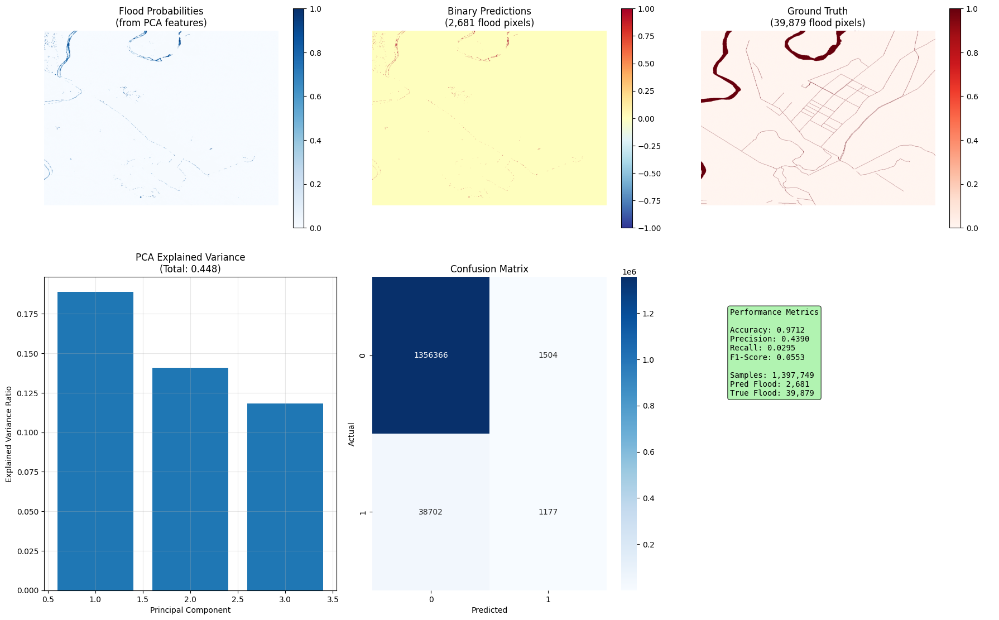

   ✅ Visualization saved: /content/drive/MyDrive/flood_predictions/flood_prediction_results_20250928_152324.png
💾 Saving prediction results...
   ✅ Probabilities: /content/drive/MyDrive/flood_predictions/flood_probabilities_PCA_20250928_152329.tif
   ✅ Binary predictions: /content/drive/MyDrive/flood_predictions/flood_predictions_PCA_20250928_152329.tif

🎉 Pipeline completed successfully!
📊 Results Summary:
   Total valid pixels: 1,397,749
   Flood pixels detected: 2,681
   Flood coverage: 0.19%
   Optimal threshold used: 0.890000
   Accuracy vs ground truth: 0.9712
   F1-Score vs ground truth: 0.0553

📁 Output files:
   Probabilities: /content/drive/MyDrive/flood_predictions/flood_probabilities_PCA_20250928_152329.tif
   Binary predictions: /content/drive/MyDrive/flood_predictions/flood_predictions_PCA_20250928_152329.tif
   Visualization: /content/drive/MyDrive/flood_predictions/flood_prediction_results_20250928_152324.png


In [11]:
import numpy as np
import rasterio
import joblib
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns
from datetime import datetime
import os
from tqdm import tqdm
import gc

def load_and_validate_inputs(embedding_path, model_path, ground_truth_path):
    """Load and validate all input files"""
    print("📖 Loading input files...")

    # Load embedding data
    try:
        with rasterio.open(embedding_path) as src:
            embedding_data = src.read()  # Shape: (bands, height, width)
            embedding_profile = src.profile
        print(f"✅ Embeddings loaded: {embedding_data.shape}")
    except Exception as e:
        raise FileNotFoundError(f"Could not load embedding file: {e}")

    # Load ground truth
    try:
        with rasterio.open(ground_truth_path) as src:
            ground_truth_data = src.read()  # Shape: (1, height, width)
            ground_truth_profile = src.profile
        print(f"✅ Ground truth loaded: {ground_truth_data.shape}")
    except Exception as e:
        raise FileNotFoundError(f"Could not load ground truth file: {e}")

    # Load model and results
    try:
        model = joblib.load(model_path)
        results_path = model_path.replace('_model.joblib', '_results.joblib')
        if os.path.exists(results_path):
            results = joblib.load(results_path)
            optimal_threshold = results.get('optimal_threshold', 0.5)
        else:
            print("⚠️  Results file not found, using default threshold 0.5")
            optimal_threshold = 0.890
        print(f"✅ Model loaded, optimal threshold: {optimal_threshold}")
    except Exception as e:
        raise FileNotFoundError(f"Could not load model: {e}")

    return embedding_data, embedding_profile, ground_truth_data, model, optimal_threshold

def apply_pca_to_embeddings(embedding_data, n_components=3):
    """Apply PCA to reduce 64-dimensional embeddings to n_components"""
    print(f"🔬 Applying PCA: {embedding_data.shape[0]}D -> {n_components}D...")

    bands, height, width = embedding_data.shape
    total_pixels = height * width

    # Reshape to (pixels, bands)
    reshaped_data = embedding_data.reshape(bands, -1).T

    # Handle invalid pixels
    print("   🧹 Filtering valid pixels...")
    valid_mask = (~np.isnan(reshaped_data).any(axis=1) &
                  ~np.isinf(reshaped_data).any(axis=1) &
                  ~np.all(reshaped_data == 0, axis=1))

    valid_data = reshaped_data[valid_mask]
    valid_count = np.sum(valid_mask)

    print(f"   ✅ Valid pixels: {valid_count:,} / {total_pixels:,} ({valid_count/total_pixels*100:.1f}%)")

    if valid_count == 0:
        raise ValueError("No valid pixels found for PCA")

    # Standardize features
    print("   📊 Standardizing features...")
    scaler = StandardScaler()
    scaled_data = scaler.fit_transform(valid_data)

    # Apply PCA
    print(f"   🧮 Fitting PCA with {n_components} components...")
    pca = PCA(n_components=n_components, random_state=42)
    pca_components = pca.fit_transform(scaled_data)

    # Show PCA results
    explained_variance = pca.explained_variance_ratio_
    cumulative_variance = np.cumsum(explained_variance)

    print(f"   ✅ PCA completed!")
    print(f"   📈 Explained variance per component:")
    for i, var in enumerate(explained_variance):
        print(f"      PC{i+1}: {var:.4f} ({var*100:.2f}%)")
    print(f"   📊 Total explained variance: {cumulative_variance[-1]:.4f} ({cumulative_variance[-1]*100:.2f}%)")

    return pca_components, pca, scaler, valid_mask, height, width

def run_flood_predictions(pca_components, model, optimal_threshold, valid_mask, height, width):
    """Run flood predictions on PCA components"""
    print("🎯 Running flood predictions on PCA components...")

    total_pixels = height * width
    valid_count = len(pca_components)

    # Process in chunks to handle memory efficiently
    chunk_size = 50000
    n_chunks = (valid_count + chunk_size - 1) // chunk_size

    print(f"   🧩 Processing {valid_count:,} pixels in {n_chunks} chunks...")

    # Initialize prediction arrays
    flood_probabilities = np.full(total_pixels, np.nan, dtype=np.float32)
    flood_predictions = np.full(total_pixels, -1, dtype=np.int8)

    # Get valid pixel indices
    valid_indices = np.where(valid_mask)[0]

    # Process in chunks
    for i in tqdm(range(n_chunks), desc="   Predicting"):
        start_idx = i * chunk_size
        end_idx = min((i + 1) * chunk_size, valid_count)

        chunk_indices = valid_indices[start_idx:end_idx]
        chunk_data = pca_components[start_idx:end_idx]

        try:
            # Get probabilities
            chunk_probs = model.predict_proba(chunk_data)[:, 1]
            chunk_binary = (chunk_probs >= optimal_threshold).astype(np.int8)

            # Store results
            flood_probabilities[chunk_indices] = chunk_probs
            flood_predictions[chunk_indices] = chunk_binary

        except Exception as e:
            print(f"❌ Error in chunk {i}: {e}")
            continue

        # Memory cleanup
        if i % 10 == 0:
            gc.collect()

    # Reshape to spatial dimensions
    prob_raster = flood_probabilities.reshape(height, width)
    binary_raster = flood_predictions.reshape(height, width)

    return prob_raster, binary_raster, flood_probabilities[valid_indices]

def align_and_evaluate(binary_predictions, ground_truth_data, valid_probabilities, height, width):
    """Align predictions with ground truth and calculate metrics"""
    print("📊 Evaluating predictions against ground truth...")

    # Handle ground truth shape
    if len(ground_truth_data.shape) == 3:
        gt_2d = ground_truth_data[0]  # Take first band
    else:
        gt_2d = ground_truth_data

    # Resize ground truth to match predictions if needed
    if gt_2d.shape != (height, width):
        print(f"   🔧 Resizing ground truth from {gt_2d.shape} to {height}x{width}")
        from sklearn.preprocessing import normalize
        # Simple nearest neighbor resampling
        from scipy.ndimage import zoom
        zoom_factors = (height / gt_2d.shape[0], width / gt_2d.shape[1])
        gt_aligned = zoom(gt_2d, zoom_factors, order=0)  # nearest neighbor
    else:
        gt_aligned = gt_2d

    # Get valid pixels for both predictions and ground truth
    valid_pred_mask = (binary_predictions >= 0)
    valid_gt_mask = ~np.isnan(gt_aligned)
    combined_valid = valid_pred_mask & valid_gt_mask

    pred_flat = binary_predictions[combined_valid]
    gt_flat = gt_aligned[combined_valid].astype(int)

    print(f"   ✅ Valid comparison pixels: {len(pred_flat):,}")

    if len(pred_flat) == 0:
        print("   ⚠️  No valid pixels for comparison")
        return None

    # Calculate metrics
    accuracy = accuracy_score(gt_flat, pred_flat)
    precision = precision_score(gt_flat, pred_flat, zero_division=0)
    recall = recall_score(gt_flat, pred_flat, zero_division=0)
    f1 = f1_score(gt_flat, pred_flat, zero_division=0)

    # Confusion matrix
    cm = confusion_matrix(gt_flat, pred_flat)

    metrics = {
        'accuracy': accuracy,
        'precision': precision,
        'recall': recall,
        'f1_score': f1,
        'confusion_matrix': cm,
        'n_samples': len(pred_flat),
        'flood_pixels_pred': np.sum(pred_flat),
        'flood_pixels_truth': np.sum(gt_flat)
    }

    print(f"   📈 Accuracy: {accuracy:.4f}")
    print(f"   📈 Precision: {precision:.4f}")
    print(f"   📈 Recall: {recall:.4f}")
    print(f"   📈 F1-Score: {f1:.4f}")

    return metrics, gt_aligned

def create_comprehensive_visualizations(prob_raster, binary_raster, gt_aligned, metrics, pca, save_dir):
    """Create comprehensive visualization plots"""
    print("📊 Creating visualizations...")

    try:
        fig, axes = plt.subplots(2, 3, figsize=(18, 12))

        # Plot 1: Probability map
        im1 = axes[0,0].imshow(prob_raster, cmap='Blues', vmin=0, vmax=1)
        axes[0,0].set_title('Flood Probabilities\n(from PCA features)')
        axes[0,0].axis('off')
        plt.colorbar(im1, ax=axes[0,0], shrink=0.7)

        # Plot 2: Binary predictions
        im2 = axes[0,1].imshow(binary_raster, cmap='RdYlBu_r', vmin=-1, vmax=1)
        axes[0,1].set_title(f'Binary Predictions\n({np.sum(binary_raster==1):,} flood pixels)')
        axes[0,1].axis('off')
        plt.colorbar(im2, ax=axes[0,1], shrink=0.7)

        # Plot 3: Ground truth
        if gt_aligned is not None:
            im3 = axes[0,2].imshow(gt_aligned, cmap='Reds', vmin=0, vmax=1)
            axes[0,2].set_title(f'Ground Truth\n({np.sum(gt_aligned==1):,} flood pixels)')
            axes[0,2].axis('off')
            plt.colorbar(im3, ax=axes[0,2], shrink=0.7)
        else:
            axes[0,2].text(0.5, 0.5, 'Ground Truth\nNot Available',
                          ha='center', va='center', transform=axes[0,2].transAxes)
            axes[0,2].set_title('Ground Truth')

        # Plot 4: PCA explained variance
        if pca is not None:
            axes[1,0].bar(range(1, len(pca.explained_variance_ratio_) + 1),
                         pca.explained_variance_ratio_)
            axes[1,0].set_xlabel('Principal Component')
            axes[1,0].set_ylabel('Explained Variance Ratio')
            axes[1,0].set_title(f'PCA Explained Variance\n(Total: {pca.explained_variance_ratio_.sum():.3f})')
            axes[1,0].grid(True, alpha=0.3)

        # Plot 5: Confusion matrix
        if metrics and 'confusion_matrix' in metrics:
            cm = metrics['confusion_matrix']
            sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', ax=axes[1,1])
            axes[1,1].set_xlabel('Predicted')
            axes[1,1].set_ylabel('Actual')
            axes[1,1].set_title('Confusion Matrix')

        # Plot 6: Metrics summary
        if metrics:
            axes[1,2].axis('off')
            metrics_text = f"""
Performance Metrics

Accuracy: {metrics['accuracy']:.4f}
Precision: {metrics['precision']:.4f}
Recall: {metrics['recall']:.4f}
F1-Score: {metrics['f1_score']:.4f}

Samples: {metrics['n_samples']:,}
Pred Flood: {metrics['flood_pixels_pred']:,}
True Flood: {metrics['flood_pixels_truth']:,}
            """
            axes[1,2].text(0.1, 0.9, metrics_text.strip(),
                          transform=axes[1,2].transAxes, fontsize=10,
                          verticalalignment='top', fontfamily='monospace',
                          bbox=dict(boxstyle="round,pad=0.3", facecolor="lightgreen", alpha=0.7))

        plt.tight_layout()

        # Save visualization
        timestamp = datetime.now().strftime("%Y%m%d_%H%M%S")
        plot_output = os.path.join(save_dir, f"flood_prediction_results_{timestamp}.png")
        plt.savefig(plot_output, dpi=300, bbox_inches='tight')
        plt.show()

        print(f"   ✅ Visualization saved: {plot_output}")
        return plot_output

    except Exception as e:
        print(f"   ⚠️  Could not create visualization: {e}")
        return None

def save_prediction_results(prob_raster, binary_raster, embedding_profile, save_dir):
    """Save prediction results as GeoTIFF files"""
    print("💾 Saving prediction results...")

    timestamp = datetime.now().strftime("%Y%m%d_%H%M%S")

    # Save probability raster
    prob_output = os.path.join(save_dir, f"flood_probabilities_PCA_{timestamp}.tif")
    prob_profile = embedding_profile.copy()
    prob_profile.update(dtype=rasterio.float32, count=1, compress='lzw')

    with rasterio.open(prob_output, 'w', **prob_profile) as dst:
        dst.write(prob_raster, 1)
        dst.descriptions = ['Flood Probability']

    # Save binary predictions
    binary_output = os.path.join(save_dir, f"flood_predictions_PCA_{timestamp}.tif")
    binary_profile = embedding_profile.copy()
    binary_profile.update(dtype=rasterio.int8, count=1, compress='lzw', nodata=-1)

    with rasterio.open(binary_output, 'w', **binary_profile) as dst:
        dst.write(binary_raster, 1)
        dst.descriptions = ['Flood Prediction (Binary)']

    print(f"   ✅ Probabilities: {prob_output}")
    print(f"   ✅ Binary predictions: {binary_output}")

    return prob_output, binary_output

def main():
    """Main execution pipeline"""
    # File paths - update these for your data
    embedding_path = "/content/drive/MyDrive/flood_predictions/embedding_2021_exact_bounds.tif"
    model_path = "/content/drive/MyDrive/XGBoost_Flood_Models/Albania_2021_20250927_212646_optimized_xgboost_20250928_011003_model.joblib"
    ground_truth_path = "/content/drive/MyDrive/data/Annual_Flood_Aggregates_Sentinel1_trials_operational/Albania/flood_patches_top/Albania_2021_patch_3_flood.tif"

    save_dir = "/content/drive/MyDrive/flood_predictions"
    os.makedirs(save_dir, exist_ok=True)

    print("🚀 PCA + XGBoost Flood Prediction Pipeline")
    print("=" * 80)

    try:
        # Step 1: Load and validate inputs
        embedding_data, embedding_profile, ground_truth_data, model, optimal_threshold = load_and_validate_inputs(
            embedding_path, model_path, ground_truth_path
        )

        # Step 2: Apply PCA to embeddings
        pca_components, pca_model, scaler, valid_mask, height, width = apply_pca_to_embeddings(
            embedding_data, n_components=3
        )

        # Step 3: Run flood predictions
        prob_raster, binary_raster, valid_probabilities = run_flood_predictions(
            pca_components, model, optimal_threshold, valid_mask, height, width
        )

        # Step 4: Evaluate against ground truth
        evaluation_results = align_and_evaluate(
            binary_raster, ground_truth_data, valid_probabilities, height, width
        )

        if evaluation_results:
            metrics, gt_aligned = evaluation_results
        else:
            metrics, gt_aligned = None, None

        # Step 5: Create visualizations
        plot_path = create_comprehensive_visualizations(
            prob_raster, binary_raster, gt_aligned, metrics, pca_model, save_dir
        )

        # Step 6: Save results
        prob_path, binary_path = save_prediction_results(
            prob_raster, binary_raster, embedding_profile, save_dir
        )

        # Step 7: Final summary
        flood_pixels = np.sum(binary_raster == 1)
        total_valid_pixels = np.sum(binary_raster >= 0)
        flood_percentage = (flood_pixels / total_valid_pixels) * 100

        print("\n🎉 Pipeline completed successfully!")
        print("=" * 60)
        print(f"📊 Results Summary:")
        print(f"   Total valid pixels: {total_valid_pixels:,}")
        print(f"   Flood pixels detected: {flood_pixels:,}")
        print(f"   Flood coverage: {flood_percentage:.2f}%")
        print(f"   Optimal threshold used: {optimal_threshold:.6f}")

        if metrics:
            print(f"   Accuracy vs ground truth: {metrics['accuracy']:.4f}")
            print(f"   F1-Score vs ground truth: {metrics['f1_score']:.4f}")

        print(f"\n📁 Output files:")
        print(f"   Probabilities: {prob_path}")
        print(f"   Binary predictions: {binary_path}")
        if plot_path:
            print(f"   Visualization: {plot_path}")

        return True

    except Exception as e:
        print(f"❌ Error in pipeline: {e}")
        import traceback
        traceback.print_exc()
        return False

if __name__ == "__main__":
    success = main()

🚀 Starting PCA + Flood Prediction Pipeline
🔬 PCA + XGBoost Flood Prediction Pipeline
🤖 Loading model...
✅ Model loaded, optimal threshold: 0.89

📖 Loading embedding raster...
   📏 Dimensions: 1369 x 1021
   🎯 Bands: 64
   🗺️  CRS: EPSG:4326
   💾 Data shape: (64, 1021, 1369)
   📊 Total pixels: 1,397,749

🔄 Preparing data for PCA...
   🧹 Handling invalid pixels...
   ✅ Valid pixels: 1,397,749 / 1,397,749 (100.0%)

🔬 Applying PCA (n_components=3)...
   📊 Standardizing features...
   🧮 Fitting PCA...
   ✅ PCA completed!
   📈 Explained variance per component:
      PC1: 0.1889 (18.89%)
      PC2: 0.1408 (14.08%)
      PC3: 0.1182 (11.82%)
   📊 Cumulative explained variance: 0.4480 (44.80%)
   📋 PCA component statistics:
      PC1: Min=-9.1430, Max=6.9620, Mean=0.0000, Std=3.4772
      PC2: Min=-9.2762, Max=7.3421, Mean=-0.0000, Std=3.0023
      PC3: Min=-7.8756, Max=8.3966, Mean=-0.0000, Std=2.7503

🗺️  Creating PCA raster...
💾 Saving PCA raster...
   ✅ Saved: /content/drive/MyDrive/EE_Floo

Predicting: 100%|██████████| 28/28 [00:07<00:00,  3.79it/s]



📊 Calculating prediction statistics...
   🌊 Flood pixels: 2,681 (0.19%)
   🏞️  No flood pixels: 1,395,068
   📈 Probability range: 0.000000 - 0.998132
   📊 Mean probability: 0.005444
   📊 Pixels > 0.1: 9,507
   📊 Pixels > 0.5: 6,809
   📊 Pixels > 0.89: 2,681

💾 Saving prediction results...
   ✅ Probabilities: /content/drive/MyDrive/EE_Flood_Analysis/embedding_2021_patch_3_exact_PCA_flood_probabilities_20250928_015903.tif
   ✅ Binary predictions: /content/drive/MyDrive/EE_Flood_Analysis/embedding_2021_patch_3_exact_PCA_flood_predictions_20250928_015903.tif
   ✅ Statistics: /content/drive/MyDrive/EE_Flood_Analysis/embedding_2021_patch_3_exact_PCA_prediction_stats_20250928_015903.txt

✅ PCA + Prediction pipeline completed successfully!
📊 Creating result visualization...


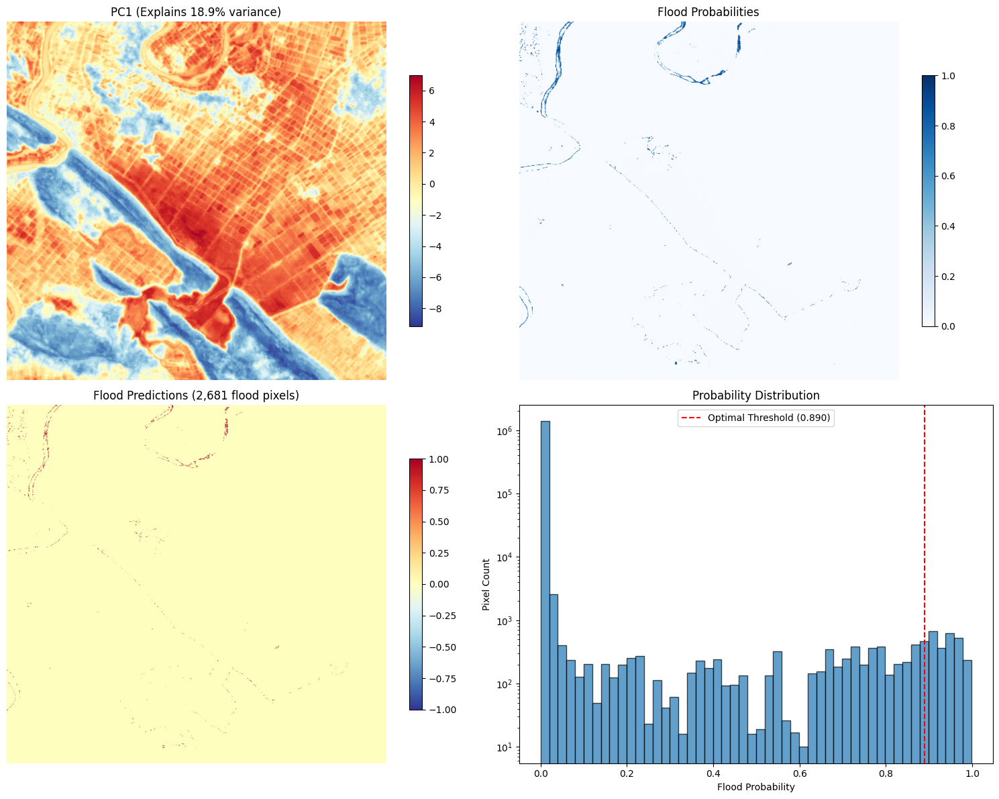

   ✅ Visualization: /content/drive/MyDrive/EE_Flood_Analysis/embedding_2021_patch_3_exact_PCA_flood_results_20250928_015903.png

🎉 Pipeline completed successfully!
🔬 PCA raster saved: /content/drive/MyDrive/EE_Flood_Analysis/embedding_2021_patch_3_exact_PCA_3components_20250928_015855.tif
🌊 Flood predictions: /content/drive/MyDrive/EE_Flood_Analysis/embedding_2021_patch_3_exact_PCA_flood_predictions_20250928_015903.tif
📊 2,681 flood pixels detected
📈 0.19% flood coverage


In [ ]:
import numpy as np
import rasterio
import joblib
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
from datetime import datetime
import os
from tqdm import tqdm
import matplotlib.pyplot as plt
import gc

def apply_pca_and_predict(embedding_path, model_path, n_components=3, save_pca_raster=True):
    """
    Apply PCA to 64-band embedding file and run flood predictions on PC components

    Parameters:
    - embedding_path: Path to 64-band embedding .tif file
    - model_path: Path to trained XGBoost model
    - n_components: Number of PC components to extract (default: 3)
    - save_pca_raster: Whether to save the PCA components as separate raster
    """

    print("🔬 PCA + XGBoost Flood Prediction Pipeline")
    print("=" * 60)

    # Load model info
    print("🤖 Loading model...")
    model = joblib.load(model_path)
    results_path = model_path.replace('_model.joblib', '_results.joblib')
    results = joblib.load(results_path)
    optimal_threshold = results['optimal_threshold']
    print(f"✅ Model loaded, optimal threshold: {optimal_threshold}")

    # Load embedding raster
    print(f"\n📖 Loading embedding raster...")
    with rasterio.open(embedding_path) as src:
        print(f"   📏 Dimensions: {src.width} x {src.height}")
        print(f"   🎯 Bands: {src.count}")
        print(f"   🗺️  CRS: {src.crs}")

        # Read all bands
        embedding_data = src.read()  # Shape: (bands, height, width)
        profile = src.profile
        bands, height, width = embedding_data.shape
        total_pixels = height * width

        print(f"   💾 Data shape: {embedding_data.shape}")
        print(f"   📊 Total pixels: {total_pixels:,}")

    # Reshape for PCA: (pixels, bands)
    print(f"\n🔄 Preparing data for PCA...")
    reshaped_data = embedding_data.reshape(bands, -1).T  # Shape: (pixels, bands)

    # Handle invalid pixels
    print("   🧹 Handling invalid pixels...")
    valid_mask = ~np.isnan(reshaped_data).any(axis=1) & ~np.isinf(reshaped_data).any(axis=1)
    valid_data = reshaped_data[valid_mask]
    valid_count = np.sum(valid_mask)

    print(f"   ✅ Valid pixels: {valid_count:,} / {total_pixels:,} ({valid_count/total_pixels*100:.1f}%)")

    if valid_count == 0:
        print("❌ No valid pixels found!")
        return

    # Apply PCA
    print(f"\n🔬 Applying PCA (n_components={n_components})...")

    # Standardize the data first (important for PCA)
    print("   📊 Standardizing features...")
    scaler = StandardScaler()
    scaled_data = scaler.fit_transform(valid_data)

    # Fit PCA
    print("   🧮 Fitting PCA...")
    pca = PCA(n_components=n_components)
    pca_components = pca.fit_transform(scaled_data)

    # Show PCA results
    explained_variance = pca.explained_variance_ratio_
    cumulative_variance = np.cumsum(explained_variance)

    print(f"   ✅ PCA completed!")
    print(f"   📈 Explained variance per component:")
    for i, var in enumerate(explained_variance):
        print(f"      PC{i+1}: {var:.4f} ({var*100:.2f}%)")
    print(f"   📊 Cumulative explained variance: {cumulative_variance[-1]:.4f} ({cumulative_variance[-1]*100:.2f}%)")

    # Show PCA component statistics
    print(f"   📋 PCA component statistics:")
    for i in range(n_components):
        pc_data = pca_components[:, i]
        print(f"      PC{i+1}: Min={pc_data.min():.4f}, Max={pc_data.max():.4f}, "
              f"Mean={pc_data.mean():.4f}, Std={pc_data.std():.4f}")

    # Create full PCA raster (with NaN for invalid pixels)
    print(f"\n🗺️  Creating PCA raster...")
    pca_raster = np.full((n_components, total_pixels), np.nan, dtype=np.float32)

    # Fill valid pixels with PCA components
    valid_indices = np.where(valid_mask)[0]
    for i in range(n_components):
        pca_raster[i, valid_indices] = pca_components[:, i]

    # Reshape back to (components, height, width)
    pca_raster = pca_raster.reshape(n_components, height, width)

    # Save PCA raster if requested
    if save_pca_raster:
        timestamp = datetime.now().strftime("%Y%m%d_%H%M%S")
        base_name = os.path.splitext(os.path.basename(embedding_path))[0]
        output_dir = os.path.dirname(embedding_path)
        pca_output = os.path.join(output_dir, f"{base_name}_PCA_{n_components}components_{timestamp}.tif")

        print(f"💾 Saving PCA raster...")
        pca_profile = profile.copy()
        pca_profile.update(dtype=rasterio.float32, count=n_components, compress='lzw')

        with rasterio.open(pca_output, 'w', **pca_profile) as dst:
            for i in range(n_components):
                dst.write(pca_raster[i], i+1)
                dst.set_band_description(i+1, f'PC{i+1}')

        print(f"   ✅ Saved: {pca_output}")

    # Now run flood predictions on PCA components
    print(f"\n🎯 Running flood predictions on PCA components...")

    # Prepare PCA data for prediction
    pca_data_for_prediction = pca_components  # Shape: (valid_pixels, n_components)

    # Run predictions in chunks
    chunk_size = 50000
    n_chunks = (valid_count + chunk_size - 1) // chunk_size

    print(f"   🧩 Processing {valid_count:,} pixels in {n_chunks} chunks...")

    # Initialize prediction arrays
    flood_probabilities = np.full(total_pixels, np.nan, dtype=np.float32)
    flood_predictions = np.full(total_pixels, -1, dtype=np.int8)

    # Process in chunks
    for i in tqdm(range(n_chunks), desc="Predicting"):
        start_idx = i * chunk_size
        end_idx = min((i + 1) * chunk_size, valid_count)

        chunk_indices = valid_indices[start_idx:end_idx]
        chunk_data = pca_data_for_prediction[start_idx:end_idx]

        try:
            # Get probabilities
            chunk_probs = model.predict_proba(chunk_data)[:, 1]
            chunk_binary = (chunk_probs >= optimal_threshold).astype(np.int8)

            # Store results
            flood_probabilities[chunk_indices] = chunk_probs
            flood_predictions[chunk_indices] = chunk_binary

        except Exception as e:
            print(f"❌ Error in chunk {i}: {e}")
            continue

        # Memory cleanup
        if i % 10 == 0:
            gc.collect()

    # Calculate statistics
    print(f"\n📊 Calculating prediction statistics...")
    valid_probs = flood_probabilities[valid_indices]
    valid_binary = flood_predictions[valid_indices]

    flood_pixels = np.sum(valid_binary == 1)
    no_flood_pixels = np.sum(valid_binary == 0)
    flood_percentage = (flood_pixels / valid_count) * 100

    stats = {
        'total_pixels': total_pixels,
        'valid_pixels': valid_count,
        'flood_pixels': int(flood_pixels),
        'no_flood_pixels': int(no_flood_pixels),
        'flood_percentage': flood_percentage,
        'prob_min': float(np.min(valid_probs)),
        'prob_max': float(np.max(valid_probs)),
        'prob_mean': float(np.mean(valid_probs)),
        'optimal_threshold': optimal_threshold,
        'explained_variance': explained_variance.tolist(),
        'cumulative_variance': cumulative_variance.tolist()
    }

    print(f"   🌊 Flood pixels: {flood_pixels:,} ({flood_percentage:.2f}%)")
    print(f"   🏞️  No flood pixels: {no_flood_pixels:,}")
    print(f"   📈 Probability range: {stats['prob_min']:.6f} - {stats['prob_max']:.6f}")
    print(f"   📊 Mean probability: {stats['prob_mean']:.6f}")
    print(f"   📊 Pixels > 0.1: {np.sum(valid_probs > 0.1):,}")
    print(f"   📊 Pixels > 0.5: {np.sum(valid_probs > 0.5):,}")
    print(f"   📊 Pixels > {optimal_threshold}: {np.sum(valid_probs > optimal_threshold):,}")

    # Save prediction results
    print(f"\n💾 Saving prediction results...")

    # Create output filenames
    timestamp = datetime.now().strftime("%Y%m%d_%H%M%S")
    base_name = os.path.splitext(os.path.basename(embedding_path))[0]
    output_dir = os.path.dirname(embedding_path)

    prob_output = os.path.join(output_dir, f"{base_name}_PCA_flood_probabilities_{timestamp}.tif")
    binary_output = os.path.join(output_dir, f"{base_name}_PCA_flood_predictions_{timestamp}.tif")
    stats_output = os.path.join(output_dir, f"{base_name}_PCA_prediction_stats_{timestamp}.txt")

    # Reshape results back to raster format
    prob_raster_final = flood_probabilities.reshape(height, width)
    binary_raster_final = flood_predictions.reshape(height, width)

    # Save probability raster
    prob_profile = profile.copy()
    prob_profile.update(dtype=rasterio.float32, count=1, compress='lzw')
    with rasterio.open(prob_output, 'w', **prob_profile) as dst:
        dst.write(prob_raster_final, 1)

    # Save binary prediction raster
    binary_profile = profile.copy()
    binary_profile.update(dtype=rasterio.int8, count=1, compress='lzw', nodata=-1)
    with rasterio.open(binary_output, 'w', **binary_profile) as dst:
        dst.write(binary_raster_final, 1)

    # Save statistics
    with open(stats_output, 'w') as f:
        f.write("PCA + XGBoost Flood Prediction Results\n")
        f.write("=" * 50 + "\n\n")
        f.write(f"Input embedding: {embedding_path}\n")
        f.write(f"Model: {model_path}\n")
        f.write(f"PCA components: {n_components}\n")
        f.write(f"Optimal threshold: {optimal_threshold}\n\n")

        f.write("PCA Results:\n")
        f.write("-" * 20 + "\n")
        for i, var in enumerate(explained_variance):
            f.write(f"PC{i+1} explained variance: {var:.6f} ({var*100:.2f}%)\n")
        f.write(f"Total explained variance: {cumulative_variance[-1]:.6f} ({cumulative_variance[-1]*100:.2f}%)\n\n")

        f.write("Prediction Statistics:\n")
        f.write("-" * 25 + "\n")
        for key, value in stats.items():
            if key not in ['explained_variance', 'cumulative_variance']:
                f.write(f"{key}: {value}\n")

    print(f"   ✅ Probabilities: {prob_output}")
    print(f"   ✅ Binary predictions: {binary_output}")
    print(f"   ✅ Statistics: {stats_output}")

    print(f"\n✅ PCA + Prediction pipeline completed successfully!")
    print("=" * 60)

    # Create visualization of results
    print(f"📊 Creating result visualization...")
    try:
        fig, axes = plt.subplots(2, 2, figsize=(15, 12))

        # Plot 1: First PC component
        im1 = axes[0,0].imshow(pca_raster[0], cmap='RdYlBu_r', aspect='auto')
        axes[0,0].set_title(f'PC1 (Explains {explained_variance[0]*100:.1f}% variance)')
        axes[0,0].axis('off')
        plt.colorbar(im1, ax=axes[0,0], shrink=0.7)

        # Plot 2: Flood probabilities
        im2 = axes[0,1].imshow(prob_raster_final, cmap='Blues', vmin=0, vmax=1, aspect='auto')
        axes[0,1].set_title('Flood Probabilities')
        axes[0,1].axis('off')
        plt.colorbar(im2, ax=axes[0,1], shrink=0.7)

        # Plot 3: Binary predictions
        im3 = axes[1,0].imshow(binary_raster_final, cmap='RdYlBu_r', vmin=-1, vmax=1, aspect='auto')
        axes[1,0].set_title(f'Flood Predictions ({flood_pixels:,} flood pixels)')
        axes[1,0].axis('off')
        plt.colorbar(im3, ax=axes[1,0], shrink=0.7)

        # Plot 4: Probability histogram
        axes[1,1].hist(valid_probs[valid_probs > 0], bins=50, alpha=0.7, edgecolor='black')
        axes[1,1].axvline(optimal_threshold, color='red', linestyle='--',
                         label=f'Optimal Threshold ({optimal_threshold:.3f})')
        axes[1,1].set_xlabel('Flood Probability')
        axes[1,1].set_ylabel('Pixel Count')
        axes[1,1].set_title('Probability Distribution')
        axes[1,1].legend()
        axes[1,1].set_yscale('log')

        plt.tight_layout()

        # Save plot
        plot_output = os.path.join(output_dir, f"{base_name}_PCA_flood_results_{timestamp}.png")
        plt.savefig(plot_output, dpi=300, bbox_inches='tight')
        plt.show()
        print(f"   ✅ Visualization: {plot_output}")

    except Exception as e:
        print(f"   ⚠️ Could not create visualization: {e}")

    return {
        'pca_raster_path': pca_output if save_pca_raster else None,
        'probability_raster': prob_output,
        'binary_raster': binary_output,
        'statistics': stats,
        'pca_object': pca,
        'scaler_object': scaler
    }

# Run the complete pipeline
if __name__ == "__main__":
    embedding_path = "/content/drive/MyDrive/EE_Flood_Analysis/embedding_2021_patch_3_exact.tif"
    model_path = "/content/drive/MyDrive/XGBoost_Flood_Models/Albania_2021_20250927_212646_optimized_xgboost_20250928_011003_model.joblib"

    print("🚀 Starting PCA + Flood Prediction Pipeline")
    print("=" * 80)

    results = apply_pca_and_predict(
        embedding_path=embedding_path,
        model_path=model_path,
        n_components=3,
        save_pca_raster=True
    )

    if results:
        print(f"\n🎉 Pipeline completed successfully!")
        print(f"🔬 PCA raster saved: {results['pca_raster_path']}")
        print(f"🌊 Flood predictions: {results['binary_raster']}")
        print(f"📊 {results['statistics']['flood_pixels']:,} flood pixels detected")
        print(f"📈 {results['statistics']['flood_percentage']:.2f}% flood coverage")

🚀 Starting comprehensive flood analysis...
📊 Comparing ground truth vs predictions...
   Ground truth: Albania_2021_patch_3_flood.tif
   Predictions: embedding_2021_patch_3_exact_PCA_flood_predictions_20250928_015903.tif
   Probabilities: embedding_2021_patch_3_exact_PCA_flood_probabilities_20250928_015903.tif
   PCA components: embedding_2021_patch_3_exact_PCA_3components_20250928_015855.tif
📊 Comprehensive Flood Prediction Analysis
📖 Loading ground truth flood data (reference)...
   Ground truth shape: (1000, 1000)
   Ground truth bounds: BoundingBox(left=364850.0, bottom=4640670.0, right=374850.0, top=4650670.0)
   Ground truth CRS: EPSG:32634
   Ground truth unique values: [0 1]
📖 Loading and aligning prediction data...
   🔄 Aligning data: (1021, 1369) -> (1000, 1000)
   ✅ Alignment complete: (1000, 1000)
   Aligned predictions shape: (1000, 1000)
   Prediction unique values: [0 1]
📖 Loading and aligning probability data...
   🔄 Aligning data: (1021, 1369) -> (1000, 1000)
   ✅ Alig

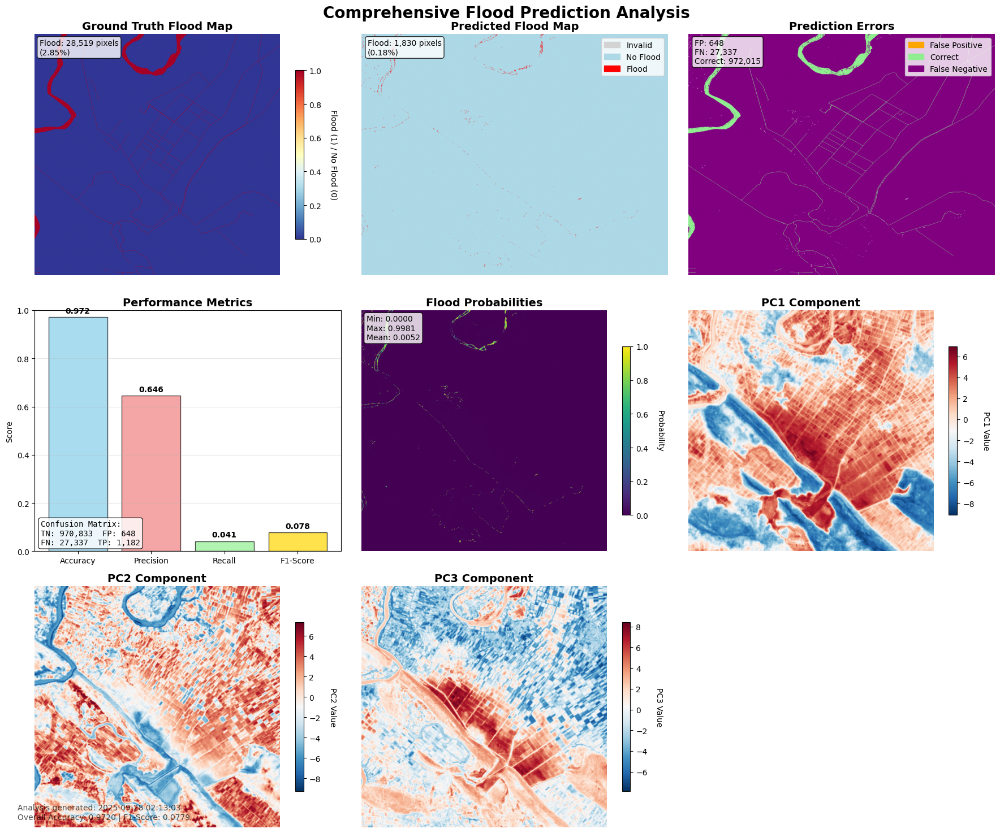

📊 Creating probability distribution analysis...
✅ Probability analysis saved: /content/drive/MyDrive/EE_Flood_Analysis/probability_analysis_20250928_021304.png


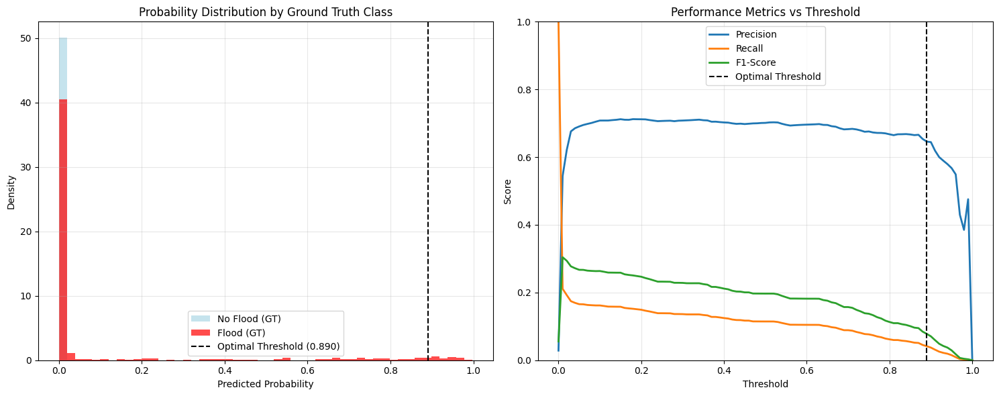


🎯 ANALYSIS SUMMARY:
   📊 Accuracy: 0.9720
   🎯 Precision: 0.6459
   📈 Recall: 0.0414
   ⭐ F1-Score: 0.0779
   📁 Analysis saved: /content/drive/MyDrive/EE_Flood_Analysis/comprehensive_flood_analysis_20250928_021304.png

🎉 COMPREHENSIVE FLOOD ANALYSIS COMPLETE!


In [ ]:
import numpy as np
import rasterio
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib.colors import ListedColormap, BoundaryNorm
from sklearn.metrics import confusion_matrix, classification_report, accuracy_score, f1_score, precision_score, recall_score
import matplotlib.patches as mpatches
from datetime import datetime
import os

def align_raster_data(reference_path, target_path, target_data=None):
    """
    Align target raster data to match reference raster exactly using rasterio reproject
    """
    from rasterio.warp import reproject, Resampling
    from rasterio.transform import from_bounds

    # Load reference raster info
    with rasterio.open(reference_path) as ref_src:
        ref_profile = ref_src.profile.copy()
        ref_bounds = ref_src.bounds
        ref_transform = ref_src.transform
        ref_crs = ref_src.crs
        ref_shape = (ref_src.height, ref_src.width)

    # If target_data is provided, use it; otherwise load from target_path
    if target_data is None:
        with rasterio.open(target_path) as target_src:
            target_data = target_src.read()
            target_profile = target_src.profile.copy()
            target_crs = target_src.crs
            target_transform = target_src.transform
    else:
        # Assume target_data is already loaded and we need profile info
        with rasterio.open(target_path) as target_src:
            target_profile = target_src.profile.copy()
            target_crs = target_src.crs
            target_transform = target_src.transform

    # Check if alignment is needed
    if target_data.shape[-2:] == ref_shape and target_crs == ref_crs:
        print(f"   ✅ Data already aligned: {target_data.shape[-2:]} = {ref_shape}")
        return target_data

    print(f"   🔄 Aligning data: {target_data.shape[-2:]} -> {ref_shape}")

    # Prepare output array
    if len(target_data.shape) == 2:
        # Single band
        aligned_data = np.empty(ref_shape, dtype=target_data.dtype)
        reproject(
            target_data,
            aligned_data,
            src_transform=target_transform,
            src_crs=target_crs,
            dst_transform=ref_transform,
            dst_crs=ref_crs,
            resampling=Resampling.nearest
        )
    else:
        # Multiple bands
        aligned_data = np.empty((target_data.shape[0],) + ref_shape, dtype=target_data.dtype)
        for band in range(target_data.shape[0]):
            reproject(
                target_data[band],
                aligned_data[band],
                src_transform=target_transform,
                src_crs=target_crs,
                dst_transform=ref_transform,
                dst_crs=ref_crs,
                resampling=Resampling.nearest
            )

    print(f"   ✅ Alignment complete: {aligned_data.shape[-2:]}")
    return aligned_data

def comprehensive_flood_analysis(ground_truth_path, prediction_path, probability_path=None,
                                pca_path=None, output_dir=None):
    """
    Create comprehensive analysis comparing ground truth flood data with predictions
    Handles automatic spatial alignment of different-sized rasters

    Parameters:
    - ground_truth_path: Path to original flood .tif file
    - prediction_path: Path to binary flood predictions
    - probability_path: Path to flood probabilities (optional)
    - pca_path: Path to PCA components (optional)
    - output_dir: Directory to save analysis plots
    """

    print("📊 Comprehensive Flood Prediction Analysis")
    print("=" * 60)

    # Set output directory
    if output_dir is None:
        output_dir = os.path.dirname(prediction_path)

    # Load ground truth data (this will be our reference)
    print("📖 Loading ground truth flood data (reference)...")
    with rasterio.open(ground_truth_path) as src:
        ground_truth = src.read(1)
        gt_profile = src.profile
        gt_bounds = src.bounds
        gt_transform = src.transform
        gt_crs = src.crs
        print(f"   Ground truth shape: {ground_truth.shape}")
        print(f"   Ground truth bounds: {gt_bounds}")
        print(f"   Ground truth CRS: {gt_crs}")
        print(f"   Ground truth unique values: {np.unique(ground_truth)}")

    # Load and align prediction data to ground truth
    print("📖 Loading and aligning prediction data...")
    predictions = align_raster_data(ground_truth_path, prediction_path)
    if len(predictions.shape) > 2:
        predictions = predictions[0]  # Take first band if multiple
    print(f"   Aligned predictions shape: {predictions.shape}")
    print(f"   Prediction unique values: {np.unique(predictions)}")

    # Load and align probability data if available
    probabilities = None
    if probability_path and os.path.exists(probability_path):
        print("📖 Loading and aligning probability data...")
        probabilities = align_raster_data(ground_truth_path, probability_path)
        if len(probabilities.shape) > 2:
            probabilities = probabilities[0]  # Take first band if multiple
        print(f"   Aligned probabilities shape: {probabilities.shape}")
        print(f"   Probability range: {np.nanmin(probabilities):.6f} - {np.nanmax(probabilities):.6f}")

    # Load and align PCA data if available
    pca_components = None
    if pca_path and os.path.exists(pca_path):
        print("📖 Loading and aligning PCA component data...")
        pca_components = align_raster_data(ground_truth_path, pca_path)
        print(f"   Aligned PCA shape: {pca_components.shape}")

    # Verify shapes now match
    print(f"\n🔍 Final shape verification:")
    print(f"   Ground truth: {ground_truth.shape}")
    print(f"   Predictions: {predictions.shape}")
    if probabilities is not None:
        print(f"   Probabilities: {probabilities.shape}")
    if pca_components is not None:
        print(f"   PCA: {pca_components.shape}")

    # Ensure all shapes match
    if predictions.shape != ground_truth.shape:
        raise ValueError(f"Shape mismatch after alignment: GT {ground_truth.shape} vs Pred {predictions.shape}")

    # Create masks for valid data
    valid_gt_mask = (ground_truth >= 0) & (ground_truth <= 1) & (~np.isnan(ground_truth))
    valid_pred_mask = (predictions >= -1) & (predictions <= 1) & (~np.isnan(predictions))
    valid_mask = valid_gt_mask & valid_pred_mask

    # Convert prediction values: -1 (invalid) -> NaN, keep 0 and 1
    predictions_clean = predictions.copy().astype(float)
    predictions_clean[predictions_clean == -1] = np.nan

    print(f"📊 Data summary:")
    print(f"   Valid pixels: {np.sum(valid_mask):,}")
    print(f"   Ground truth flood pixels: {np.sum(ground_truth[valid_mask] == 1):,}")
    print(f"   Predicted flood pixels: {np.sum(predictions_clean[valid_mask] == 1):,}")

    # Calculate performance metrics
    if np.sum(valid_mask) > 0:
        gt_valid = ground_truth[valid_mask]
        pred_valid = predictions_clean[valid_mask]

        # Remove any remaining NaN values
        final_mask = ~np.isnan(pred_valid)
        gt_final = gt_valid[final_mask]
        pred_final = pred_valid[final_mask]

        if len(gt_final) > 0 and len(pred_final) > 0:
            accuracy = accuracy_score(gt_final, pred_final)
            precision = precision_score(gt_final, pred_final, zero_division=0)
            recall = recall_score(gt_final, pred_final, zero_division=0)
            f1 = f1_score(gt_final, pred_final, zero_division=0)

            print(f"\n🎯 Performance Metrics:")
            print(f"   Accuracy:  {accuracy:.4f}")
            print(f"   Precision: {precision:.4f}")
            print(f"   Recall:    {recall:.4f}")
            print(f"   F1-Score:  {f1:.4f}")

            # Confusion matrix
            cm = confusion_matrix(gt_final, pred_final)
            print(f"\n📋 Confusion Matrix:")
            print(f"   True Negatives:  {cm[0,0]:,}")
            print(f"   False Positives: {cm[0,1]:,}")
            print(f"   False Negatives: {cm[1,0]:,}")
            print(f"   True Positives:  {cm[1,1]:,}")

    # Create comprehensive visualization
    print(f"\n🎨 Creating comprehensive visualization...")

    # Determine subplot layout
    n_plots = 4  # Base plots
    if probabilities is not None:
        n_plots += 1
    if pca_components is not None:
        n_plots += min(3, pca_components.shape[0])  # Up to 3 PC components

    # Calculate grid size
    if n_plots <= 4:
        nrows, ncols = 2, 2
    elif n_plots <= 6:
        nrows, ncols = 2, 3
    elif n_plots <= 9:
        nrows, ncols = 3, 3
    else:
        nrows, ncols = 4, 3

    fig, axes = plt.subplots(nrows, ncols, figsize=(6*ncols, 5*nrows))
    if nrows * ncols == 1:
        axes = [axes]
    else:
        axes = axes.flatten()

    plot_idx = 0

    # Plot 1: Ground Truth
    im1 = axes[plot_idx].imshow(ground_truth, cmap='RdYlBu_r', vmin=0, vmax=1, aspect='auto')
    axes[plot_idx].set_title('Ground Truth Flood Map', fontsize=14, fontweight='bold')
    axes[plot_idx].axis('off')
    cbar1 = plt.colorbar(im1, ax=axes[plot_idx], shrink=0.7)
    cbar1.set_label('Flood (1) / No Flood (0)', rotation=270, labelpad=20)

    # Add ground truth statistics
    gt_flood_pixels = np.sum(ground_truth == 1)
    gt_total_pixels = np.sum(valid_gt_mask)
    gt_flood_pct = (gt_flood_pixels / gt_total_pixels) * 100 if gt_total_pixels > 0 else 0
    axes[plot_idx].text(0.02, 0.98, f'Flood: {gt_flood_pixels:,} pixels\n({gt_flood_pct:.2f}%)',
                       transform=axes[plot_idx].transAxes, verticalalignment='top',
                       bbox=dict(boxstyle='round', facecolor='white', alpha=0.8))
    plot_idx += 1

    # Plot 2: Predictions
    pred_display = predictions_clean.copy()
    pred_cmap = ListedColormap(['lightgray', 'lightblue', 'red'])
    pred_bounds = [-0.5, 0.5, 1.5, 2.5]
    pred_norm = BoundaryNorm(pred_bounds, pred_cmap.N)

    # Create display array: NaN->0, No Flood->1, Flood->2
    pred_display_categorical = np.full_like(pred_display, 0, dtype=int)
    pred_display_categorical[pred_display == 0] = 1
    pred_display_categorical[pred_display == 1] = 2

    im2 = axes[plot_idx].imshow(pred_display_categorical, cmap=pred_cmap, norm=pred_norm, aspect='auto')
    axes[plot_idx].set_title('Predicted Flood Map', fontsize=14, fontweight='bold')
    axes[plot_idx].axis('off')

    # Create custom legend
    legend_elements = [mpatches.Patch(color='lightgray', label='Invalid'),
                      mpatches.Patch(color='lightblue', label='No Flood'),
                      mpatches.Patch(color='red', label='Flood')]
    axes[plot_idx].legend(handles=legend_elements, loc='upper right')

    # Add prediction statistics
    pred_flood_pixels = np.sum(predictions_clean == 1)
    pred_valid_pixels = np.sum(~np.isnan(predictions_clean))
    pred_flood_pct = (pred_flood_pixels / pred_valid_pixels) * 100 if pred_valid_pixels > 0 else 0
    axes[plot_idx].text(0.02, 0.98, f'Flood: {pred_flood_pixels:,} pixels\n({pred_flood_pct:.2f}%)',
                       transform=axes[plot_idx].transAxes, verticalalignment='top',
                       bbox=dict(boxstyle='round', facecolor='white', alpha=0.8))
    plot_idx += 1

    # Plot 3: Difference Map (Errors)
    if np.sum(valid_mask) > 0:
        difference = np.full_like(ground_truth, np.nan, dtype=float)
        difference[valid_mask] = predictions_clean[valid_mask] - ground_truth[valid_mask]

        # Create categorical difference: -1 (False Positive), 0 (Correct), 1 (False Negative)
        diff_cmap = ListedColormap(['orange', 'lightgreen', 'purple', 'white'])
        diff_bounds = [-1.5, -0.5, 0.5, 1.5, 2.5]
        diff_norm = BoundaryNorm(diff_bounds, diff_cmap.N)

        diff_display = np.full_like(difference, 3, dtype=int)  # Default to white (invalid)
        diff_display[difference == -1] = 0  # False Positive (orange)
        diff_display[difference == 0] = 1   # Correct (green)
        diff_display[difference == 1] = 2   # False Negative (purple)

        im3 = axes[plot_idx].imshow(diff_display, cmap=diff_cmap, norm=diff_norm, aspect='auto')
        axes[plot_idx].set_title('Prediction Errors', fontsize=14, fontweight='bold')
        axes[plot_idx].axis('off')

        # Create legend
        legend_elements = [mpatches.Patch(color='orange', label='False Positive'),
                          mpatches.Patch(color='lightgreen', label='Correct'),
                          mpatches.Patch(color='purple', label='False Negative')]
        axes[plot_idx].legend(handles=legend_elements, loc='upper right')

        # Add error statistics
        if len(gt_final) > 0:
            false_positives = cm[0,1] if 'cm' in locals() else 0
            false_negatives = cm[1,0] if 'cm' in locals() else 0
            correct = cm[0,0] + cm[1,1] if 'cm' in locals() else 0

            axes[plot_idx].text(0.02, 0.98, f'FP: {false_positives:,}\nFN: {false_negatives:,}\nCorrect: {correct:,}',
                               transform=axes[plot_idx].transAxes, verticalalignment='top',
                               bbox=dict(boxstyle='round', facecolor='white', alpha=0.8))
    else:
        axes[plot_idx].text(0.5, 0.5, 'No valid comparison data',
                           transform=axes[plot_idx].transAxes, ha='center', va='center')
        axes[plot_idx].set_title('Prediction Errors', fontsize=14, fontweight='bold')
        axes[plot_idx].axis('off')

    plot_idx += 1

    # Plot 4: Performance Summary
    if len(gt_final) > 0:
        # Create performance summary plot
        metrics = ['Accuracy', 'Precision', 'Recall', 'F1-Score']
        values = [accuracy, precision, recall, f1]
        colors = ['skyblue', 'lightcoral', 'lightgreen', 'gold']

        bars = axes[plot_idx].bar(metrics, values, color=colors, alpha=0.7, edgecolor='black')
        axes[plot_idx].set_ylim(0, 1)
        axes[plot_idx].set_ylabel('Score')
        axes[plot_idx].set_title('Performance Metrics', fontsize=14, fontweight='bold')
        axes[plot_idx].grid(axis='y', alpha=0.3)

        # Add value labels on bars
        for bar, value in zip(bars, values):
            axes[plot_idx].text(bar.get_x() + bar.get_width()/2, bar.get_height() + 0.01,
                               f'{value:.3f}', ha='center', va='bottom', fontweight='bold')

        # Add confusion matrix as text
        cm_text = f'Confusion Matrix:\nTN: {cm[0,0]:,}  FP: {cm[0,1]:,}\nFN: {cm[1,0]:,}  TP: {cm[1,1]:,}'
        axes[plot_idx].text(0.02, 0.02, cm_text, transform=axes[plot_idx].transAxes,
                           verticalalignment='bottom', fontfamily='monospace',
                           bbox=dict(boxstyle='round', facecolor='white', alpha=0.8))
    else:
        axes[plot_idx].text(0.5, 0.5, 'No valid metrics available',
                           transform=axes[plot_idx].transAxes, ha='center', va='center')
        axes[plot_idx].set_title('Performance Metrics', fontsize=14, fontweight='bold')

    plot_idx += 1

    # Plot 5: Probabilities (if available)
    if probabilities is not None and plot_idx < len(axes):
        prob_display = probabilities.copy()
        prob_display[np.isnan(prob_display)] = 0

        im5 = axes[plot_idx].imshow(prob_display, cmap='viridis', vmin=0, vmax=1, aspect='auto')
        axes[plot_idx].set_title('Flood Probabilities', fontsize=14, fontweight='bold')
        axes[plot_idx].axis('off')
        cbar5 = plt.colorbar(im5, ax=axes[plot_idx], shrink=0.7)
        cbar5.set_label('Probability', rotation=270, labelpad=20)

        # Add probability statistics
        valid_probs = probabilities[~np.isnan(probabilities)]
        if len(valid_probs) > 0:
            prob_text = f'Min: {valid_probs.min():.4f}\nMax: {valid_probs.max():.4f}\nMean: {valid_probs.mean():.4f}'
            axes[plot_idx].text(0.02, 0.98, prob_text, transform=axes[plot_idx].transAxes,
                               verticalalignment='top', bbox=dict(boxstyle='round', facecolor='white', alpha=0.8))

        plot_idx += 1

    # Plot 6-8: PCA Components (if available)
    if pca_components is not None:
        n_pc_to_show = min(3, pca_components.shape[0])
        for i in range(n_pc_to_show):
            if plot_idx >= len(axes):
                break

            pc_data = pca_components[i]
            im_pc = axes[plot_idx].imshow(pc_data, cmap='RdBu_r', aspect='auto')
            axes[plot_idx].set_title(f'PC{i+1} Component', fontsize=14, fontweight='bold')
            axes[plot_idx].axis('off')
            cbar_pc = plt.colorbar(im_pc, ax=axes[plot_idx], shrink=0.7)
            cbar_pc.set_label(f'PC{i+1} Value', rotation=270, labelpad=20)

            plot_idx += 1

    # Hide unused subplots
    for i in range(plot_idx, len(axes)):
        axes[i].axis('off')

    # Add overall title
    fig.suptitle('Comprehensive Flood Prediction Analysis', fontsize=20, fontweight='bold', y=0.98)

    # Add timestamp and metadata
    timestamp = datetime.now().strftime("%Y-%m-%d %H:%M:%S")
    metadata_text = f'Analysis generated: {timestamp}\n'
    if len(gt_final) > 0:
        metadata_text += f'Overall Accuracy: {accuracy:.4f} | F1-Score: {f1:.4f}'

    fig.text(0.02, 0.02, metadata_text, fontsize=10, alpha=0.7)

    plt.tight_layout()

    # Save the plot
    timestamp_file = datetime.now().strftime("%Y%m%d_%H%M%S")
    output_path = os.path.join(output_dir, f"comprehensive_flood_analysis_{timestamp_file}.png")
    plt.savefig(output_path, dpi=300, bbox_inches='tight')
    print(f"✅ Comprehensive analysis saved: {output_path}")

    plt.show()

    # Create additional histogram comparison
    if probabilities is not None and len(gt_final) > 0:
        print(f"📊 Creating probability distribution analysis...")

        fig2, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 6))

        # Probability histogram by class
        valid_prob_mask = ~np.isnan(probabilities) & valid_mask
        prob_flood = probabilities[(ground_truth == 1) & valid_prob_mask]
        prob_no_flood = probabilities[(ground_truth == 0) & valid_prob_mask]

        ax1.hist(prob_no_flood, bins=50, alpha=0.7, label='No Flood (GT)', color='lightblue', density=True)
        ax1.hist(prob_flood, bins=50, alpha=0.7, label='Flood (GT)', color='red', density=True)
        ax1.axvline(0.890, color='black', linestyle='--', label='Optimal Threshold (0.890)')
        ax1.set_xlabel('Predicted Probability')
        ax1.set_ylabel('Density')
        ax1.set_title('Probability Distribution by Ground Truth Class')
        ax1.legend()
        ax1.grid(alpha=0.3)

        # ROC-like curve visualization
        thresholds = np.linspace(0, 1, 101)
        precisions, recalls, f1s = [], [], []

        for thresh in thresholds:
            thresh_pred = (probabilities >= thresh).astype(int)
            thresh_pred_valid = thresh_pred[valid_mask]

            if np.sum(thresh_pred_valid) > 0:
                prec = precision_score(gt_final, thresh_pred_valid, zero_division=0)
                rec = recall_score(gt_final, thresh_pred_valid, zero_division=0)
                f1_thresh = f1_score(gt_final, thresh_pred_valid, zero_division=0)
            else:
                prec, rec, f1_thresh = 0, 0, 0

            precisions.append(prec)
            recalls.append(rec)
            f1s.append(f1_thresh)

        ax2.plot(thresholds, precisions, label='Precision', linewidth=2)
        ax2.plot(thresholds, recalls, label='Recall', linewidth=2)
        ax2.plot(thresholds, f1s, label='F1-Score', linewidth=2)
        ax2.axvline(0.890, color='black', linestyle='--', label='Optimal Threshold')
        ax2.set_xlabel('Threshold')
        ax2.set_ylabel('Score')
        ax2.set_title('Performance Metrics vs Threshold')
        ax2.legend()
        ax2.grid(alpha=0.3)
        ax2.set_ylim(0, 1)

        plt.tight_layout()

        # Save probability analysis
        prob_output_path = os.path.join(output_dir, f"probability_analysis_{timestamp_file}.png")
        plt.savefig(prob_output_path, dpi=300, bbox_inches='tight')
        print(f"✅ Probability analysis saved: {prob_output_path}")

        plt.show()

    return {
        'accuracy': accuracy if 'accuracy' in locals() else None,
        'precision': precision if 'precision' in locals() else None,
        'recall': recall if 'recall' in locals() else None,
        'f1_score': f1 if 'f1' in locals() else None,
        'confusion_matrix': cm.tolist() if 'cm' in locals() else None,
        'output_path': output_path
    }

# Example usage
if __name__ == "__main__":
    # File paths
    ground_truth_path = "/content/drive/MyDrive/data/Annual_Flood_Aggregates_Sentinel1_trials_operational/Albania/flood_patches_top/Albania_2021_patch_3_flood.tif"

    # Updated with your actual output file paths
    prediction_path = "/content/drive/MyDrive/EE_Flood_Analysis/embedding_2021_patch_3_exact_PCA_flood_predictions_20250928_015903.tif"
    probability_path = "/content/drive/MyDrive/EE_Flood_Analysis/embedding_2021_patch_3_exact_PCA_flood_probabilities_20250928_015903.tif"
    pca_path = "/content/drive/MyDrive/EE_Flood_Analysis/embedding_2021_patch_3_exact_PCA_3components_20250928_015855.tif"

    print("🚀 Starting comprehensive flood analysis...")
    print("📊 Comparing ground truth vs predictions...")
    print(f"   Ground truth: {os.path.basename(ground_truth_path)}")
    print(f"   Predictions: {os.path.basename(prediction_path)}")
    print(f"   Probabilities: {os.path.basename(probability_path)}")
    print(f"   PCA components: {os.path.basename(pca_path)}")

    # Run the comprehensive analysis
    results = comprehensive_flood_analysis(
        ground_truth_path=ground_truth_path,
        prediction_path=prediction_path,
        probability_path=probability_path,
        pca_path=pca_path
    )

    if results:
        print(f"\n🎯 ANALYSIS SUMMARY:")
        if results['accuracy'] is not None:
            print(f"   📊 Accuracy: {results['accuracy']:.4f}")
            print(f"   🎯 Precision: {results['precision']:.4f}")
            print(f"   📈 Recall: {results['recall']:.4f}")
            print(f"   ⭐ F1-Score: {results['f1_score']:.4f}")
        print(f"   📁 Analysis saved: {results['output_path']}")

    print("\n" + "="*80)
    print("🎉 COMPREHENSIVE FLOOD ANALYSIS COMPLETE!")
    print("="*80)

In [12]:
import os
import time
import numpy as np
import rasterio
from rasterio.warp import transform_bounds
import ee
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
from tqdm import tqdm
from datetime import datetime

# Configuration
EE_PROJECT = 'alpha-earth-473414'
YEAR_LABEL = '2018'
START_DATE = '2018-01-01'
END_DATE = '2019-01-01'
EXPORT_FOLDER = 'flood_predictions_croatia'
SCALE_METERS = 10
MAXPIXELS = 1e13
POLL_INTERVAL = 8

# File paths
flood_patch_path = "/content/drive/MyDrive/data/Annual_Flood_Aggregates_Sentinel1_trials_operational/Croatia/flood_patches_top/Croatia_2018_patch_1_flood.tif"

def initialize_earth_engine():
    """Initialize Google Earth Engine"""
    print("🚀 Starting Google Earth Engine Embedding Download + PCA RGB")
    print("=" * 80)

    try:
        ee.Authenticate()
    except:
        print("Authentication may have failed, but continuing...")

    try:
        ee.Initialize(project=EE_PROJECT)
        print("✅ Earth Engine initialized successfully")
        return True
    except Exception as e:
        print(f"❌ Earth Engine initialization failed: {e}")
        return False

def get_patch_bounds(tif_path):
    """Extract bounds and info from the flood patch"""
    print(f"📍 Reading flood patch: {tif_path}")

    with rasterio.open(tif_path) as src:
        bounds = src.bounds
        crs = src.crs
        height, width = src.height, src.width

        # Convert to WGS84 if needed
        if crs.to_string() != 'EPSG:4326':
            bounds_wgs84 = transform_bounds(crs, 'EPSG:4326', *bounds)
        else:
            bounds_wgs84 = bounds

        west, south, east, north = bounds_wgs84
        center_lat = (south + north) / 2
        center_lon = (west + east) / 2

        print(f"   📏 Dimensions: {width} x {height}")
        print(f"   🗺️  CRS: {crs}")
        print(f"   🎯 Center: {center_lat:.6f}, {center_lon:.6f}")
        print(f"   📦 Bounds: {bounds_wgs84}")

    return {
        'bounds_wgs84': bounds_wgs84,
        'center_lat': center_lat,
        'center_lon': center_lon,
        'height': height,
        'width': width
    }

def export_ee_embeddings(patch_info):
    """Export Google Earth Engine embeddings matching exact patch bounds"""
    print(f"\n🛰️  Exporting Google Earth Engine embeddings...")

    bounds_wgs84 = patch_info['bounds_wgs84']
    west, south, east, north = bounds_wgs84
    region_rect = [west, south, east, north]

    # Get satellite embedding collection
    dataset_id = 'GOOGLE/SATELLITE_EMBEDDING/V1/ANNUAL'
    collection = ee.ImageCollection(dataset_id)
    region_geom = ee.Geometry.Rectangle(region_rect)

    # Filter collection
    filtered_collection = collection.filterDate(START_DATE, END_DATE).filterBounds(region_geom)
    img = filtered_collection.first()
    if img is None:
        print("   No single image found; using mean composite")
        img = filtered_collection.mean()

    # Create export task
    file_basename = f"embedding_{YEAR_LABEL}_exact_bounds"
    description = f"{file_basename}_{int(time.time())}"

    task = ee.batch.Export.image.toDrive(
        image=img,
        description=description,
        folder=EXPORT_FOLDER,
        fileNamePrefix=file_basename,
        region=region_rect,
        scale=SCALE_METERS,
        crs='EPSG:4326',
        maxPixels=MAXPIXELS,
        shardSize=256
    )

    task.start()
    print(f"   Task started: {file_basename}")
    print(f"   Task ID: {task.id}")

    # Poll for completion
    print("   Waiting for export completion...")
    with tqdm(total=100, desc="   Export progress") as pbar:
        last_progress = 0
        while True:
            status = task.status()
            state = status.get('state', 'UNKNOWN')
            progress = status.get('progress')

            if progress is not None:
                try:
                    current_progress = int(float(progress) * 100)
                except:
                    current_progress = last_progress
            else:
                current_progress = min(last_progress + 1, 95)

            if current_progress > last_progress:
                pbar.update(current_progress - last_progress)
                last_progress = current_progress

            if state in ('COMPLETED', 'FAILED', 'CANCELLED'):
                if state == 'COMPLETED' and last_progress < 100:
                    pbar.update(100 - last_progress)
                print(f"\n   Final state: {state}")
                break

            time.sleep(POLL_INTERVAL)

    if state == 'COMPLETED':
        print("   ✅ Export completed successfully!")
        return f"/content/drive/MyDrive/{EXPORT_FOLDER}/{file_basename}.tif"
    else:
        print(f"   ❌ Export failed with state: {state}")
        return None

def create_pca_rgb_composite(embedding_path):
    """Apply PCA to 64-band embeddings and create RGB composite"""
    print(f"\n🔬 Creating PCA RGB composite from embeddings...")

    # Load 64-band embeddings
    with rasterio.open(embedding_path) as src:
        print(f"   📏 Dimensions: {src.width} x {src.height}")
        print(f"   🎯 Bands: {src.count}")

        if src.count != 64:
            print(f"   ⚠️ Expected 64 bands, got {src.count}")

        embedding_data = src.read()  # Shape: (64, height, width)
        profile = src.profile
        bands, height, width = embedding_data.shape
        total_pixels = height * width

        print(f"   💾 Data shape: {embedding_data.shape}")

    # Reshape for PCA: (pixels, bands)
    print("   🔄 Reshaping data for PCA...")
    reshaped_data = embedding_data.reshape(bands, -1).T  # Shape: (pixels, 64)

    # Filter invalid pixels
    print("   🧹 Filtering valid pixels...")
    valid_mask = (~np.isnan(reshaped_data).any(axis=1) &
                  ~np.isinf(reshaped_data).any(axis=1) &
                  ~np.all(reshaped_data == 0, axis=1))

    valid_data = reshaped_data[valid_mask]
    valid_count = np.sum(valid_mask)

    print(f"   ✅ Valid pixels: {valid_count:,} / {total_pixels:,} ({valid_count/total_pixels*100:.1f}%)")

    if valid_count == 0:
        print("   ❌ No valid pixels found!")
        return None

    # Apply PCA: 64D -> 3D
    print("   📊 Standardizing 64D features...")
    scaler = StandardScaler()
    scaled_data = scaler.fit_transform(valid_data)

    print("   🧮 Applying PCA (64D -> 3D)...")
    pca = PCA(n_components=3, random_state=42)
    pca_features = pca.fit_transform(scaled_data)  # Shape: (valid_pixels, 3)

    # Show PCA results
    explained_variance = pca.explained_variance_ratio_
    total_variance = np.sum(explained_variance)

    print("   ✅ PCA completed!")
    print(f"   📈 Explained variance: PC1={explained_variance[0]:.3f}, PC2={explained_variance[1]:.3f}, PC3={explained_variance[2]:.3f}")
    print(f"   📊 Total explained: {total_variance:.3f} ({total_variance*100:.1f}%)")

    # Create full 3D raster
    pca_raster = np.full((3, total_pixels), np.nan, dtype=np.float32)
    valid_indices = np.where(valid_mask)[0]

    for i in range(3):
        pca_raster[i, valid_indices] = pca_features[:, i]

    pca_raster = pca_raster.reshape(3, height, width)

    # Create RGB composite (normalize each channel to 0-1)
    print("   🌈 Creating RGB composite...")
    rgb_composite = np.zeros((height, width, 3), dtype=np.float32)

    for i in range(3):
        pc_data = pca_raster[i]
        valid_pc_mask = ~np.isnan(pc_data)

        if np.sum(valid_pc_mask) > 0:
            # Use percentile-based normalization to handle outliers
            p2, p98 = np.percentile(pc_data[valid_pc_mask], [2, 98])
            normalized = np.clip((pc_data - p2) / (p98 - p2), 0, 1)
            rgb_composite[:, :, i] = normalized

    # Save PCA RGB composite as TIFF
    timestamp = datetime.now().strftime("%Y%m%d_%H%M%S")
    base_name = os.path.splitext(os.path.basename(flood_patch_path))[0]
    output_dir = os.path.dirname(embedding_path)

    # Save as 3-band RGB TIFF
    rgb_output = os.path.join(output_dir, f"{base_name}_PCA_RGB_{timestamp}.tif")

    rgb_profile = profile.copy()
    rgb_profile.update(
        dtype=rasterio.float32,
        count=3,
        compress='lzw'
    )

    with rasterio.open(rgb_output, 'w', **rgb_profile) as dst:
        for i in range(3):
            dst.write(rgb_composite[:, :, i], i + 1)
        dst.descriptions = ['PC1 (Red)', 'PC2 (Green)', 'PC3 (Blue)']

    print(f"   ✅ PCA RGB composite saved: {rgb_output}")

    return {
        'pca_rgb_path': rgb_output,
        'explained_variance': explained_variance,
        'total_variance_explained': total_variance,
        'valid_pixels': valid_count,
        'total_pixels': total_pixels
    }

def main():
    """Main execution function"""
    # Initialize Earth Engine
    if not initialize_earth_engine():
        return

    # Get flood patch bounds
    patch_info = get_patch_bounds(flood_patch_path)

    # Export embeddings from Earth Engine
    embedding_path = export_ee_embeddings(patch_info)
    if embedding_path is None:
        print("❌ Failed to export embeddings")
        return

    # Check if embeddings file exists locally
    if not os.path.exists(embedding_path):
        print(f"\n📋 Export completed. Please download from Google Drive:")
        print(f"   Folder: {EXPORT_FOLDER}")
        print(f"   Expected path: {embedding_path}")
        print(f"   Then run this script again.")
        return

    print(f"\n✅ Found embeddings file: {embedding_path}")

    # Create PCA RGB composite
    results = create_pca_rgb_composite(embedding_path)

    if results:
        print(f"\n🎉 Process completed successfully!")
        print(f"📸 PCA RGB composite: {results['pca_rgb_path']}")
        print(f"📊 PCA explained {results['total_variance_explained']*100:.1f}% of variance")
        print(f"✅ Processed {results['valid_pixels']:,} valid pixels")

# Run the script
if __name__ == "__main__":
    main()

🚀 Starting Google Earth Engine Embedding Download + PCA RGB
✅ Earth Engine initialized successfully
📍 Reading flood patch: /content/drive/MyDrive/data/Annual_Flood_Aggregates_Sentinel1_trials_operational/Croatia/flood_patches_top/Croatia_2018_patch_1_flood.tif
   📏 Dimensions: 1000 x 1000
   🗺️  CRS: EPSG:32633
   🎯 Center: 45.282403, 16.844950
   📦 Bounds: (16.779771058071574, 45.2363896942764, 16.910128715500104, 45.32841693156533)

🛰️  Exporting Google Earth Engine embeddings...
   Task started: embedding_2018_exact_bounds
   Task ID: 37KI6H6ZKVF6IEIMKAKA45SK
   Waiting for export completion...


   Export progress: 100%|██████████| 100/100 [14:37<00:00,  8.78s/it]



   Final state: COMPLETED
   ✅ Export completed successfully!

✅ Found embeddings file: /content/drive/MyDrive/flood_predictions_croatia/embedding_2018_exact_bounds.tif

🔬 Creating PCA RGB composite from embeddings...
   📏 Dimensions: 1452 x 1025
   🎯 Bands: 64
   💾 Data shape: (64, 1025, 1452)
   🔄 Reshaping data for PCA...
   🧹 Filtering valid pixels...
   ✅ Valid pixels: 1,488,300 / 1,488,300 (100.0%)
   📊 Standardizing 64D features...
   🧮 Applying PCA (64D -> 3D)...
   ✅ PCA completed!
   📈 Explained variance: PC1=0.340, PC2=0.134, PC3=0.110
   📊 Total explained: 0.584 (58.4%)
   🌈 Creating RGB composite...
   ✅ PCA RGB composite saved: /content/drive/MyDrive/flood_predictions_croatia/Croatia_2018_patch_1_flood_PCA_RGB_20250928_155849.tif

🎉 Process completed successfully!
📸 PCA RGB composite: /content/drive/MyDrive/flood_predictions_croatia/Croatia_2018_patch_1_flood_PCA_RGB_20250928_155849.tif
📊 PCA explained 58.4% of variance
✅ Processed 1,488,300 valid pixels


📁 Input files:
   PCA TIFF: Croatia_2018_patch_1_flood_PCA_RGB_20250928_155849.tif
   Model: Albania_2021_20250927_212646_optimized_xgboost_20250928_011003_model.joblib
   Ground truth: Croatia_2018_patch_1_flood.tif
🎯 Flood Prediction Pipeline on PCA TIFF
🤖 Loading trained model...
   ✅ Model loaded: Albania_2021_20250927_212646_optimized_xgboost_20250928_011003_model.joblib
   ✅ Optimal threshold: 0.890000

📖 Loading PCA TIFF file...
   📏 Dimensions: 1452 x 1025
   🎯 Bands: 3
   🗺️  CRS: EPSG:4326
   💾 Data shape: (3, 1025, 1452)
   📊 Total pixels: 1,488,300

📖 Loading ground truth...
   ✅ Ground truth loaded: (1000, 1000)
   🌊 Ground truth flood: 50,735 pixels (5.07%)

🔄 Preparing PCA data for prediction...
   ✅ Valid pixels: 1,488,300 / 1,488,300 (100.0%)

🎯 Running flood predictions...
   🧩 Processing 1,488,300 pixels in 30 chunks...


   Predicting: 100%|██████████| 30/30 [00:11<00:00,  2.71it/s]


   📊 Prediction results:
      Flood pixels predicted: 53,955 (3.63%)
      Probability range: 0.000000 - 0.997017
      Mean probability: 0.109583

📊 Evaluating against ground truth...
   🔧 Resizing ground truth from (1000, 1000) to (1025, 1452)
   ✅ Evaluation completed on 1,488,300 pixels
   📈 Performance metrics:
      Accuracy: 0.9508
      Precision: 0.5207
      Recall: 0.3722
      F1-Score: 0.4341

📊 Creating visualizations...


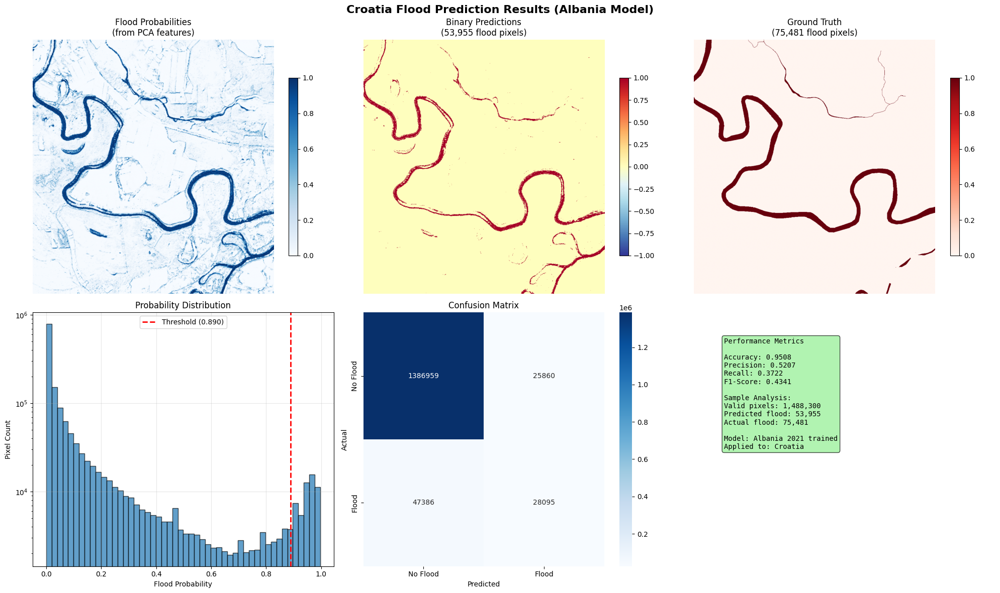

   ✅ Visualization saved: Croatia_2018_patch_1_flood_PCA_RGB_20250928_155849_prediction_results_20250928_160209.png

💾 Saving prediction results...
   ✅ Probabilities: Croatia_2018_patch_1_flood_PCA_RGB_20250928_155849_flood_probabilities_20250928_160217.tif
   ✅ Binary predictions: Croatia_2018_patch_1_flood_PCA_RGB_20250928_155849_flood_predictions_20250928_160217.tif
   ✅ Report: Croatia_2018_patch_1_flood_PCA_RGB_20250928_155849_prediction_report_20250928_160217.txt

🎉 Flood prediction completed successfully!

🎯 Cross-region prediction analysis:
   Model trained on: Albania 2021
   Applied to: Croatia 2018
   Predicted flood coverage: 3.63%
   Performance vs ground truth:
     F1-Score: 0.4341
     Accuracy: 0.9508

📁 Results saved to: /content/drive/MyDrive/flood_predictions_croatia


In [13]:
import numpy as np
import rasterio
import joblib
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns
from datetime import datetime
import os
from tqdm import tqdm
import gc

def load_pca_tiff_and_predict(pca_tiff_path, model_path, ground_truth_path=None, chunk_size=50000):
    """
    Load PCA TIFF file and run flood predictions

    Parameters:
    - pca_tiff_path: Path to the PCA RGB TIFF file (3 bands)
    - model_path: Path to trained XGBoost model
    - ground_truth_path: Optional path to ground truth flood mask
    - chunk_size: Size of chunks for memory-efficient processing
    """

    print("🎯 Flood Prediction Pipeline on PCA TIFF")
    print("=" * 60)

    # Load model and optimal threshold
    print("🤖 Loading trained model...")
    try:
        model = joblib.load(model_path)
        print(f"   ✅ Model loaded: {os.path.basename(model_path)}")

        # Try to load optimal threshold
        results_path = model_path.replace('_model.joblib', '_results.joblib')
        if os.path.exists(results_path):
            results = joblib.load(results_path)
            optimal_threshold = results.get('optimal_threshold', 0.5)
            print(f"   ✅ Optimal threshold: {optimal_threshold:.6f}")
        else:
            print("   ⚠️  Results file not found, using default threshold 0.5")
            optimal_threshold = 0.890
    except Exception as e:
        print(f"   ❌ Error loading model: {e}")
        return None

    # Load PCA TIFF
    print(f"\n📖 Loading PCA TIFF file...")
    try:
        with rasterio.open(pca_tiff_path) as src:
            print(f"   📏 Dimensions: {src.width} x {src.height}")
            print(f"   🎯 Bands: {src.count}")
            print(f"   🗺️  CRS: {src.crs}")

            if src.count != 3:
                print(f"   ⚠️  Expected 3 bands (PC1, PC2, PC3), got {src.count}")

            # Read all bands: Shape (3, height, width)
            pca_data = src.read()
            profile = src.profile
            bands, height, width = pca_data.shape
            total_pixels = height * width

            print(f"   💾 Data shape: {pca_data.shape}")
            print(f"   📊 Total pixels: {total_pixels:,}")
    except Exception as e:
        print(f"   ❌ Error loading PCA TIFF: {e}")
        return None

    # Load ground truth if provided
    ground_truth_data = None
    if ground_truth_path and os.path.exists(ground_truth_path):
        print(f"\n📖 Loading ground truth...")
        try:
            with rasterio.open(ground_truth_path) as src:
                ground_truth_data = src.read(1)  # First band only
                print(f"   ✅ Ground truth loaded: {ground_truth_data.shape}")

                # Calculate ground truth statistics
                gt_flood_pixels = np.sum(ground_truth_data == 1)
                gt_total_pixels = ground_truth_data.size
                gt_flood_percent = (gt_flood_pixels / gt_total_pixels) * 100
                print(f"   🌊 Ground truth flood: {gt_flood_pixels:,} pixels ({gt_flood_percent:.2f}%)")
        except Exception as e:
            print(f"   ⚠️  Error loading ground truth: {e}")
            ground_truth_data = None

    # Prepare data for prediction
    print(f"\n🔄 Preparing PCA data for prediction...")

    # Reshape to (pixels, 3) for model input
    pca_reshaped = pca_data.reshape(bands, -1).T  # Shape: (pixels, 3)

    # Handle invalid pixels
    valid_mask = (~np.isnan(pca_reshaped).any(axis=1) &
                  ~np.isinf(pca_reshaped).any(axis=1))

    valid_data = pca_reshaped[valid_mask]
    valid_count = np.sum(valid_mask)

    print(f"   ✅ Valid pixels: {valid_count:,} / {total_pixels:,} ({valid_count/total_pixels*100:.1f}%)")

    if valid_count == 0:
        print("   ❌ No valid pixels found!")
        return None

    # Run predictions in chunks
    print(f"\n🎯 Running flood predictions...")
    n_chunks = (valid_count + chunk_size - 1) // chunk_size
    print(f"   🧩 Processing {valid_count:,} pixels in {n_chunks} chunks...")

    # Initialize prediction arrays
    flood_probabilities = np.full(total_pixels, np.nan, dtype=np.float32)
    flood_predictions = np.full(total_pixels, -1, dtype=np.int8)

    # Get valid pixel indices
    valid_indices = np.where(valid_mask)[0]

    # Process in chunks
    for i in tqdm(range(n_chunks), desc="   Predicting"):
        start_idx = i * chunk_size
        end_idx = min((i + 1) * chunk_size, valid_count)

        chunk_indices = valid_indices[start_idx:end_idx]
        chunk_data = valid_data[start_idx:end_idx]

        try:
            # Get probabilities
            chunk_probs = model.predict_proba(chunk_data)[:, 1]
            chunk_binary = (chunk_probs >= optimal_threshold).astype(np.int8)

            # Store results
            flood_probabilities[chunk_indices] = chunk_probs
            flood_predictions[chunk_indices] = chunk_binary

        except Exception as e:
            print(f"❌ Error in chunk {i}: {e}")
            continue

        # Memory cleanup
        if i % 10 == 0:
            gc.collect()

    # Reshape results back to spatial dimensions
    prob_raster = flood_probabilities.reshape(height, width)
    binary_raster = flood_predictions.reshape(height, width)

    # Calculate prediction statistics
    valid_probs = flood_probabilities[valid_indices]
    valid_binary = flood_predictions[valid_indices]

    pred_flood_pixels = np.sum(valid_binary == 1)
    pred_flood_percentage = (pred_flood_pixels / valid_count) * 100

    print(f"   📊 Prediction results:")
    print(f"      Flood pixels predicted: {pred_flood_pixels:,} ({pred_flood_percentage:.2f}%)")
    print(f"      Probability range: {np.min(valid_probs):.6f} - {np.max(valid_probs):.6f}")
    print(f"      Mean probability: {np.mean(valid_probs):.6f}")

    # Evaluate against ground truth if available
    metrics = None
    gt_aligned = None
    if ground_truth_data is not None:
        print(f"\n📊 Evaluating against ground truth...")

        # Align ground truth to prediction dimensions if needed
        if ground_truth_data.shape != (height, width):
            print(f"   🔧 Resizing ground truth from {ground_truth_data.shape} to ({height}, {width})")
            from scipy.ndimage import zoom
            zoom_factors = (height / ground_truth_data.shape[0], width / ground_truth_data.shape[1])
            gt_aligned = zoom(ground_truth_data, zoom_factors, order=0)  # nearest neighbor
        else:
            gt_aligned = ground_truth_data

        # Compare predictions with ground truth
        valid_pred_mask = (binary_raster >= 0)
        valid_gt_mask = ~np.isnan(gt_aligned)
        combined_valid = valid_pred_mask & valid_gt_mask

        pred_flat = binary_raster[combined_valid]
        gt_flat = gt_aligned[combined_valid].astype(int)

        if len(pred_flat) > 0:
            # Calculate metrics
            accuracy = accuracy_score(gt_flat, pred_flat)
            precision = precision_score(gt_flat, pred_flat, zero_division=0)
            recall = recall_score(gt_flat, pred_flat, zero_division=0)
            f1 = f1_score(gt_flat, pred_flat, zero_division=0)
            cm = confusion_matrix(gt_flat, pred_flat)

            metrics = {
                'accuracy': accuracy,
                'precision': precision,
                'recall': recall,
                'f1_score': f1,
                'confusion_matrix': cm,
                'n_samples': len(pred_flat),
                'pred_flood': np.sum(pred_flat),
                'true_flood': np.sum(gt_flat)
            }

            print(f"   ✅ Evaluation completed on {len(pred_flat):,} pixels")
            print(f"   📈 Performance metrics:")
            print(f"      Accuracy: {accuracy:.4f}")
            print(f"      Precision: {precision:.4f}")
            print(f"      Recall: {recall:.4f}")
            print(f"      F1-Score: {f1:.4f}")
        else:
            print("   ⚠️  No valid pixels for comparison")

    # Create visualizations
    print(f"\n📊 Creating visualizations...")
    create_prediction_visualizations(prob_raster, binary_raster, gt_aligned, metrics,
                                   pca_tiff_path, optimal_threshold)

    # Save results
    print(f"\n💾 Saving prediction results...")
    save_dir = os.path.dirname(pca_tiff_path)
    timestamp = datetime.now().strftime("%Y%m%d_%H%M%S")
    base_name = os.path.splitext(os.path.basename(pca_tiff_path))[0]

    # Save probability raster
    prob_output = os.path.join(save_dir, f"{base_name}_flood_probabilities_{timestamp}.tif")
    prob_profile = profile.copy()
    prob_profile.update(dtype=rasterio.float32, count=1, compress='lzw')

    with rasterio.open(prob_output, 'w', **prob_profile) as dst:
        dst.write(prob_raster, 1)
        dst.descriptions = ['Flood Probability']

    # Save binary predictions
    binary_output = os.path.join(save_dir, f"{base_name}_flood_predictions_{timestamp}.tif")
    binary_profile = profile.copy()
    binary_profile.update(dtype=rasterio.int8, count=1, compress='lzw', nodata=-1)

    with rasterio.open(binary_output, 'w', **binary_profile) as dst:
        dst.write(binary_raster, 1)
        dst.descriptions = ['Flood Prediction (Binary)']

    print(f"   ✅ Probabilities: {os.path.basename(prob_output)}")
    print(f"   ✅ Binary predictions: {os.path.basename(binary_output)}")

    # Create summary report
    report_output = os.path.join(save_dir, f"{base_name}_prediction_report_{timestamp}.txt")
    with open(report_output, 'w') as f:
        f.write("Flood Prediction Results Report\n")
        f.write("=" * 40 + "\n\n")
        f.write(f"Input PCA TIFF: {os.path.basename(pca_tiff_path)}\n")
        f.write(f"Model: {os.path.basename(model_path)}\n")
        f.write(f"Optimal threshold: {optimal_threshold:.6f}\n")
        f.write(f"Processing date: {datetime.now().strftime('%Y-%m-%d %H:%M:%S')}\n\n")

        f.write("Dataset Information:\n")
        f.write("-" * 20 + "\n")
        f.write(f"Dimensions: {width} x {height}\n")
        f.write(f"Total pixels: {total_pixels:,}\n")
        f.write(f"Valid pixels: {valid_count:,} ({valid_count/total_pixels*100:.1f}%)\n\n")

        f.write("Prediction Results:\n")
        f.write("-" * 20 + "\n")
        f.write(f"Flood pixels predicted: {pred_flood_pixels:,} ({pred_flood_percentage:.2f}%)\n")
        f.write(f"Probability range: {np.min(valid_probs):.6f} - {np.max(valid_probs):.6f}\n")
        f.write(f"Mean probability: {np.mean(valid_probs):.6f}\n\n")

        if metrics:
            f.write("Performance vs Ground Truth:\n")
            f.write("-" * 30 + "\n")
            f.write(f"Accuracy: {metrics['accuracy']:.4f}\n")
            f.write(f"Precision: {metrics['precision']:.4f}\n")
            f.write(f"Recall: {metrics['recall']:.4f}\n")
            f.write(f"F1-Score: {metrics['f1_score']:.4f}\n")
            f.write(f"Comparison samples: {metrics['n_samples']:,}\n")
            f.write(f"Predicted flood pixels: {metrics['pred_flood']:,}\n")
            f.write(f"Actual flood pixels: {metrics['true_flood']:,}\n")

    print(f"   ✅ Report: {os.path.basename(report_output)}")

    print(f"\n🎉 Flood prediction completed successfully!")
    print("=" * 60)

    return {
        'probability_raster': prob_output,
        'binary_raster': binary_output,
        'report': report_output,
        'metrics': metrics,
        'pred_flood_percentage': pred_flood_percentage,
        'optimal_threshold': optimal_threshold
    }

def create_prediction_visualizations(prob_raster, binary_raster, gt_data, metrics,
                                   pca_path, threshold):
    """Create comprehensive visualization plots"""

    try:
        fig, axes = plt.subplots(2, 3, figsize=(20, 12))

        # Extract region info from filename
        base_name = os.path.basename(pca_path)
        region_info = base_name.split('_')[0] if '_' in base_name else 'Region'

        fig.suptitle(f'{region_info} Flood Prediction Results (Albania Model)',
                     fontsize=16, fontweight='bold')

        # Plot 1: Probability map
        im1 = axes[0,0].imshow(prob_raster, cmap='Blues', vmin=0, vmax=1, aspect='auto')
        axes[0,0].set_title('Flood Probabilities\n(from PCA features)')
        axes[0,0].axis('off')
        plt.colorbar(im1, ax=axes[0,0], shrink=0.7)

        # Plot 2: Binary predictions
        pred_flood_count = np.sum(binary_raster == 1)
        im2 = axes[0,1].imshow(binary_raster, cmap='RdYlBu_r', vmin=-1, vmax=1, aspect='auto')
        axes[0,1].set_title(f'Binary Predictions\n({pred_flood_count:,} flood pixels)')
        axes[0,1].axis('off')
        plt.colorbar(im2, ax=axes[0,1], shrink=0.7)

        # Plot 3: Ground truth (if available)
        if gt_data is not None:
            true_flood_count = np.sum(gt_data == 1)
            im3 = axes[0,2].imshow(gt_data, cmap='Reds', vmin=0, vmax=1, aspect='auto')
            axes[0,2].set_title(f'Ground Truth\n({true_flood_count:,} flood pixels)')
            axes[0,2].axis('off')
            plt.colorbar(im3, ax=axes[0,2], shrink=0.7)
        else:
            axes[0,2].text(0.5, 0.5, 'Ground Truth\nNot Available',
                          ha='center', va='center', transform=axes[0,2].transAxes,
                          fontsize=12, bbox=dict(boxstyle="round,pad=0.3", facecolor="lightgray"))
            axes[0,2].set_title('Ground Truth')

        # Plot 4: Probability histogram
        valid_probs = prob_raster[~np.isnan(prob_raster) & (prob_raster >= 0)]
        if len(valid_probs) > 0:
            axes[1,0].hist(valid_probs, bins=50, alpha=0.7, edgecolor='black')
            axes[1,0].axvline(threshold, color='red', linestyle='--', linewidth=2,
                             label=f'Threshold ({threshold:.3f})')
            axes[1,0].set_xlabel('Flood Probability')
            axes[1,0].set_ylabel('Pixel Count')
            axes[1,0].set_title('Probability Distribution')
            axes[1,0].legend()
            axes[1,0].set_yscale('log')
            axes[1,0].grid(True, alpha=0.3)

        # Plot 5: Confusion matrix (if metrics available)
        if metrics and 'confusion_matrix' in metrics:
            cm = metrics['confusion_matrix']
            sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', ax=axes[1,1])
            axes[1,1].set_xlabel('Predicted')
            axes[1,1].set_ylabel('Actual')
            axes[1,1].set_title('Confusion Matrix')
            axes[1,1].set_xticklabels(['No Flood', 'Flood'])
            axes[1,1].set_yticklabels(['No Flood', 'Flood'])
        else:
            axes[1,1].text(0.5, 0.5, 'Confusion Matrix\nNot Available',
                          ha='center', va='center', transform=axes[1,1].transAxes,
                          fontsize=12, bbox=dict(boxstyle="round,pad=0.3", facecolor="lightgray"))
            axes[1,1].set_title('Confusion Matrix')

        # Plot 6: Performance summary
        axes[1,2].axis('off')
        if metrics:
            metrics_text = f"""
Performance Metrics

Accuracy: {metrics['accuracy']:.4f}
Precision: {metrics['precision']:.4f}
Recall: {metrics['recall']:.4f}
F1-Score: {metrics['f1_score']:.4f}

Sample Analysis:
Valid pixels: {metrics['n_samples']:,}
Predicted flood: {metrics['pred_flood']:,}
Actual flood: {metrics['true_flood']:,}

Model: Albania 2021 trained
Applied to: {region_info}
            """
            color = "lightgreen"
        else:
            metrics_text = f"""
Prediction Summary

Model: Albania 2021 trained
Applied to: {region_info}
Threshold: {threshold:.6f}

Total flood predicted:
{pred_flood_count:,} pixels

Ground truth comparison:
Not available
            """
            color = "lightblue"

        axes[1,2].text(0.1, 0.9, metrics_text.strip(),
                      transform=axes[1,2].transAxes, fontsize=10,
                      verticalalignment='top', fontfamily='monospace',
                      bbox=dict(boxstyle="round,pad=0.3", facecolor=color, alpha=0.7))

        plt.tight_layout()

        # Save plot
        save_dir = os.path.dirname(pca_path)
        timestamp = datetime.now().strftime("%Y%m%d_%H%M%S")
        base_name = os.path.splitext(os.path.basename(pca_path))[0]
        plot_output = os.path.join(save_dir, f"{base_name}_prediction_results_{timestamp}.png")

        plt.savefig(plot_output, dpi=300, bbox_inches='tight')
        plt.show()

        print(f"   ✅ Visualization saved: {os.path.basename(plot_output)}")

    except Exception as e:
        print(f"   ⚠️  Could not create visualization: {e}")

# Main execution
def main():
    """Run flood prediction on Croatia PCA TIFF"""

    # File paths - Update these for your specific files
    pca_tiff_path = "/content/drive/MyDrive/flood_predictions_croatia/Croatia_2018_patch_1_flood_PCA_RGB_20250928_155849.tif"
    model_path = "/content/drive/MyDrive/XGBoost_Flood_Models/Albania_2021_20250927_212646_optimized_xgboost_20250928_011003_model.joblib"
    ground_truth_path = "/content/drive/MyDrive/data/Annual_Flood_Aggregates_Sentinel1_trials_operational/Croatia/flood_patches_top/Croatia_2018_patch_1_flood.tif"

    # Check if files exist
    if not os.path.exists(pca_tiff_path):
        print(f"❌ PCA TIFF not found: {pca_tiff_path}")
        return

    if not os.path.exists(model_path):
        print(f"❌ Model not found: {model_path}")
        return

    print(f"📁 Input files:")
    print(f"   PCA TIFF: {os.path.basename(pca_tiff_path)}")
    print(f"   Model: {os.path.basename(model_path)}")
    print(f"   Ground truth: {os.path.basename(ground_truth_path) if os.path.exists(ground_truth_path) else 'Not available'}")

    # Run prediction pipeline
    results = load_pca_tiff_and_predict(
        pca_tiff_path=pca_tiff_path,
        model_path=model_path,
        ground_truth_path=ground_truth_path if os.path.exists(ground_truth_path) else None,
        chunk_size=50000
    )

    if results:
        print(f"\n🎯 Cross-region prediction analysis:")
        print(f"   Model trained on: Albania 2021")
        print(f"   Applied to: Croatia 2018")
        print(f"   Predicted flood coverage: {results['pred_flood_percentage']:.2f}%")

        if results['metrics']:
            print(f"   Performance vs ground truth:")
            print(f"     F1-Score: {results['metrics']['f1_score']:.4f}")
            print(f"     Accuracy: {results['metrics']['accuracy']:.4f}")

        print(f"\n📁 Results saved to: {os.path.dirname(pca_tiff_path)}")

if __name__ == "__main__":
    main()